# <center>Feedforward and Backpropagation</center>
## <center>Inclass Project 2 - MA4144</center>

This project contains 10 tasks/questions to be completed, some require written answers. Open a markdown cell below the respective question that require written answers and provide (type) your answers. Questions that required written answers are given in blue fonts. Almost all written questions are open ended, they do not have a correct or wrong answer. You are free to give your opinions, but please provide related answers within the context.

After finishing project run the entire notebook once and **save the notebook as a pdf** (File menu -> Save and Export Notebook As -> PDF). You are **required to upload this PDF on moodle**.

***

## Outline of the project

The aim of the project is to build a Multi Layer perceptron (MLP) model from scratch for binary classification. That is given an input $x$ output the associated class label $0$ or $1$.

In particular, we will classify images of handwritten digits ($0, 1, 2, \cdots, 9$). For example, given a set of handwritten digit images that only contain two digits (Eg: $1$ and $5$) the model will classify the images based on the written digit.

For this we will use the MNIST dataset (collection of $28 \times 28$ images of handwritten digits) - you can find additional information about MNIST [here](https://en.wikipedia.org/wiki/MNIST_database).

<img src="https://upload.wikimedia.org/wikipedia/commons/f/f7/MnistExamplesModified.png" width="250">

***


Use the below cell to use any include any imports

In [5]:
import numpy as np
from keras.datasets import mnist
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import seaborn as sns

2024-09-17 15:11:31.192668: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-17 15:11:31.200975: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-17 15:11:31.217284: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-17 15:11:31.240804: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-17 15:11:31.247525: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-17 15:11:31.268984: I tensorflow/core/platform/cpu_feature_gu

## Section 1: Preparing the data

In [6]:
#Load the dataset as training and testing, then print out the shapes of the data matrices

(train_X, train_y), (test_X, test_y) = mnist.load_data()
print(train_X.shape)
print(test_X.shape)
print(train_y.shape)
print(test_y.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000,)
(10000,)


**Q1.** In the following cell write code to display $5$ random images in train_X and it's corresponding label in train_y. Each time it is run, you should get a different set of images. The imshow function in the matplotlib library could be useful. Display them as [grayscale images](https://en.wikipedia.org/wiki/Grayscale).

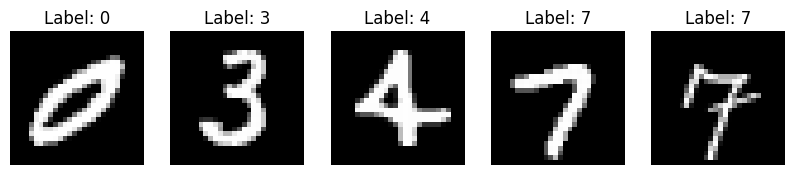

In [13]:
num_images = 5

indices = np.random.choice(train_X.shape[0], num_images, replace=False)

plt.figure(figsize=(10,10))
for i, idx in enumerate(indices):
    plt.subplot(1, num_images, i + 1)
    plt.imshow(train_X[idx], cmap='gray')
    plt.title(f'Label: {train_y[idx]}')
    plt.axis('off')
plt.show()




**Q2.** Given two digits $d_1$ and $d_2$, both between $0$ and $9$, in the following cell fill in the function body to extract all the samples corresponding to $d_1$ or $d_2$ only, from the dataset $X$ and labels $y$. You can use the labels $y$ to filter the dataset. Assume that the $i$th image $X[i]$ in $X$ is given by $y[i]$. The function should return the extracted samples $X_{extracted}$ and corresponding labels $y_{extracted}$. Avoid using for loops as much as possible, infact you do not need any for loops. numpy.where function should be useful.

In [8]:
def extract_digits(X, y, d1, d2):
    
    indices = np.where((y == d1) | (y == d2))[0]
    
    X_extracted = X[indices]
    y_extracted = y[indices]

    return (X_extracted, y_extracted)


**Q3.** Both the training dataset train_X and test_y is a 3 dimensional numpy array, each image occupies 2 dimensions. For convenience of processing data we usually comvert each $28 \times 28$ image matrix to a vector with $784$ entries. We call this process **vectorize images**.

Once we vectorize the images, the vectorized data set would be structured as follows: $i$th row will correspond to a single image and $j$th column will correspond to the $j$th pixel value of each vectorized image. However going along with the convention we discussed in the lecture, the input to the MLP model will require that the columns correspond to individual images. Hence we also require a transpose of the vectorized results.

The pixel values in the images will range from $0$ to $255$. Normalize the pixel values between $0$ and $1$, by dividing each pixel value of each image by the maximum pixel value of that image. Simply divide each column of the resulting matrix above by the max of each column. 

<center><img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTdN_8m9FEqjqAB07obTmB6gNc7S2rSoGBYaA&s"></center>

Given a dataset $X$ of size $N \times 28 \times 28$, in the following cell fill in the function to do the following in order;
1. Vectorize the dataset resulting in dataset of size $N \times 784$.
2. Transpose the vectorized result.
3. Normalize the pixel values of each image.
4. Finally return the vectorized, transposed and normalized dataset $X_{transformed}$.

Again, avoid for loops, functions such as numpy.reshape, numpy.max etc should be useful.

In [9]:
def vectorize_images(X):

    N, H, W = X.shape
    #vectorize the X matrix (N*28*28 to N*784)
    X_vectorized = X.reshape(N, H * W)
    
    #transpose the vectorized X matrix
    X_transposed = X_vectorized.T

    #get  maximum value in seach column(each column represent an image)
    max_vals = np.max(X_transposed, axis=0, keepdims=True)

    # Add a very small value to avoid division by zero
    max_vals[max_vals == 0] = 1e-10

    #divide all the pixels of an image by the maximum value
    X_transformed = X_transposed / (max_vals)

    return( X_transformed)


**Q4.** In the following cell write code to;

1. Extract images of the digits $d_1 = 1$ and $d_2 = 5$ with their corresponding labels for both the training set (train_X, train_y) and testing set (test_X, test_y) separately.
2. Then vectorize the data, tranpose the result and normlize the images.
3. Store the results after the final transformations in numpy arrays train_X_1_5, train_y_1_5, test_X_1_5, test_y_1_5
4. Our MLP will output only class labels $0$ and $1$ (not $1$ and $5$), so create numpy arrays to store the class labels as follows:
   $d_1 = 1$ -> class label = 0 and $d_2 = 5$ -> class label = 1. Store them in the arrays named train_class_1_5, test_class_1_5.

Use the above functions you implemented above to complete this task. In addtion, numpy.where could be useful. Avoid for loops as much as possible.

In [11]:
def transform_data_and_labels(train_X, train_y, test_X,test_y, d1, d2):
    train_X_extracted, train_y_extracted = extract_digits(train_X, train_y, d1, d2)
    test_X_extracted, test_y_extracted = extract_digits(test_X, test_y, d1, d2)

    # Vectorize the images
    train_X_d1_d2 = vectorize_images(train_X_extracted)  # final train X
    test_X_d1_d2 = vectorize_images(test_X_extracted)    # final test X

    train_y_d1_d2 = train_y_extracted
    test_y_d1_d2 = test_y_extracted

    #Convert labels: map d1 to 0, and d2 to 1
    train_class_d1_d2 = np.where(train_y_extracted == d1, 0, 1)     # final train Y
    test_class_d1_d2 = np.where(test_y_extracted == d1, 0, 1)       # final test Y

    return (train_y_d1_d2, test_y_d1_d2), (train_X_d1_d2, train_class_d1_d2), (test_X_d1_d2, test_class_d1_d2)

(train_y_1_5, test_y_1_5), (train_X_1_5 ,train_class_1_5), (test_X_1_5,test_class_1_5) = transform_data_and_labels(train_X, train_y, test_X, test_y, 1, 5)

print("No of training labels: ",train_class_1_5.shape)
print("No of test labels: ",test_class_1_5.shape)

print(train_y_1_5)
# 1--> 0 , 5---> 1
print(train_class_1_5)

print(test_y_1_5)
# 1--> 0 , 5---> 1
print(test_class_1_5)


No of training labels:  (12163,)
No of test labels:  (2027,)
[5 1 1 ... 5 1 5]
[1 0 0 ... 1 0 1]
[1 1 5 ... 5 1 5]
[0 0 1 ... 1 0 1]


## Section 2: Implementing MLP from scratch with training algorithms.

Now we will implement code to build a customizable MLP model. The hidden layers will have the **Relu activation function** and the final output layer will have **Sigmoid activation function**.

**Q5.** Recall the following about the activation functions:
1. Sigmoid activation: $y = \sigma(z) = \frac{1}{1 + e^{-z}}$.
2. Derivative of Sigmoid: $y' = \sigma'(z) = \sigma(z) (1 - \sigma(z)) = y(1-y)$
3. ReLu activation: $y = ReLu(z) = max(0, z)$
4. Derivative of ReLu: $y' = ReLu'(z) = \begin{cases} 0 \; \textrm{if } z < 0 \\ 1 \; \textrm{otherwise} \end{cases} = \begin{cases} 0 \; \textrm{if } y = 0 \\ 1 \; \textrm{otherwise} \end{cases}$

In the following cell implement the functions to compute activation functions Sigmoid and ReLu given $z$ and derivatives of the Sigmoid and ReLu activation functions given $y$. Note that the input to the derivative functions is $y$ not $z$.

In practice the input will not be just single numbers, but matrices. So functions or derivatives should be applied elementwise on matrices. Again avoid for loops, use the power of numpy arrays - search for numpy's capability of doing elementwise computations.

Important: When implementing the sigmoid function make sure you handle overflows due to $e^{-z}$ being too large. To avoid you can choose to set the sigmoid value to 'the certain appropriate value' if $z$ is less than a certain good enough negative threshold. If you do not handle overflows, the entire result will be useless fince the MLP will just output Nan (not a number) for evry input at the end.

In [115]:
def sigmoid(Z):
    #  for final output layer

    #  clip the values of Z higher than 50 or less than 50
    Z = np.clip(Z, -500, 500) 
    sigma = 1 / (1 + np.exp(-Z))  
    return(sigma)

def deriv_sigmoid(Y):
    #for hidden layers
    
    #y' = σ'(z) = y(1-y)
    sigma_prime = Y * (1 - Y) 

    return(sigma_prime)

def ReLu(Z, max_value=1e10):
    # Clamp Z to be within the range [0, max_value]
    Z_clamped = np.clip(Z, 0, max_value)
    relu = np.maximum(0, Z_clamped)
    return relu

def deriv_ReLu(Y):
    # if y = 0 --> y' =0
    # else  --> y' =1
    relu_prime = np.where(Y > 0, 1, 0)
    
    return(relu_prime)



**Q6.** The following piece of code defines a simple MLP architecture as a Python class and subsequent initialization of a MLP model. <font color='blue'>Certain lines of code contains commented line numbers. Write a short sentence for each such line explaining its purpose. Feel free to refer to the lecture notes or any resources to answers these question. In addition, explain what the Y, Z, W variables refer to and their purpose</font>

In [116]:
class NNet:
    def __init__(self, input_size = 784, output_size = 1, batch_size = 1000, hidden_layers = [500, 250, 50]):
        self.Y = []
        self.Z = []
        self.W = []
        self.input_size = input_size
        self.output_size = output_size
        self.batch_size = batch_size
        self.hidden_layers = hidden_layers

        layers = [input_size] + hidden_layers + [output_size]
        L = len(hidden_layers) + 1 # L = 4
    
        for i in range(1, L + 1):
            #create numpy array of layer_size * batch_size
            self.Y.append(np.zeros((layers[i], batch_size)))                        #line1
            self.Z.append(np.zeros((layers[i], batch_size)))                        #Line2
            self.W.append(2*(np.random.rand(layers[i], layers[i-1] + 1) - 0.5))     #Line3


**Answers** (to write answers edit this cell)

(i) What does the Y, Z, W variables refer to and their purpose?

Y : Used to store the activation values for each layer in the network  after the application of activation function. 

Z : Used to stores the the values after values from the multipliaction of W and Y(l-1), for each layer before applying the      activation function

W : USed to store the weight matrices for each layer, including biases.


(ii) Line1: Explanation

This initializes a matrix with zeros for storing the activations of the neurons in the i-th layer, with the number of rows corresponding to the number of neurons in that layer and the number of columns corresponding to the batch size. Then the matrix is appended to list Y. Therefore this line creates matrices for each layer(hidden layers and output layer) to keep track of activation valyes(Y(l)) for each batch


(iii) Line2: Explanation

This initializes a matrix with zeros for storing the pre activations values of the neurons in the i-th layer, with the number of rows corresponding to the number of neurons in that layer and the number of columns corresponding to the batch size. The matrix is appended to list Z. Therefore this line creates matrices for each layer(hidden layers and output layer) to keep track of pre activation valyes(Z(l)) for each batch


(iv) Line3: Explanation

This initializes the weight matrix for the connections between the (i-1)th layer and the (i)th layer with random values in the range [-1, 1]. Number of rows of the matrix corresponds to the number of neurons in (i)th layer and the number of columns  correspond to the number of neurons in (i-1)th layer plus one. That extra column is to contain the bias value of each neuron in (i)th layer. to include the bias term. After creating the matrix it then appends this matrix to the list W.

**Q7.** Now we will implement the feedforward algorithm. Recall from the lectures that for each layer $l$ there is input $Y^{(l-1)}$ from the previous layer if $l > 1$ and input data $X$ if $l = 1$. Then we compute $Z^{(l)}$ using the weight matrix $W^{(l)}$ as follows from matrix multiplication:

$Z^{(l)} = W^{(l)} Y^{(l-1)}$

Make sure that during multiplication you add an additional row of one's to $Y^{(l-1)}$ to accommodate the bias term. However, the rows of ones should not permanently remain on $Y^{(l-1)}$. <font color='blue'>Explain what the bias term is and how adding a row of one's help with the bias terms.</font> During definition above the weight matrices are initialised to afford this extra bias term, so no change to either $Z^{(l)}$ or $W^{(l)}$ is needed.

Next compute $Y^{(l)}$, the output of layer $l$ by activation through sigmoid.

$Y^{(l)} = \sigma(Z^{(l)})$

The implemented feedforward algorithm should take in a NNet model and an input matrix $X$ and output the modified MLP model - the $Y$'s and $Z$'s computed should be stored in the model for the backpropagation algorithm.

As usual avoid for loops as much as possible, use the power of numpy. However, you may use a for loop to iterate through the layers of the model.

In [117]:
def feedforward(model, X):

    L = len(model.Y)

    for i in range(L):
        if i == 0:
            #add a row of ones to the bottom of X to account for the bias term
            X_with_bias_row = np.vstack([X, np.ones(X.shape[1])])
            # Compute Z = W * X
            model.Z[i] = np.matmul(model.W[i], X_with_bias_row)            

        else:
            #add a row of ones to the bottom of the previous layer's (Y_l-1) activations
            Y_with_bias_row = np.vstack([model.Y[i-1], np.ones(model.Y[i-1].shape[1])])  
            # Compute Z = W * X        
            model.Z[i] = np.matmul(model.W[i], Y_with_bias_row)


        if(i == L-1):
            model.Y[i] = sigmoid(model.Z[i])
        else:
            model.Y[i] = ReLu(model.Z[i])

    return model
    

**Answer** (to write answers edit this cell)

Explain what the bias term is and how adding a row of one's help with the bias terms.

Bias is a constant which is added to the product of features(x) and weights(w).
 
 z = w.x + b

Where:
w is the weight matrix,

x is the input matrix,

b is the bias term,

In each neuron, after the addition of feature values and respective weight values, this bias (b) is added to the output before appying the actiavtion function. This values is used to shift the activation fucntion to the left or right.

Weight matrix(w) has dimentions of n(l) * n(l-1) + 1 , where that additional column contains the bias values of each neuron in (l)th layer. Therefore an additional row of ones is added to the featur matrix(y) of (l-1)th layer in order to add the bias term automatically within the matrix multiplication. 

For an example if the 1st column of w is [w11 w12 w13 b] and 1st row of y is [y1 y2 y3 1] then corrsponding z value is
         
z11 = w11 * y1 +  w12 * y2 + w13 * y3 + b

Therefore, those additional one's help with adding the bias term to w.y product of each neuron.

**Q8.** Now we will implement the backpropagation algorithm. The cost function $C$ at the end is given by the square loss.

$C = \frac{1}{2} ||Y^{(L)} - Y||^{2}$, where $Y^{(L)}$ is the final output vector of the feedforward algorithm and $Y$ is the actual label vector associated with the input $X$.

At each layer $l = 1, 2, \cdots, L$ we compute the following (note that the gradients are matrices with the same dimensions as the variable to which we derivating with respect to):

1. Gradient of $C$ with respect to $Z^{(l)}$ as <br> $\frac{\partial C}{\partial Z^{(l)}} = deriv(A^{(l)}(Z^{(l)})) \odot \frac{\partial C}{\partial Y^{(L)}}$, <br> where $A^{(l)}$ is the activation function of the $l$th layer, and we use the derivative of that here. The $\odot$ refers to the elementwise multiplication.

2. Gradient of $C$ with respect to $W^{(l)}$ as <br> $\frac{\partial C}{\partial W^{(l)}} = \frac{\partial C}{\partial Z^{(l)}} (Y^{(l-1)})^{T}$ <br> this is entirely matrix multiplication.

3. Gradient of $C$ with respect to $Y^{(l-1)}$ as <br> $\frac{\partial C}{\partial Y^{(l-1)}} = (W^{(l)})^{T} \frac{\partial C}{\partial Z^{(l)}}$ <br> this is also entirely matrix multiplication.

4. Update weights by: <br> $W^{(l)} \leftarrow W^{(l)} - \eta \frac{\partial C}{\partial W^{(l)}}$, <br> where $\eta > 0$ is the learning rate.

The loss derivative (the gradient of $C$ with respect to $Y^{(L)}$) at the last layer is given by:

$\frac{\partial C}{\partial Y^{(L)}} = Y^{(L)} - Y$

By convention we consider $Y^{(0)} = X$, the input data.

Based on the backpropagation algorithm implement the backpropagation method in the following cell. Remember to temporarily add a row of ones to $Y^{(l-1)}$ when computing $\frac{\partial C}{\partial W^{(l)}}$ as we discussed back in the feedforward algorithm. Make sure you avoid for loops as much as possible.

The function takes in a NNet model, input data $X$ and the corresponding class labels $Y$. learning rate can be set as desired.

In [118]:
def backpropagation(model, X, Y, eta = 0.01):
    L = len(model.Y)

    C_Y_prev =0

    for i in range(L-1,-1,-1):
        # output layer
        if(i == L-1):           
            #calculate dba C/ dbaY_l
            C_Y_l = model.Y[i] - Y
            #calculate dba Y_l/dba Z_l (deriv(A(l)Z(l)))
            deriv_y_l = deriv_sigmoid(model.Y[i])
            
        # hidden layers
        else:
            C_Y_l = C_Y_prev

            #calculate dba Y_l/ dba Z_l (deriv(A(l)Z(l)))
            deriv_y_l = deriv_ReLu(model.Y[i])
           
        # step 1: calculate dba C/dba Z_l
        C_Z_l = deriv_y_l * C_Y_l

    
        # step 2: calculate dba C/dba W_l
        if(i == 0):  #layer after the input layer
            Y_pred_prev =  np.vstack([X, np.ones(X.shape[1])])
           
        else:
            Y_pred_prev =  np.vstack([model.Y[i-1], np.ones(model.Y[i-1].shape[1])])

        C_W_l = np.matmul(C_Z_l, Y_pred_prev.T)

        # step 3: calculate dba C/dba Y_l-1
        C_Y_prev  = np.matmul(model.W[i].T, C_Z_l)      #prev = l-1
       
        # Remove the last row from C_Y_prev
        C_Y_prev = C_Y_prev[:-1, :]
        

        # step 4: update weights
        model.W[i] = model.W[i] - eta * C_W_l

    return(model)


**Q9.** Now implement the training algorithm.

The training method takes in training data $X$, actual label $Y$, number of epochs, batch_size, learning rate $\eta > 0$. The training will happen in epochs. For each epoch, permute the data columns of both $X$ and $Y$, then divide both $X$ and $Y$ into mini batches each with the given batch size. Then run the feedforward and backpropagation for each such batch iteratively.

At the end of each iteration, keep trach of the cost $C$ and the $l_2$-norm of change in each weight matrix $W^{(l)}$.

At the end of the last epoch, plot the variation cost $C$ and change in weight matrices. Then return the trained model.



Cost:  0.0004521910371442532


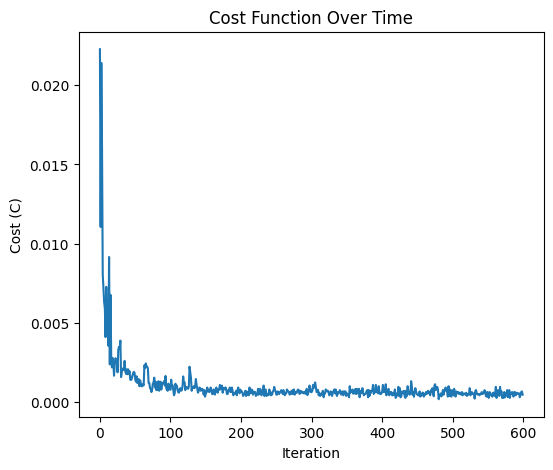

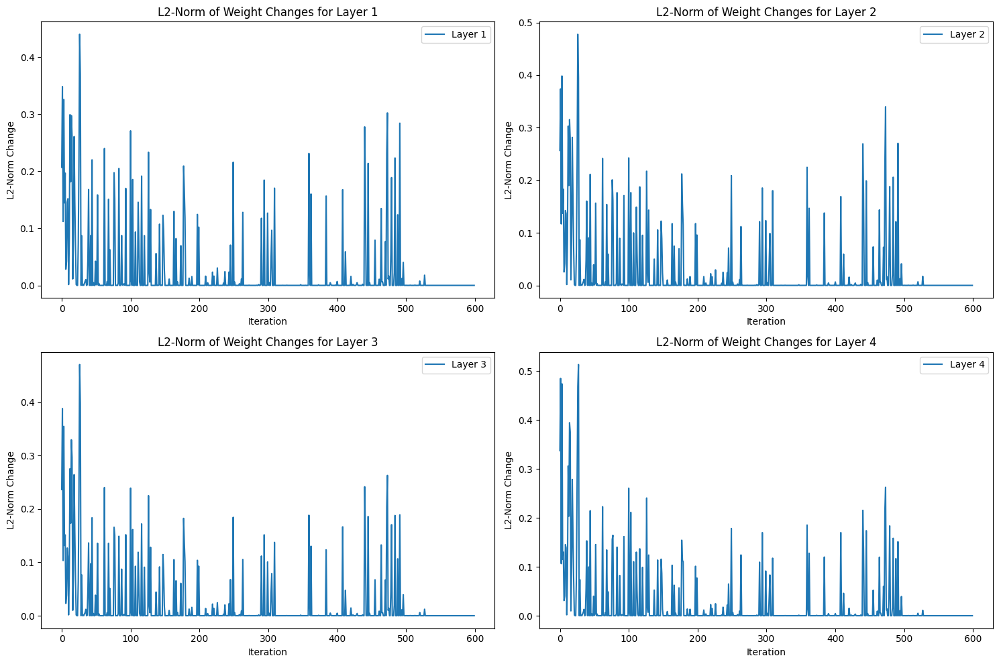

In [131]:
def train_NNet(X, Y, epochs = 20, batch_size = 1000, eta = 0.01,hidden_layers = [500, 250, 50]):
    n = X.shape[1]  # Number of data points

    model = NNet(batch_size = batch_size, hidden_layers= hidden_layers)
    cost = []  
    l2_norm_changes = [[] for _ in range(len(model.W))] 
    # copy of initial weights
    prev_weights = [np.copy(w) for w in model.W]  
    
    for epoch in range(epochs):
        perm = np.random.permutation(n)  # Generate a permutation index for the columns
        X_perm = X[:, perm]              # Permute the columns of X
        Y_perm = Y[perm]                 # Permute the corresponding labels in Y

        for i in range(0, n, batch_size):
            if  n < i + batch_size:
                break

            X_batch = X_perm[:, i:i + batch_size]
            Y_batch = Y_perm[i:i + batch_size]

            model = feedforward(model, X_batch)
            model = backpropagation(model, X_batch, Y_batch, eta)
            
            # Final output layer predictions
            Y_pred = model.Y[-1]  
            #calculate suquare loss
            C = np.sum((Y_pred - Y_batch) ** 2) / (2 * n)
            cost.append(C)

            for k in range(len(model.W)):
                l2_norm_changes[k].append(np.linalg.norm(model.W[k] - prev_weights[k]))
                
            prev_weights = [np.copy(w) for w in model.W]

    print("Cost: ", cost[-1])
    
    # Plotting the cost function
    plt.figure(figsize=(6, 5))
    plt.plot(cost)
    plt.title('Cost Function Over Time')
    plt.xlabel('Iteration')
    plt.ylabel('Cost (C)')
    plt.show()

    # Plotting the L2-norm changes for each layer
    plt.figure(figsize=(15, 10))
    for i in range(len(model.W)):
        plt.subplot(2, 2, i + 1)
        plt.plot(l2_norm_changes[i], label=f'Layer {i + 1}')
        plt.title(f'L2-Norm of Weight Changes for Layer {i + 1}')
        plt.xlabel('Iteration')
        plt.ylabel('L2-Norm Change')
        plt.legend()
    plt.tight_layout()
    plt.show()

    return(model)

trained_MLP_model = train_NNet(train_X_1_5, train_class_1_5, epochs = 50, batch_size = 1000, eta = 0.001)

## Section 3: Evaluation using test data

The following function will evaluate then return an accuracy score and the predicted labels for your model. Do not change anything here.

In [132]:
def test_model(test_data, test_labels, model, d1, d2):
    
    L = len(model.hidden_layers) + 1
    
    Y = test_data
    for i in range(L):
        Z = np.matmul(model.W[i], np.append(Y, np.array([np.ones(Y.shape[1])]), axis = 0))
        if i < L - 1:
            Y = ReLu(Z)
        else:
            Y = sigmoid(Z)
    
    Y = Y[0]
    Y = np.where(Y >= 0.5, 1, 0)
    Y_predicted = np.where(Y == 0, d1, d2)

    acc = accuracy_score(test_labels, Y_predicted)

    return(acc, Y_predicted)

test_X_1_5_extracted , test_y_1_5 = extract_digits(test_X, test_y, 1,5)
acc, Y_predicted = test_model(test_X_1_5, test_y_1_5, trained_MLP_model, 1, 5)    
print(f"Accuracy of the model is {acc * 100:.2f}%")

Accuracy of the model is 99.46%


**Q10.** Use this test_model function to evaluate your model with the $1$ and $5$ digits. An accuracy $>= 99%$ is achievable. Test with different batch sizes, $\eta$ values and hidden layers. Find which of those hyperparameters gives the best test accuracy. <font color='blue'>Document the hyperparameter values that gives the best testing accuracy and that best accuracy. Plot a confusion matrix and comment on your observations with reasons. Also, look into the nature of the plots that result fom the training procedure, see how they vary with the hyperparameters and provide your ideas on the observations. Then do the same with a few other pairs of digits $d_1, d_2$. Especially, try $d_1 = 1, d_2 = 7$. Comment on your observations and explain possible reasons</font>.

**Answer of For d1 = 1 and d2 = 5,**

Best testing accuracy = 99.70 %

Hyperparameter values that give the best accuracy are as follows:
    
*batch size =  500*

*Eta value  = 0.001*

*hidden layers = [400, 200, 100]*

Confusion matrix is plotted at the end of the "CODE 1" below. 

Based on the confusion matrix:

*True Positive Rate (TPR) (Correctly identified digit 5s)           =  891/2027     =  43.96 %*  

*True Negative Rate (TNR) (Correctly identified digit 1s)           =  1130/2027    =  55.76 %*

*False Positive Rate (FPR) (Digit 1 incorrectly classified as 5)    =  5/2027       =  0.25 %*

*False Negative Rate (FNR) (Digit 5 incorrectly classified as 1)    =  1/2027       =  0.05 %*

The model achieved an overrall accuracy of 99.70% for the give hyperparameter values. The confusion matrix reveals that the model effectively distinguishes between the two digits (1 and 5). It correctly classified 891 instances of digit 5 and 1130 instances of digit 1. The False Positive Rate (misclassifying 1 as 5) and False Negative Rate (misclassifying 5 as 1) are both very low, indicating a strong model performance with only a few misclassifications.

Observations on the variation of cost C and change in weight matrices

When learning rate is 0.01, regarless of the other parameters  the cost function oscillates within a certain range rather than smoothly decreasing over time. Therefore, 0.01 seems to be a large learning rate for this classifcation. 

With a batch size of 500, both learning rates (0.001 and 0.0001) and hidden layer configurations ([400, 200, 100] and [500, 250, 50]) resulted in convergence of the cost function with small fluctuations. But for hidden layers  [450, 250, 100] cost function oscillates within a larger range.

When the batch size was increased to either 800 or 1000, the cost function generally converged with small fluctuations across all combinations of learning rates and hidden layer configurations. However, for a learning rate of 0.001 and hidden layers [400, 200, 100], the convergence was notably worse, exhibiting high oscillations compared to other configurations.

<br>
<br>

**Answer for d1 = 1 and d2 = 7,**

Best testing accuracy = 99.17 %

Hyperparameter values that give the best accuracy are as follows:
    
*batch size =  500*

*Eta value = 0.001*

*hidden layers = [500, 250, 50]*

Confusion matrix is plotted at the end of the "CODE 2" below. 

Based on the confusion matrix:

*True Positive Rate (TPR) (Correctly identified digit 7s)           =  1012/2163     =  46.78 %*

*True Negative Rate (TNR) (Correctly identified digit 1s)           =  1133/2163     =  52.38 %*

*False Positive Rate (FPR) (Digit 1 incorrectly classified as 7)    =  2/2163        =  0.09 %*

*False Negative Rate (FNR) (Digit 7 incorrectly classified as 1)    =  16/2163       =  0.74 %*


Observations 
Despite the inherent difficulty in distinguishing between the digits 1 and 7, the model performs quite well, achieving a high testing accuracy of 99.17%. However, the model shows some misclassification rates, including a small percentage of false positives and false, which needs to be improved.
<br>
<br>


**Answer for d1 = 6 and d2 = 8,**

Best testing accuracy = 98.65 %

Hyperparameter values that give the best accuracy are as follows:
    
*batch size =  1000*

*Eta value  = 0.001*

*hidden layers = [400, 200, 100]*

Confusion matrix is plotted at the end of the "CODE 3" below. 

Based on the confusion matrix:

*True Positive Rate (TPR) (Correctly identified digit 8s)           =  961/1932     =  49.74 %*   

*True Negative Rate (TNR) (Correctly identified digit 6s)           =  945/2163     =  48.91 %*

*False Positive Rate (FPR) (Digit 6 incorrectly classified as 8)    =  13/2163      =  0.67 %*

*False Negative Rate (FNR) (Digit 8 incorrectly classified as 6)    =  13/2163      =  0.67 %*


Observations on the variation of cost C and change in weight matrices

Compared to the classification tasks between digits 1 and 5, as well as 1 and 7, the classification between digits 6 and 8 shows lower accuracy. This reduced performance is likely due to the visual similarities between the digits 6 and 8, which makes it more challenging for the model to distinguish between them. 


Training with batch_size=500, eta=0.01, hidden_layers=[400, 200, 100]


Cost:  0.011633643015703363


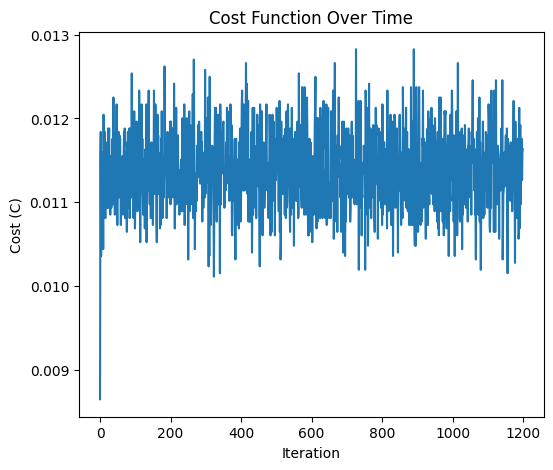

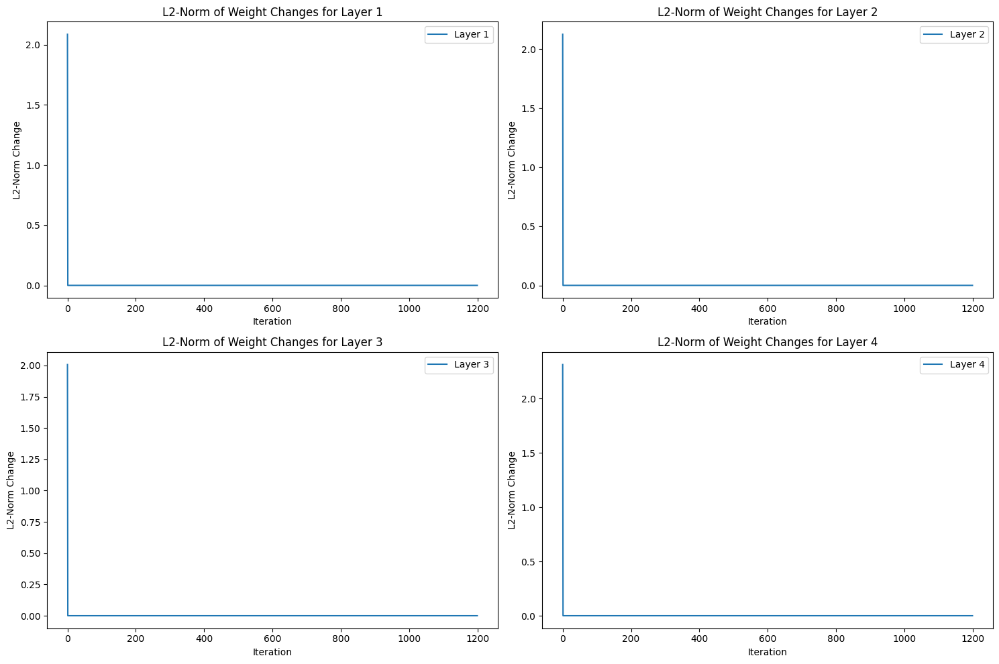

Accuracy of the model is 44.01%
Training with batch_size=500, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.011674751294910794


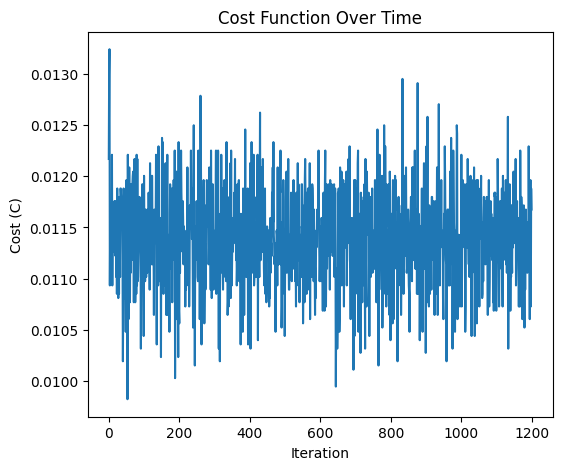

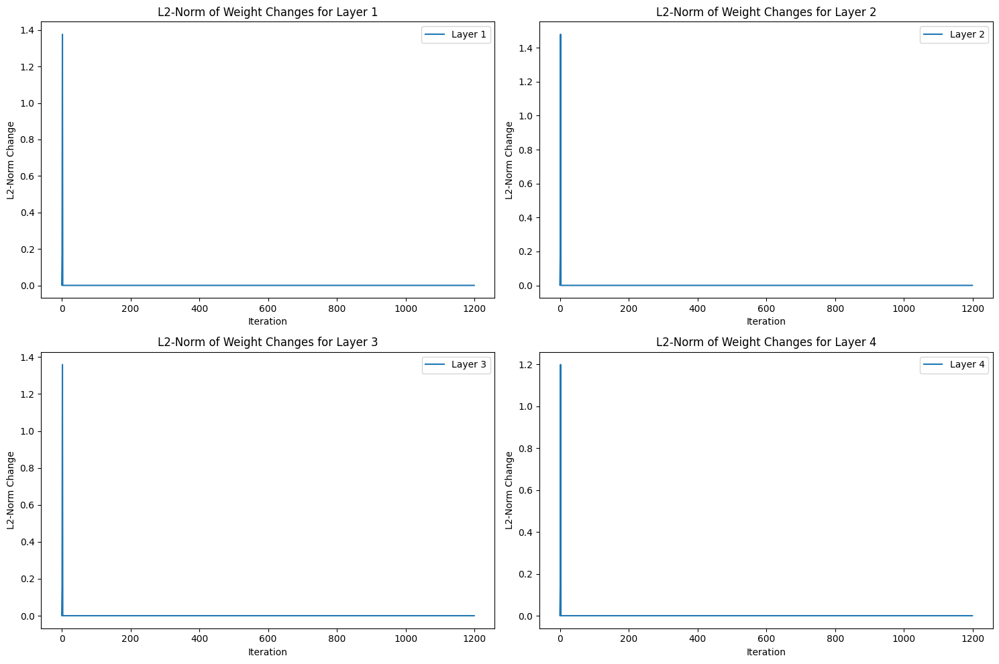

Accuracy of the model is 44.01%
Training with batch_size=500, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.011140343665214174


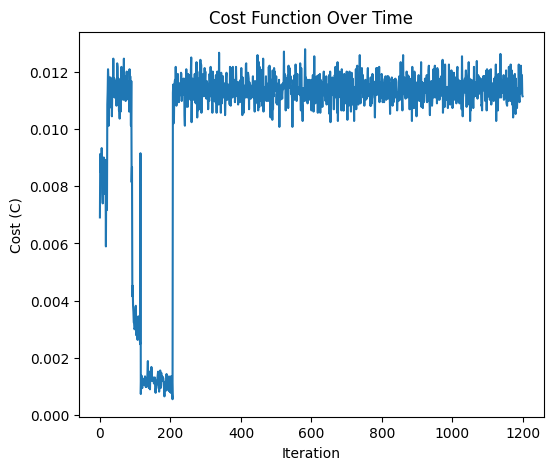

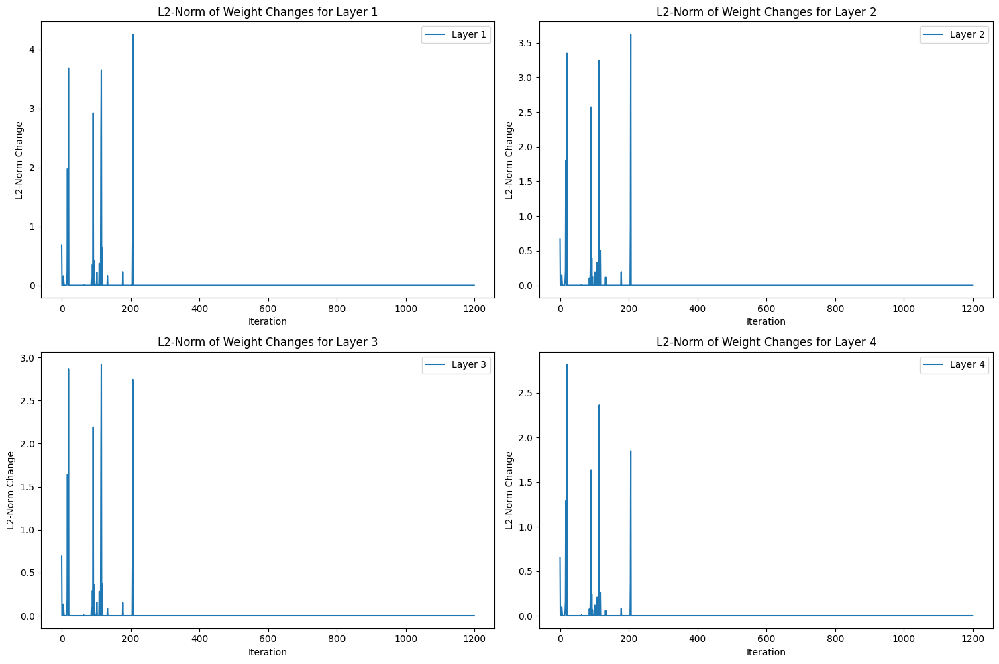

Accuracy of the model is 44.01%
Training with batch_size=500, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.0002466496752445943


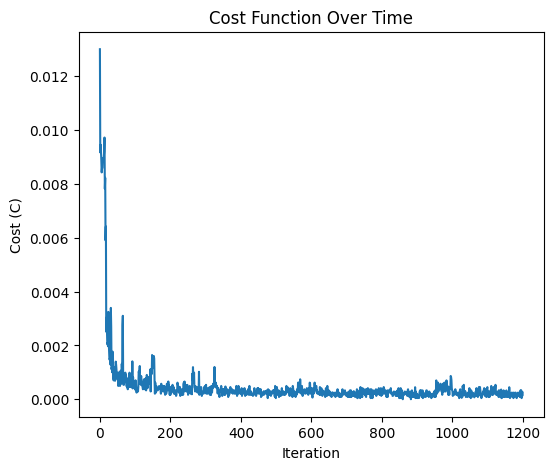

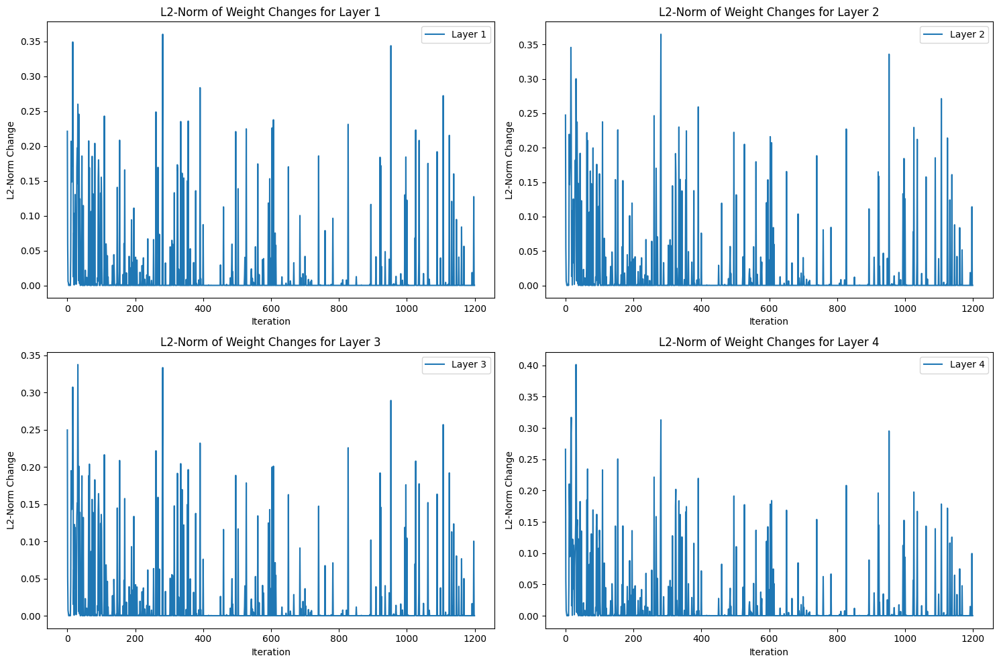

Accuracy of the model is 99.70%
Training with batch_size=500, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.00830387239990134


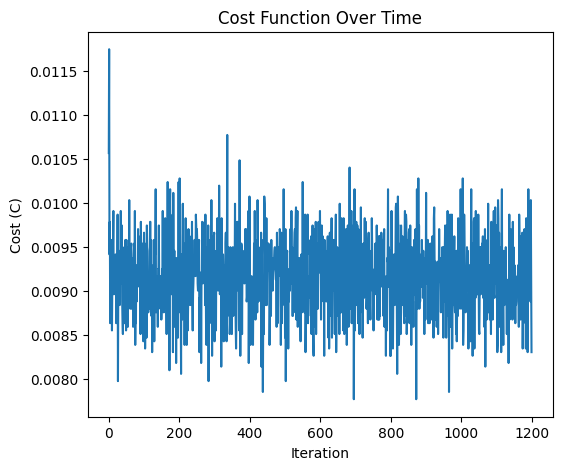

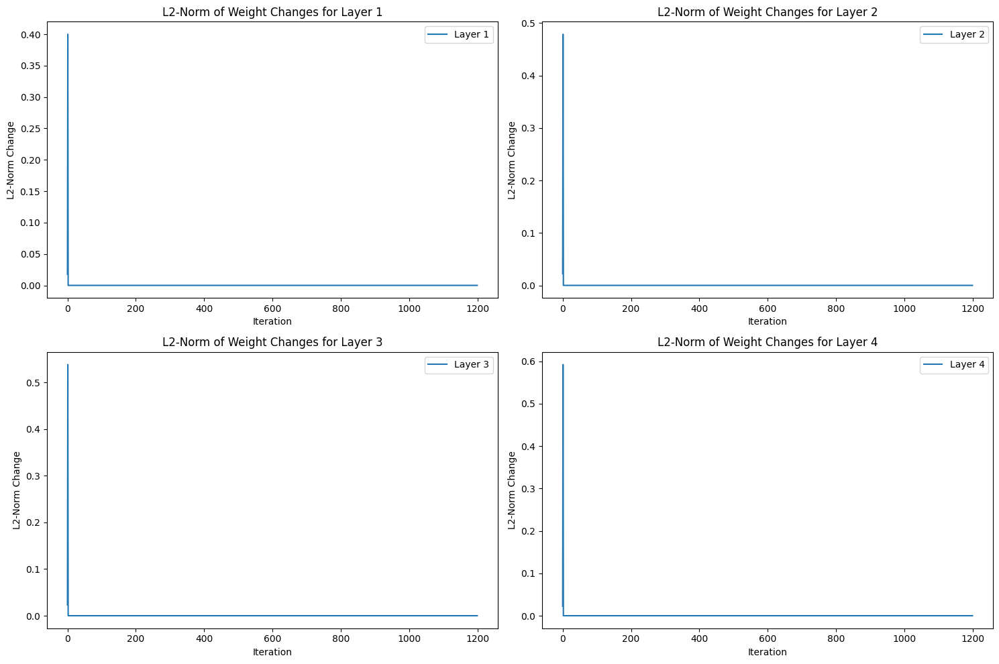

Accuracy of the model is 55.99%
Training with batch_size=500, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.0002877579544520266


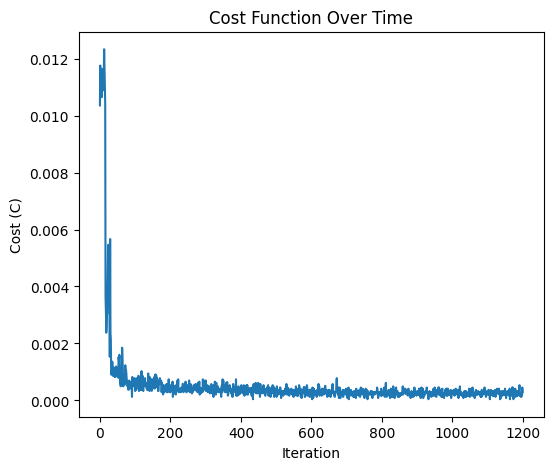

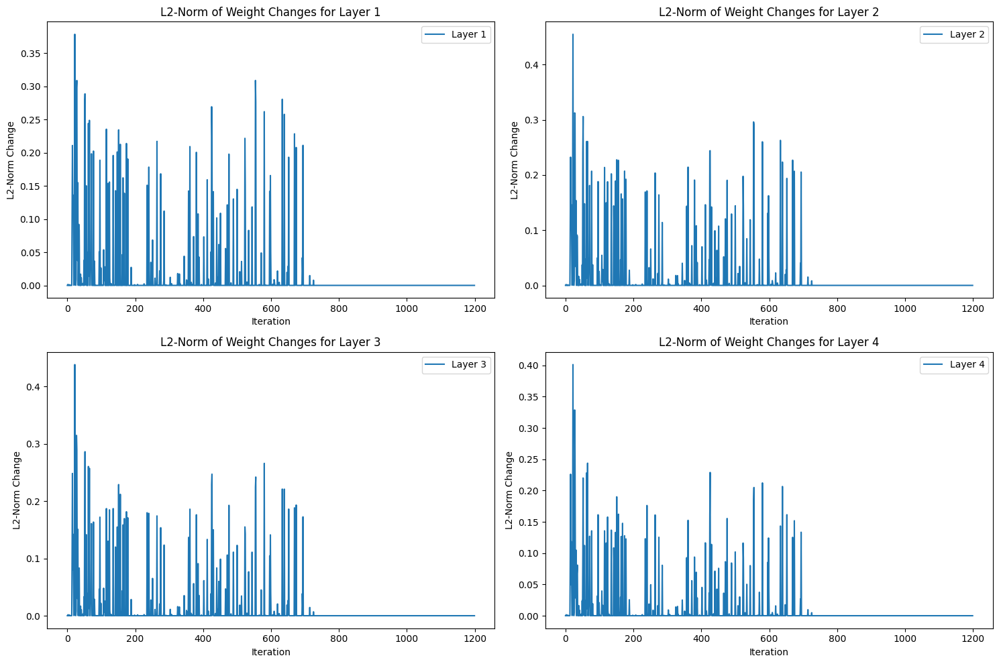

Accuracy of the model is 99.16%
Training with batch_size=500, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.00966044561374661


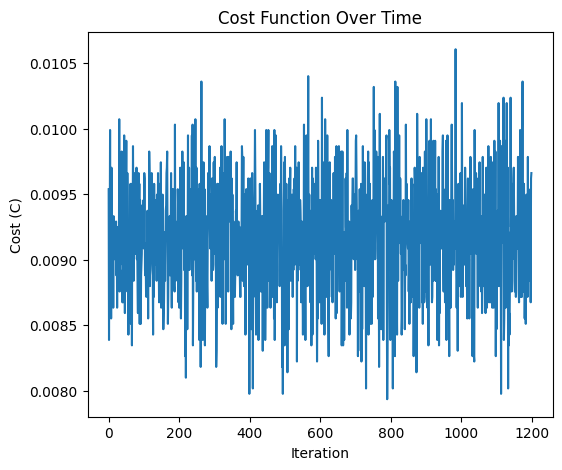

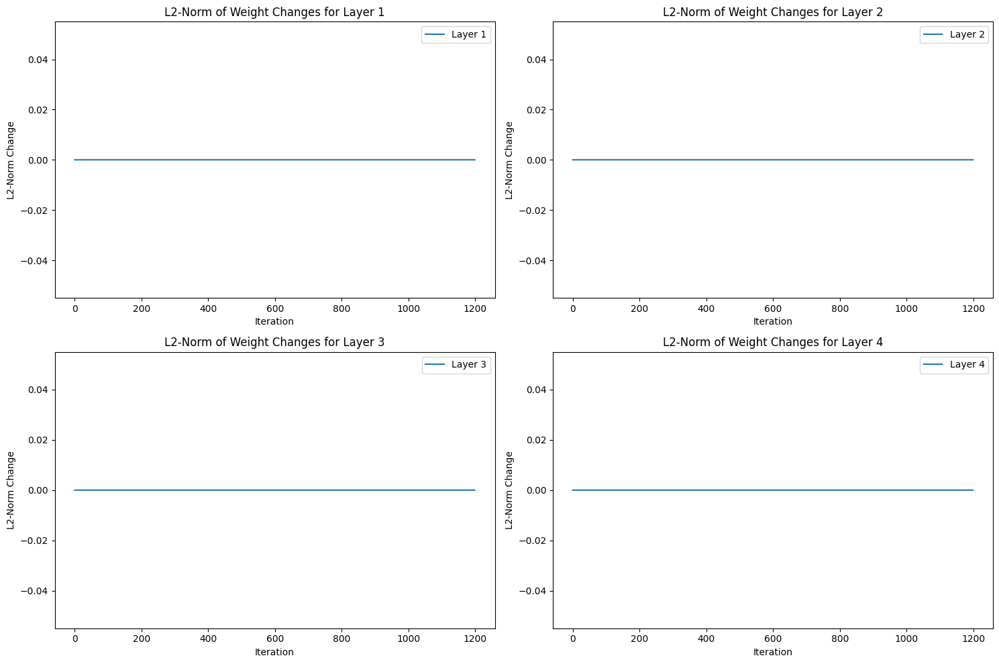

Accuracy of the model is 55.99%
Training with batch_size=500, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0005307297713289102


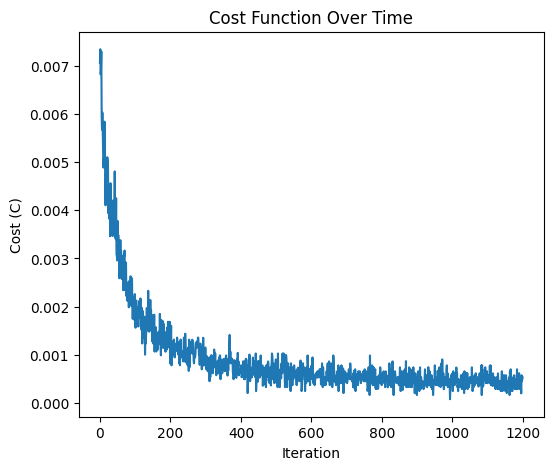

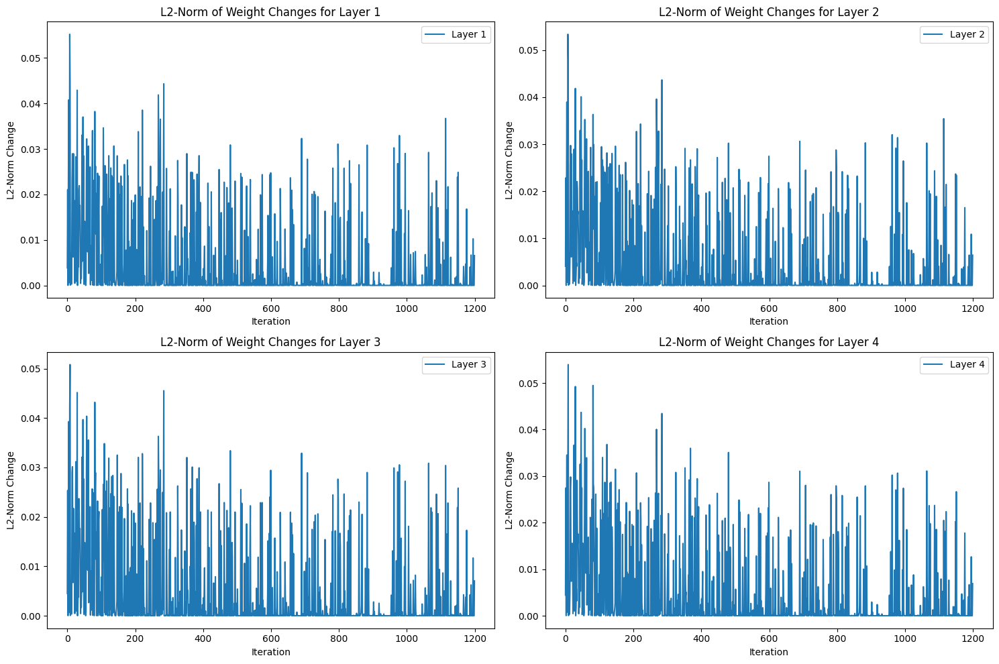

Accuracy of the model is 98.22%
Training with batch_size=500, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.000328866233659459


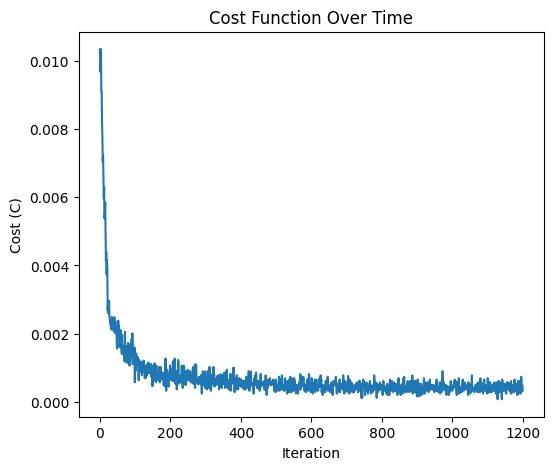

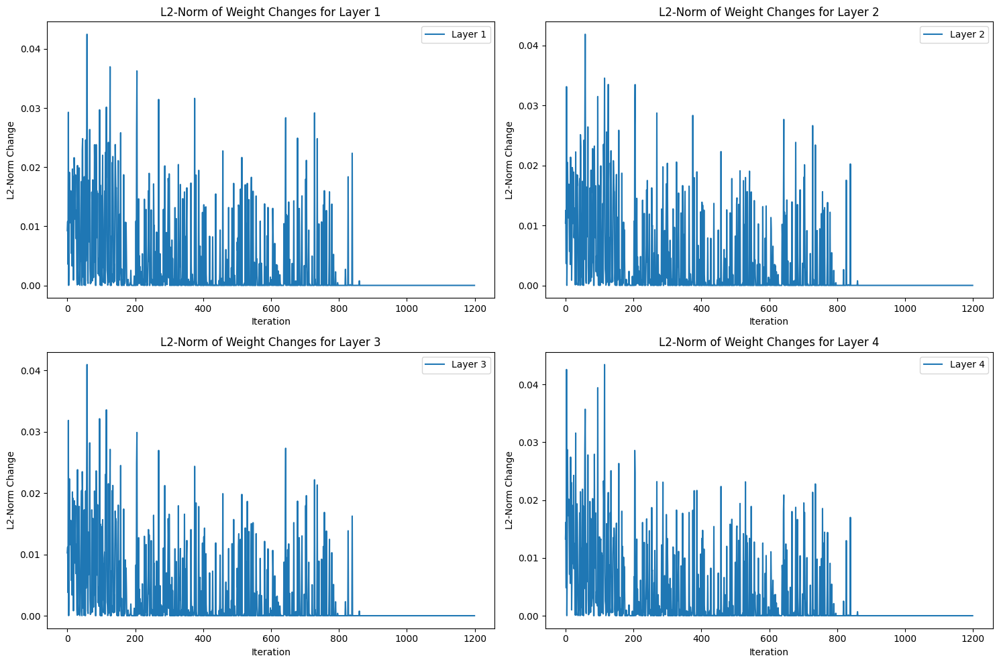

Accuracy of the model is 98.13%
Training with batch_size=800, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.01812875113047768


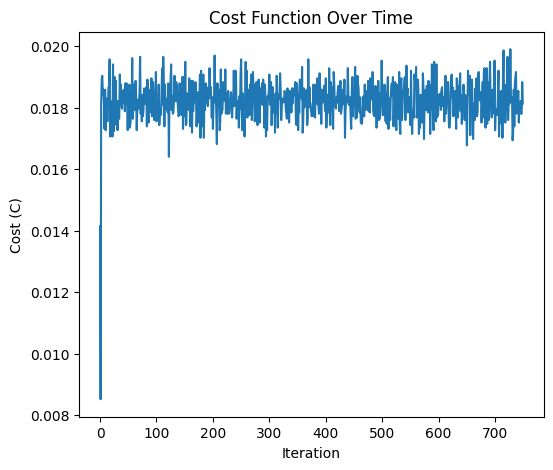

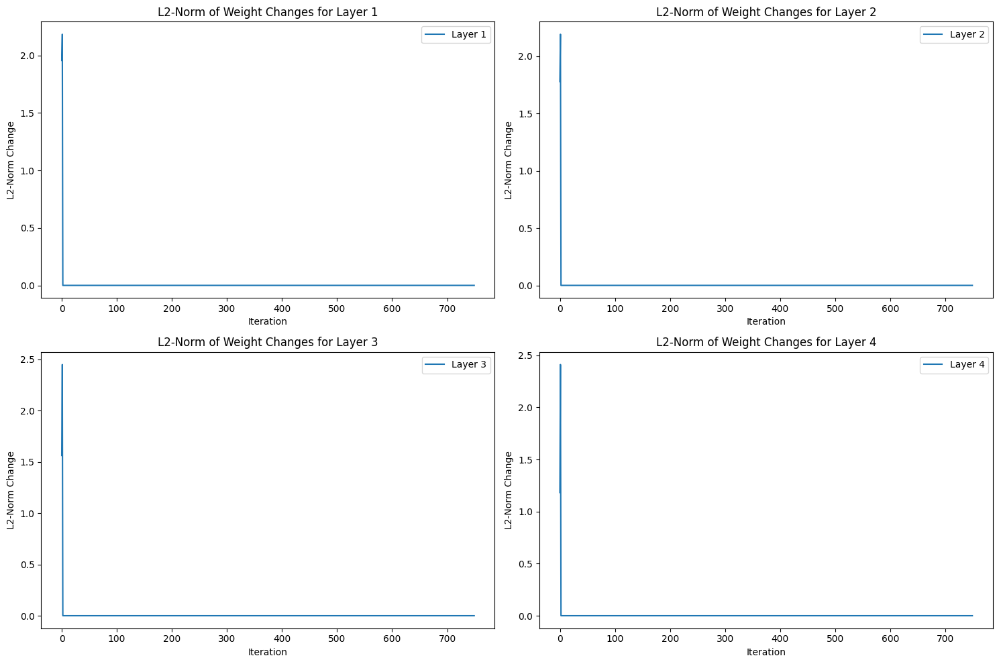

Accuracy of the model is 44.01%
Training with batch_size=800, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.01800542629285538


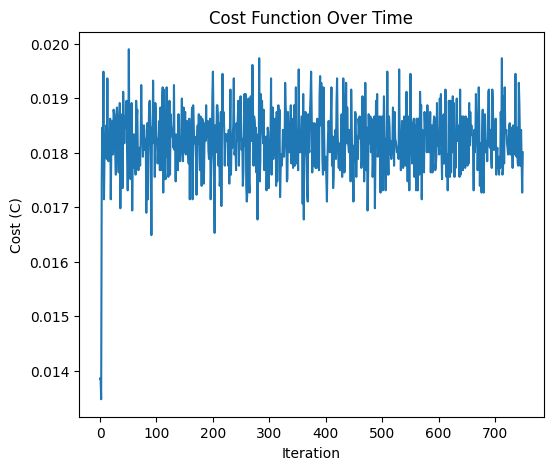

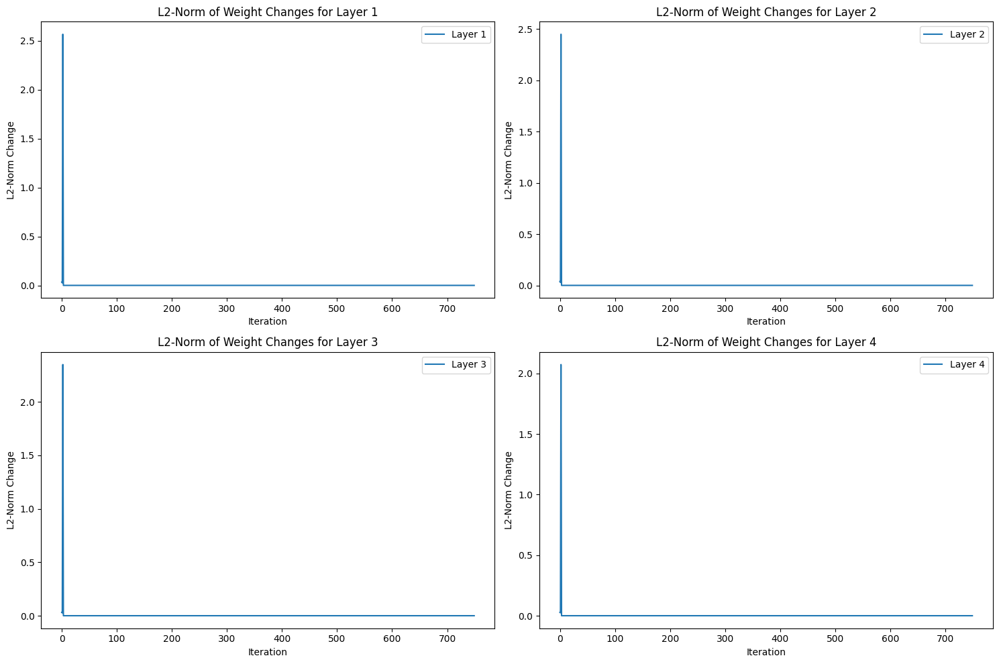

Accuracy of the model is 44.01%
Training with batch_size=800, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.014470114281016197


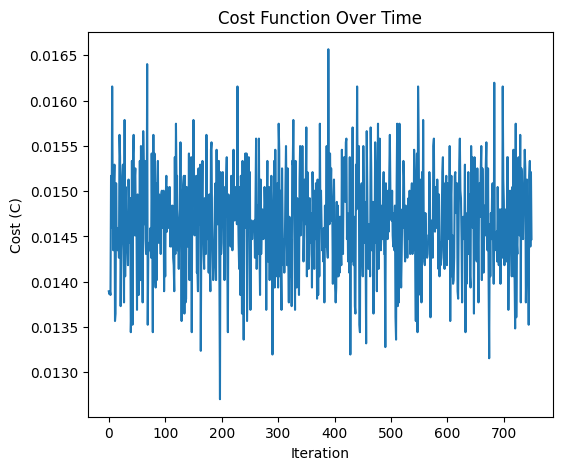

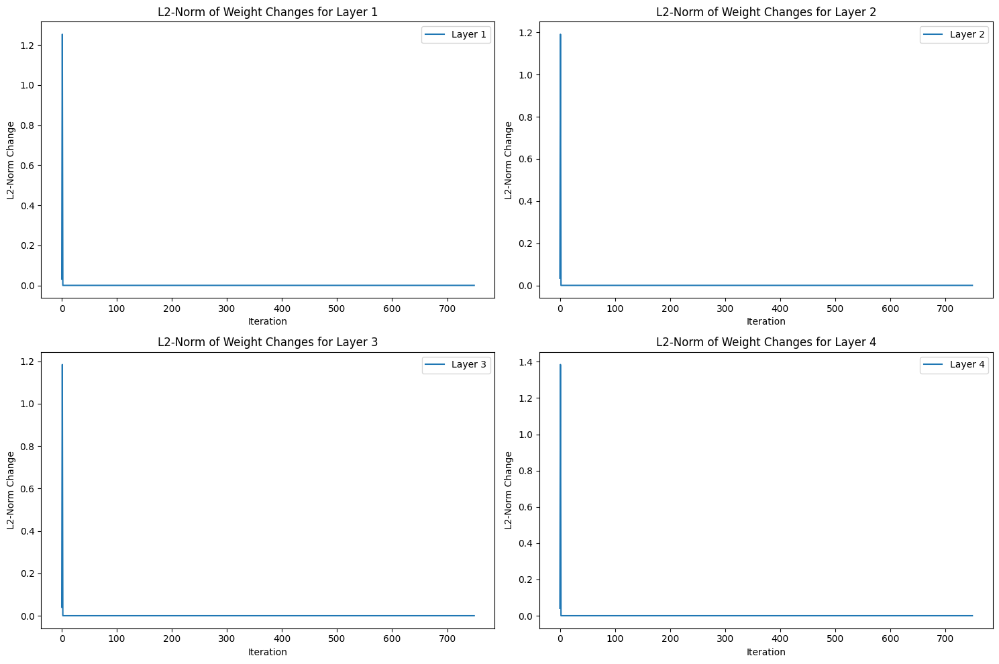

Accuracy of the model is 55.99%
Training with batch_size=800, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.017923209734440518


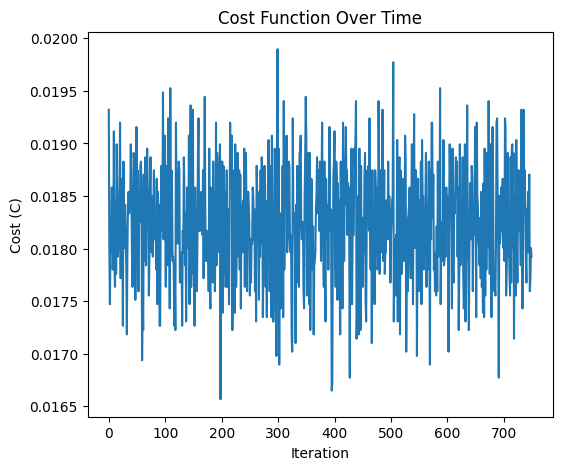

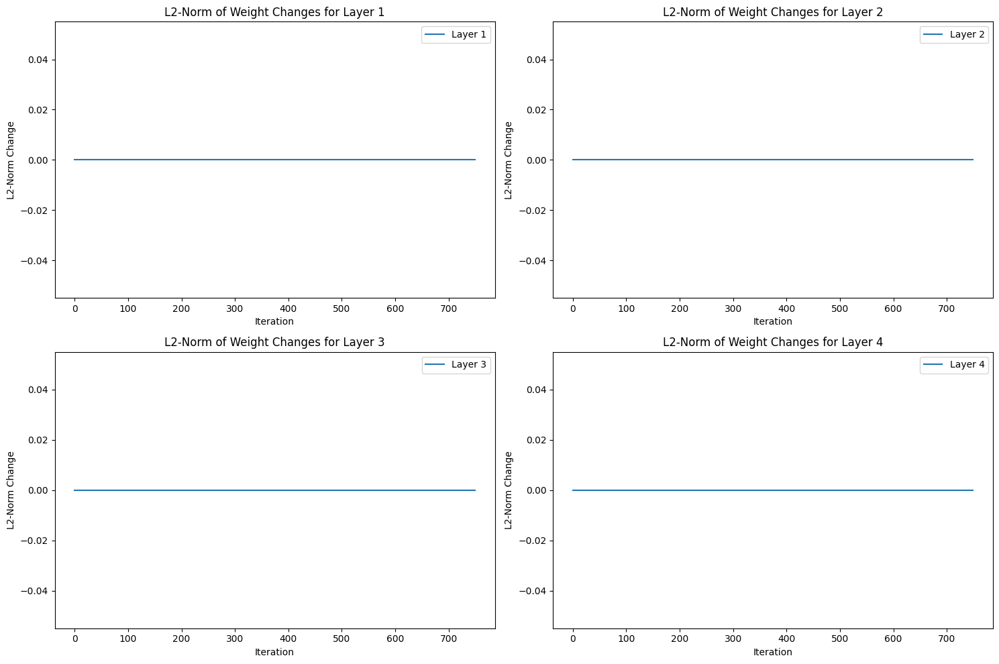

Accuracy of the model is 44.01%
Training with batch_size=800, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.0002466496752445943


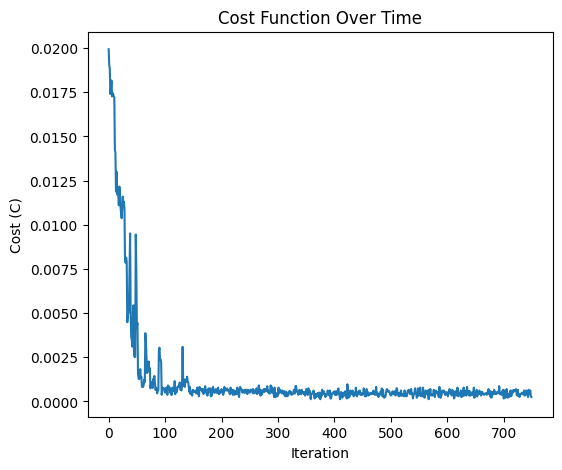

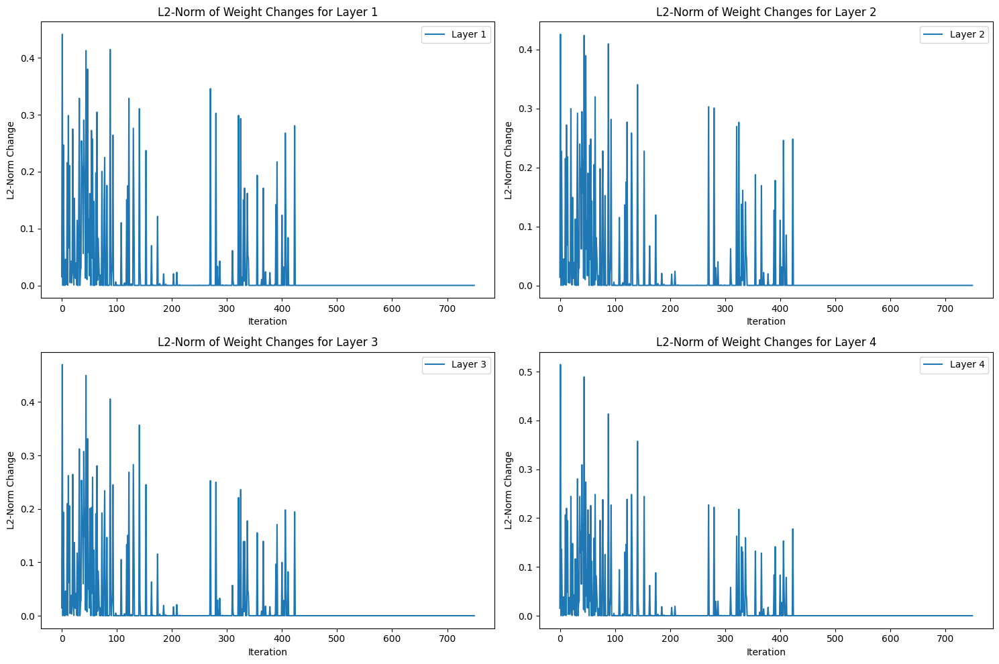

Accuracy of the model is 99.26%
Training with batch_size=800, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.0002877579544520266


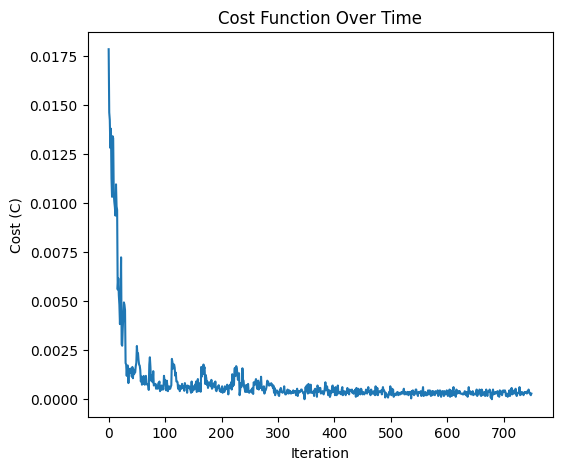

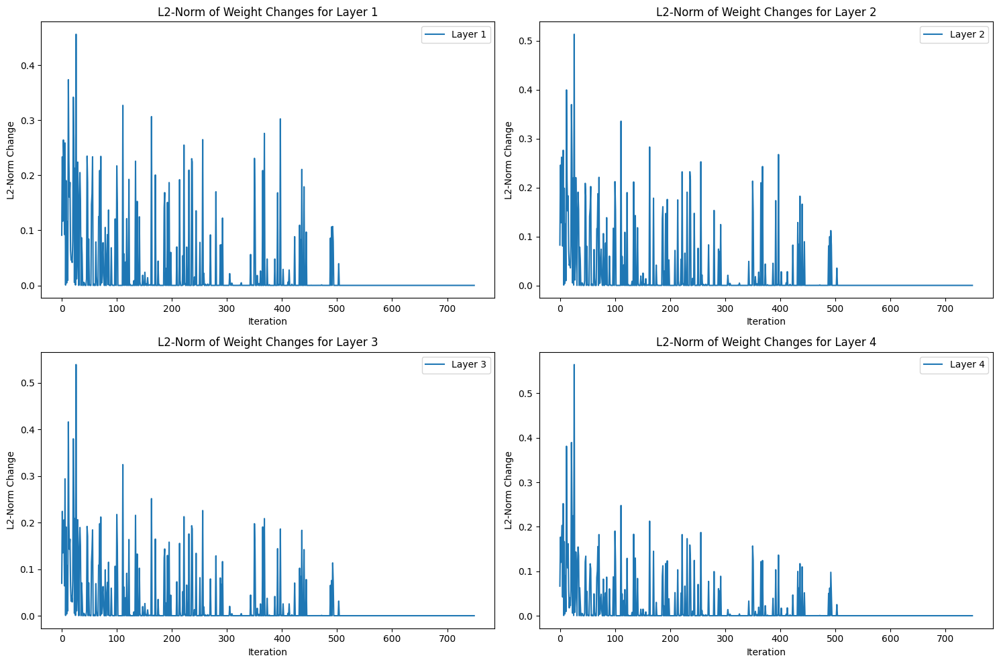

Accuracy of the model is 99.31%
Training with batch_size=800, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.000781064334358328


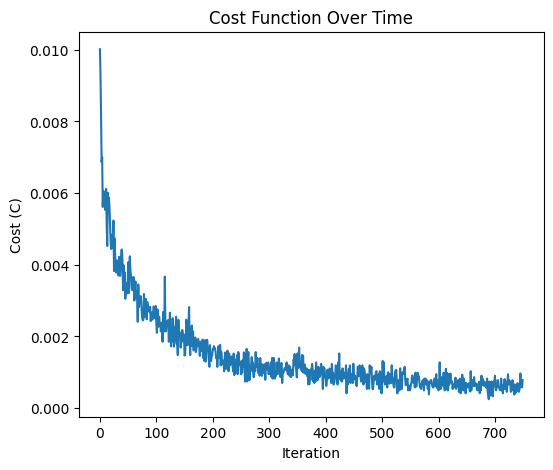

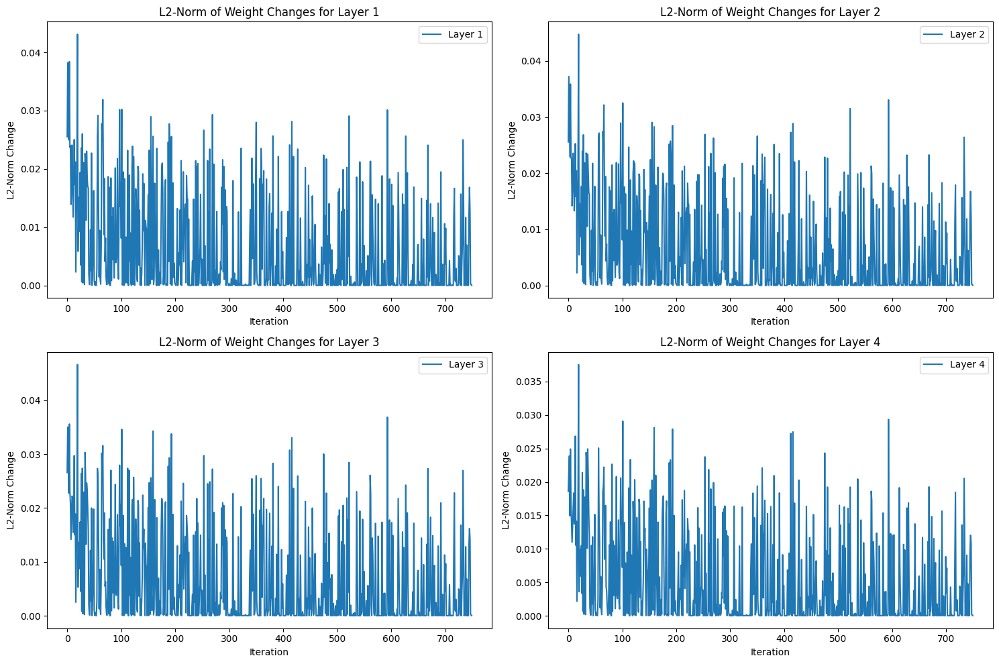

Accuracy of the model is 98.47%
Training with batch_size=800, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0005358239019587784


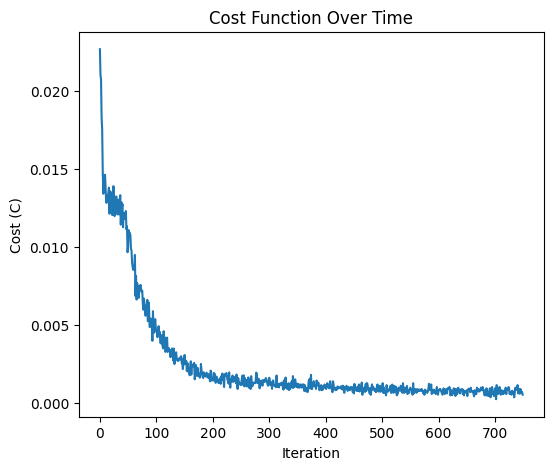

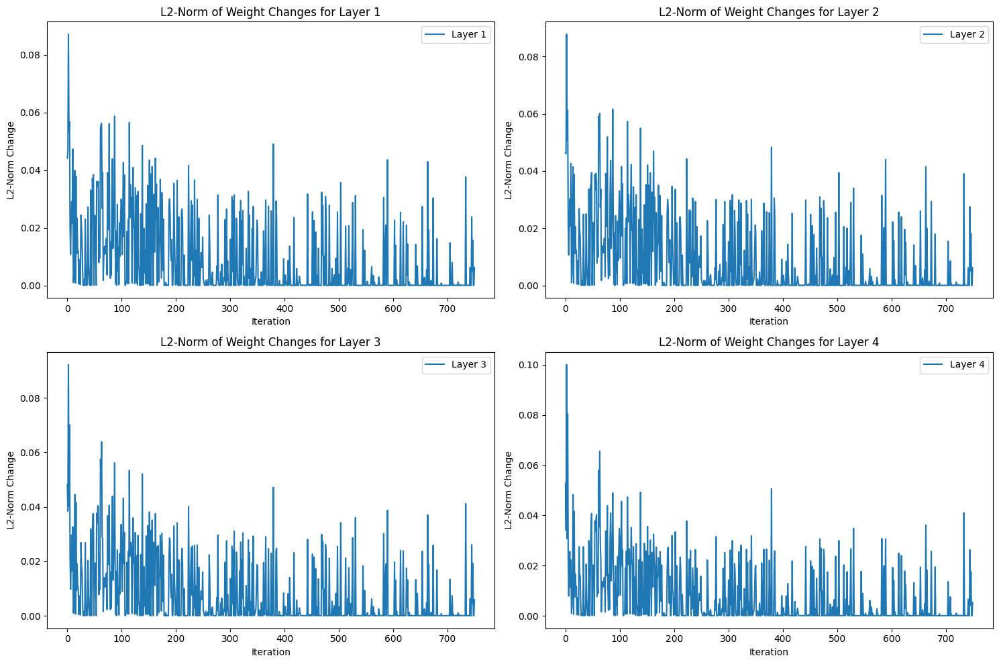

Accuracy of the model is 98.27%
Training with batch_size=800, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.0007812178762903256


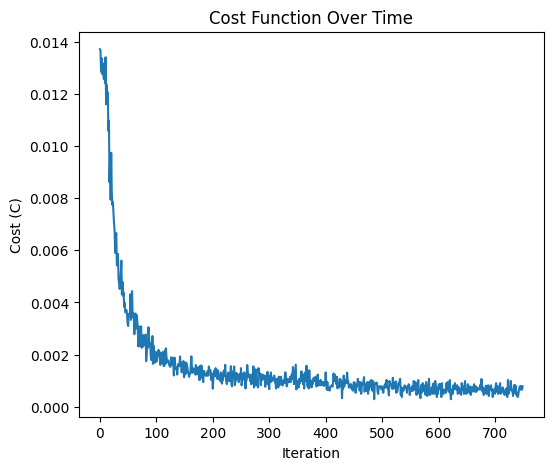

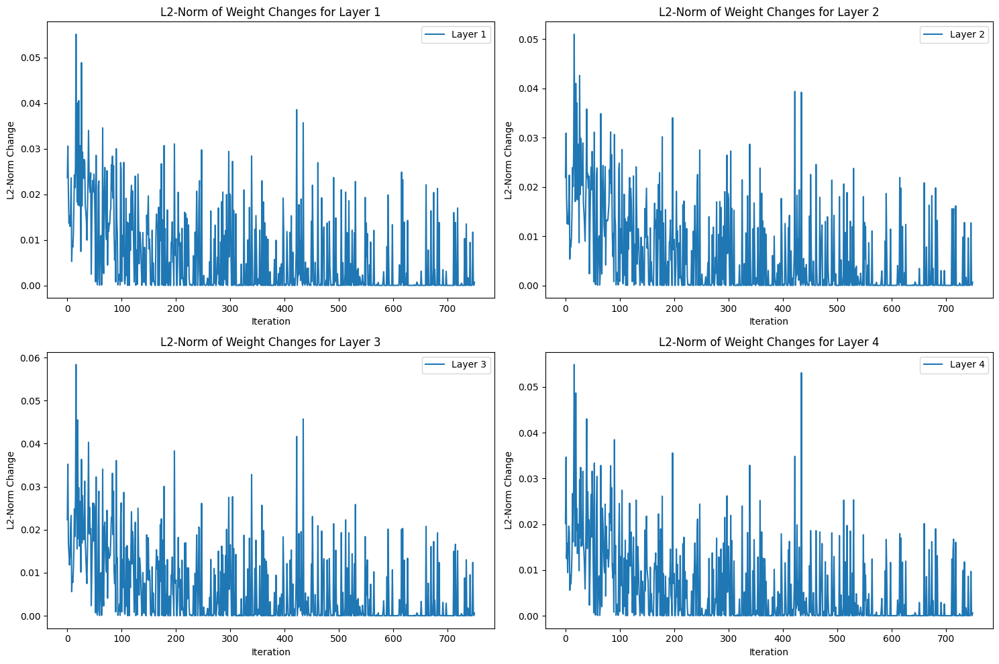

Accuracy of the model is 98.27%
Training with batch_size=1000, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.01932089122749322


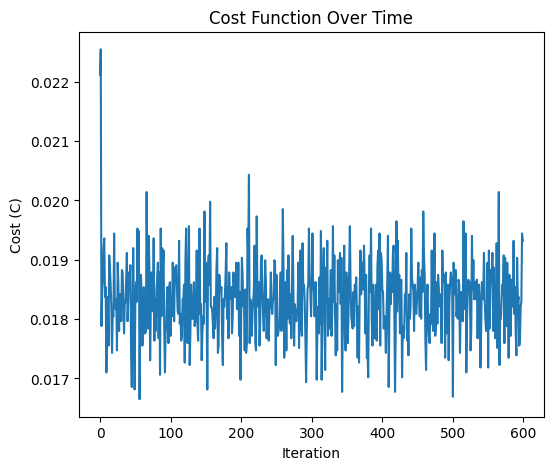

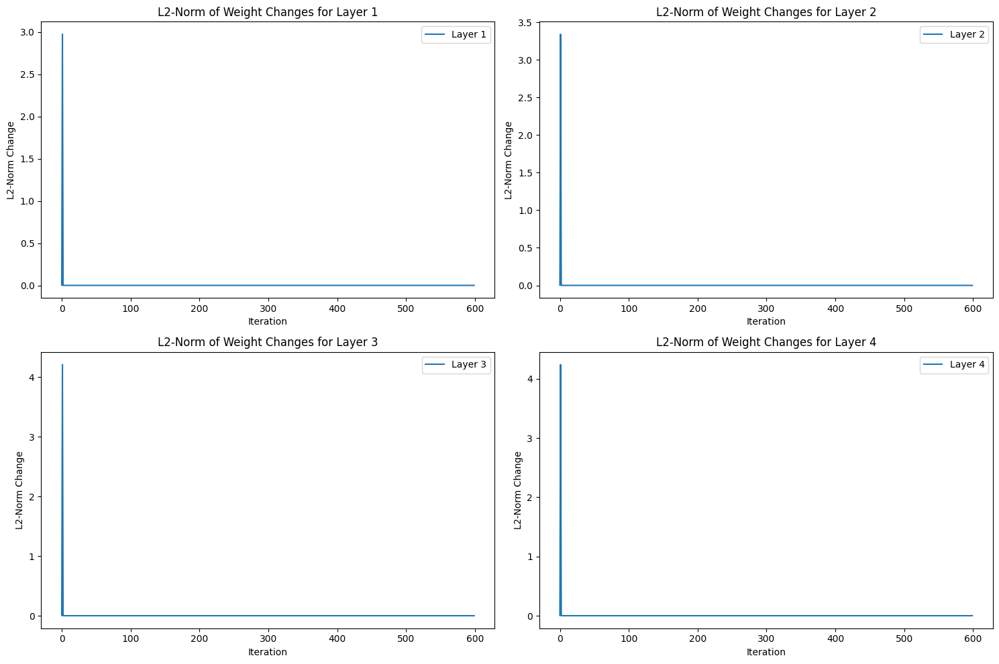

Accuracy of the model is 55.99%
Training with batch_size=1000, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.018375400805722274


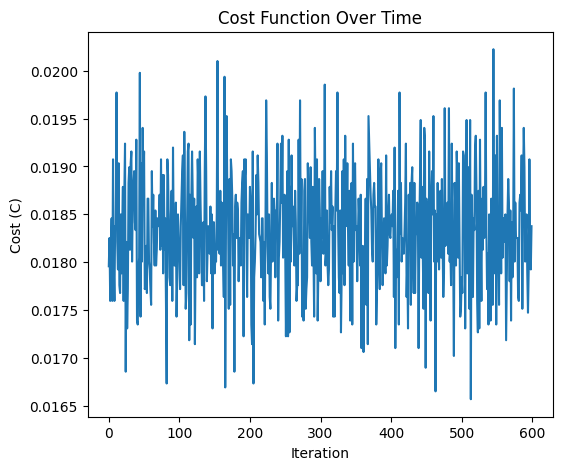

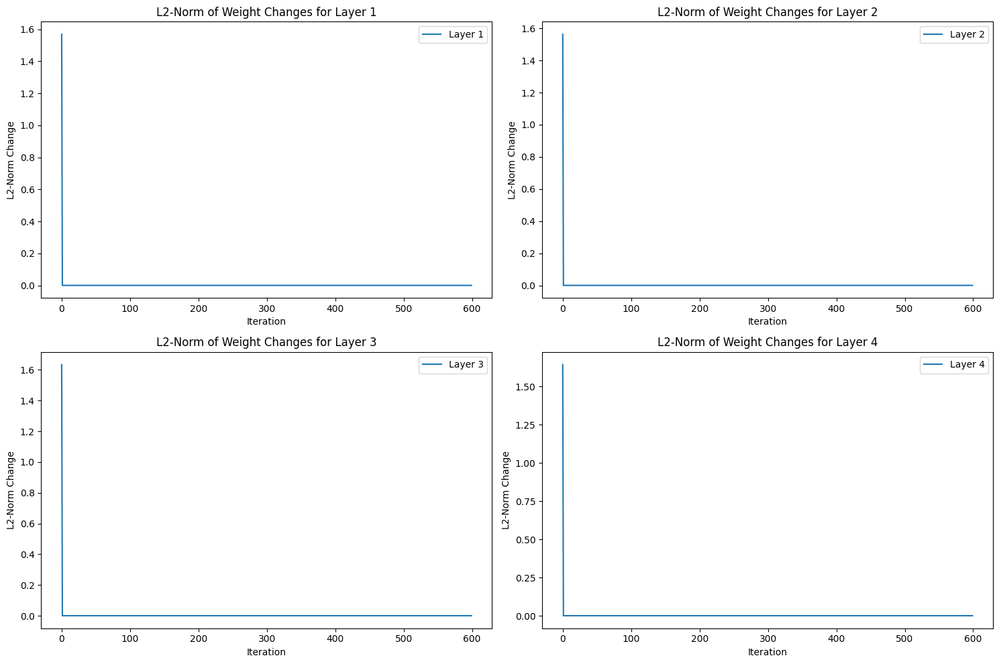

Accuracy of the model is 55.99%
Training with batch_size=1000, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.022362903888843214


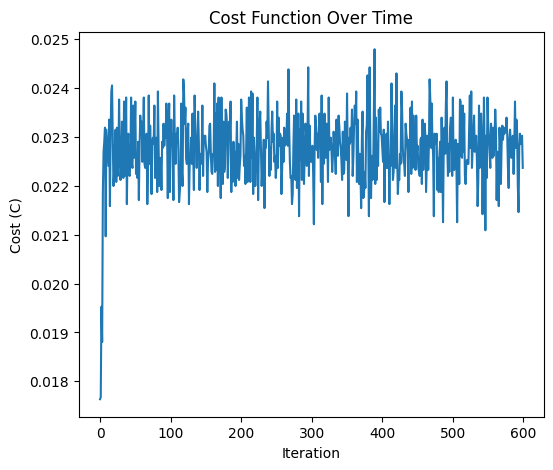

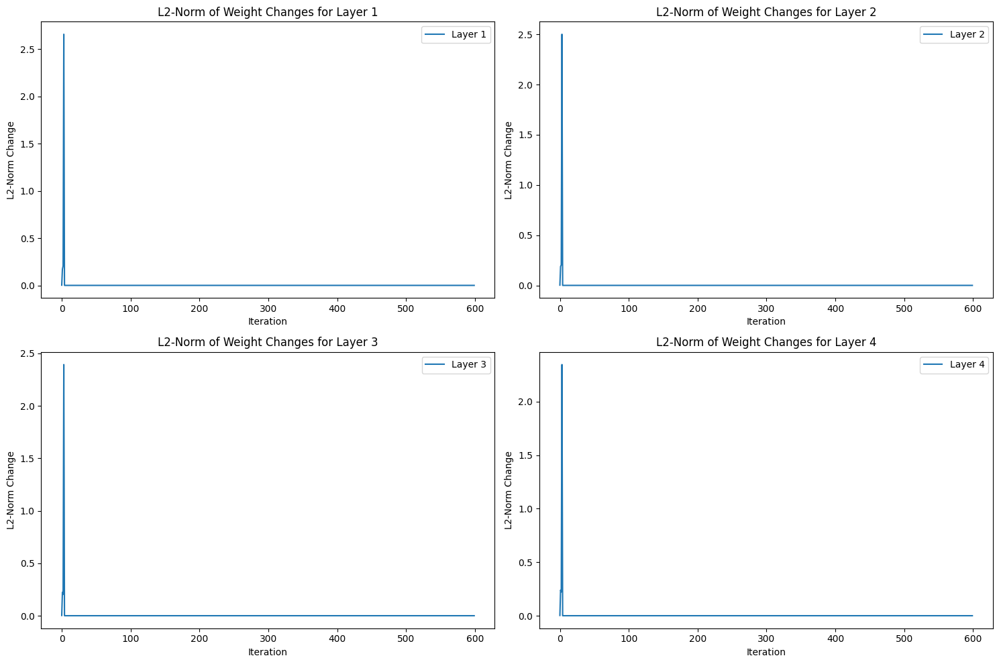

Accuracy of the model is 44.01%
Training with batch_size=1000, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.023061744635369565


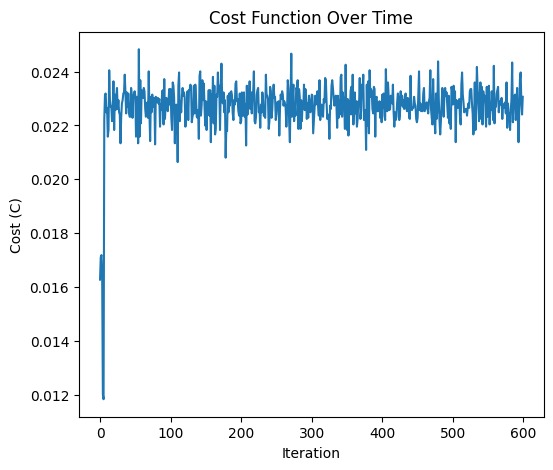

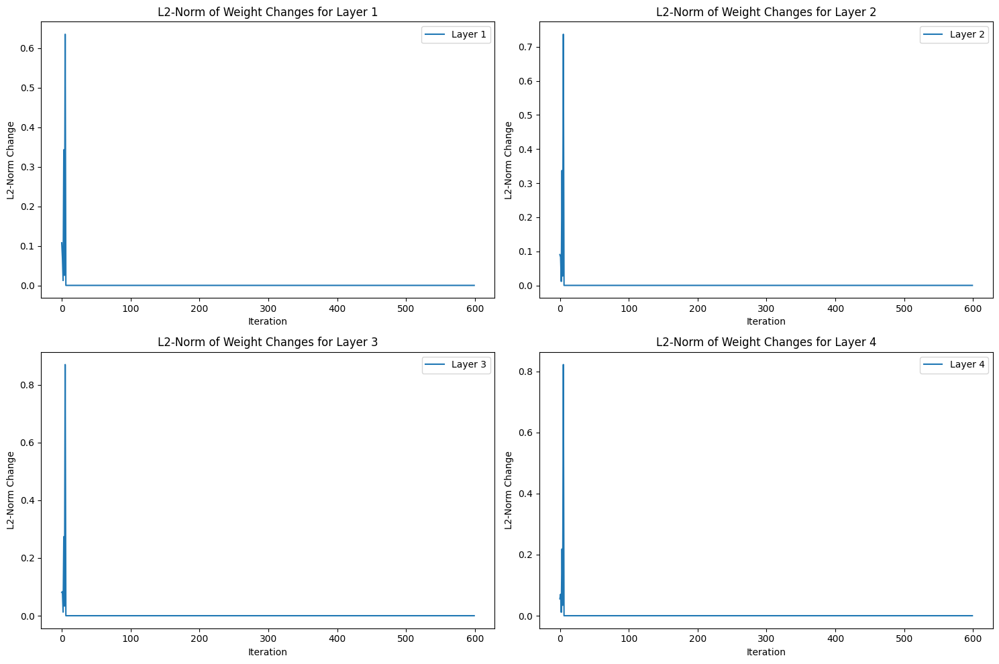

Accuracy of the model is 44.01%
Training with batch_size=1000, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.00045219107128175617


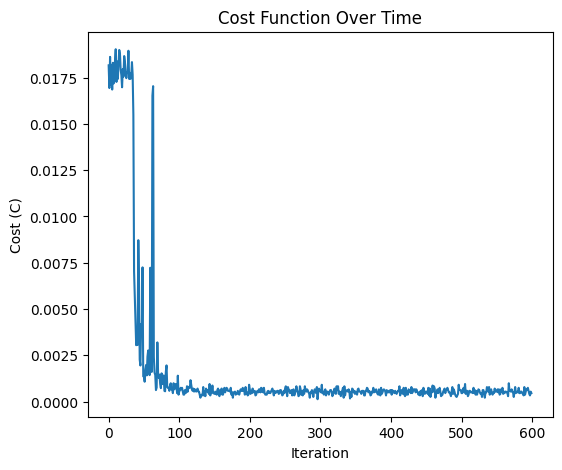

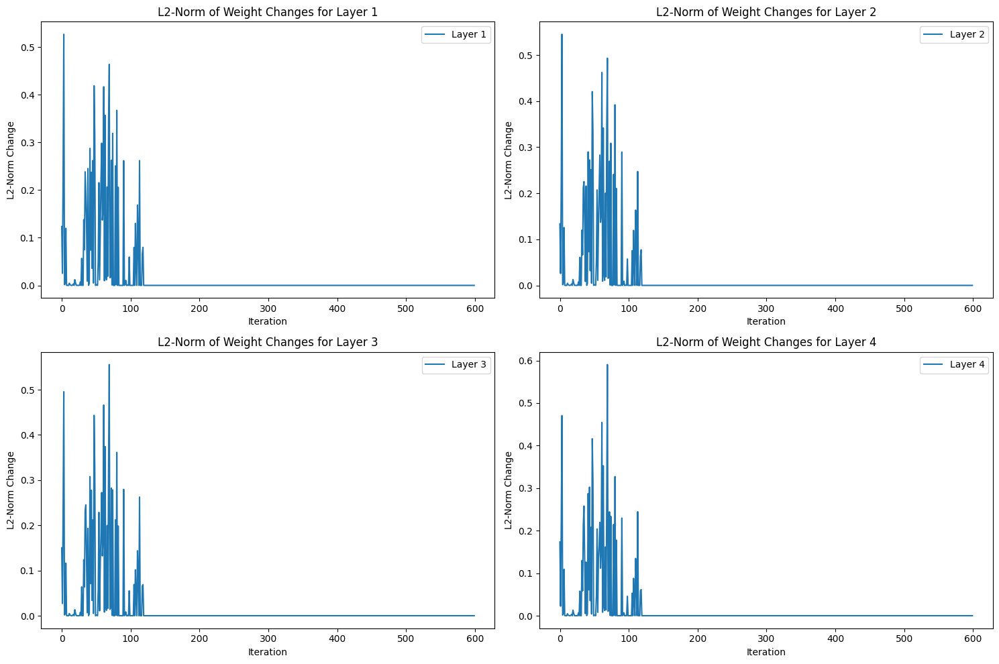

Accuracy of the model is 99.01%
Training with batch_size=1000, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.0002877579544520266


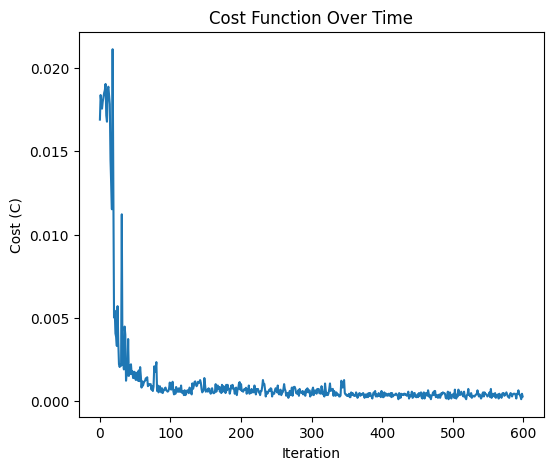

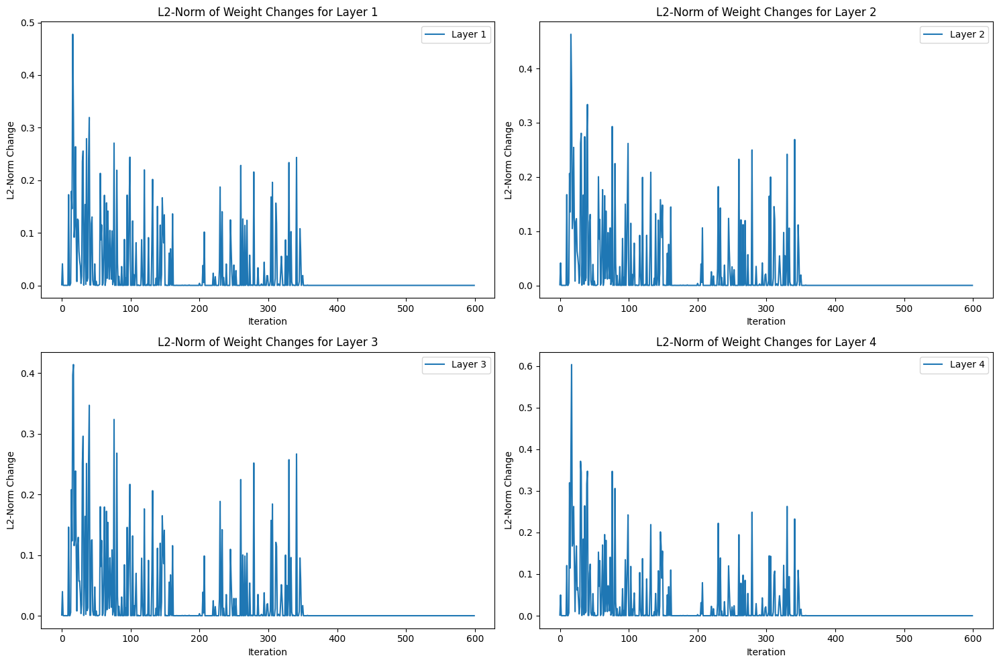

Accuracy of the model is 99.21%
Training with batch_size=1000, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.0005341434322189351


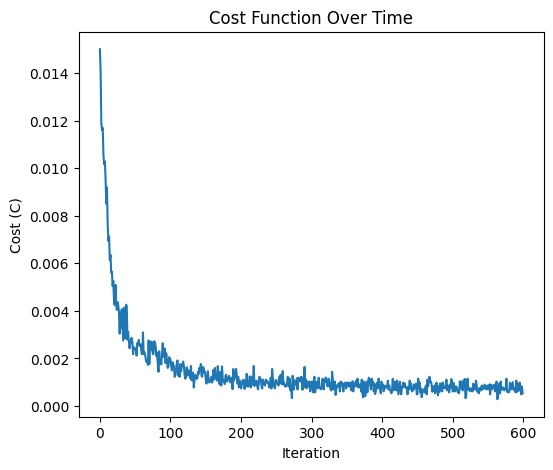

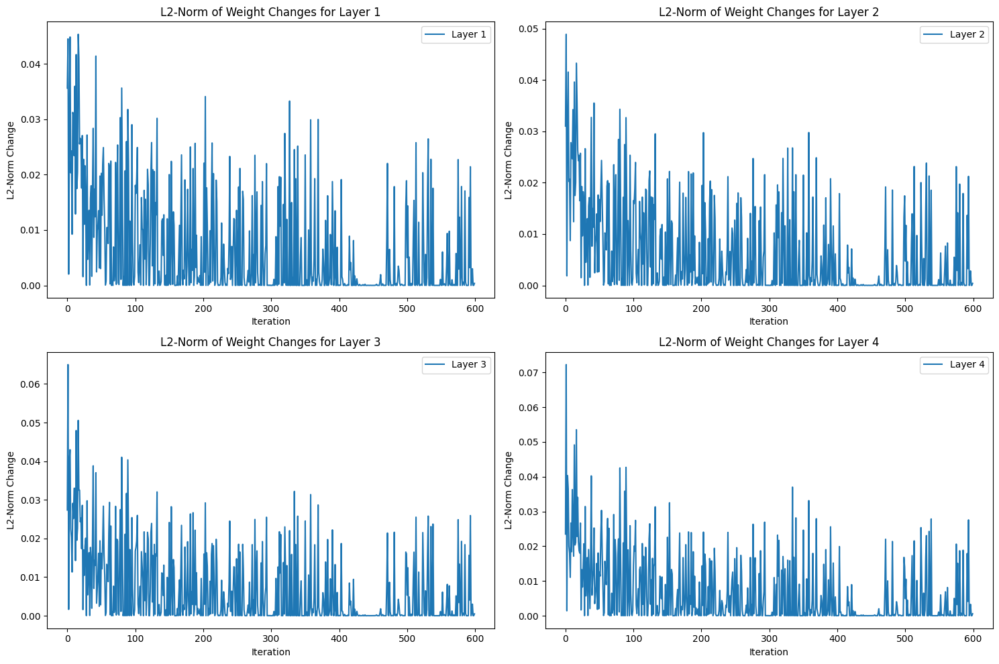

Accuracy of the model is 98.77%
Training with batch_size=1000, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0009912791087475824


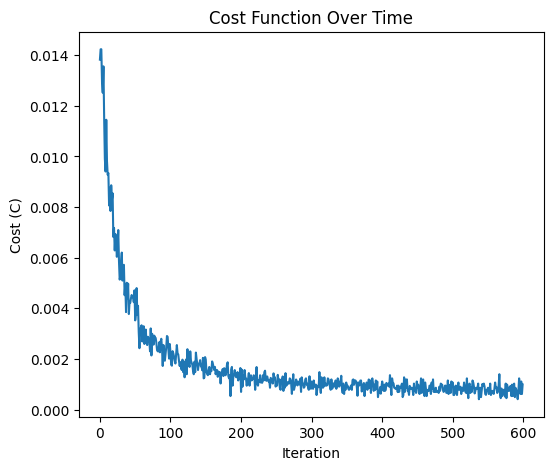

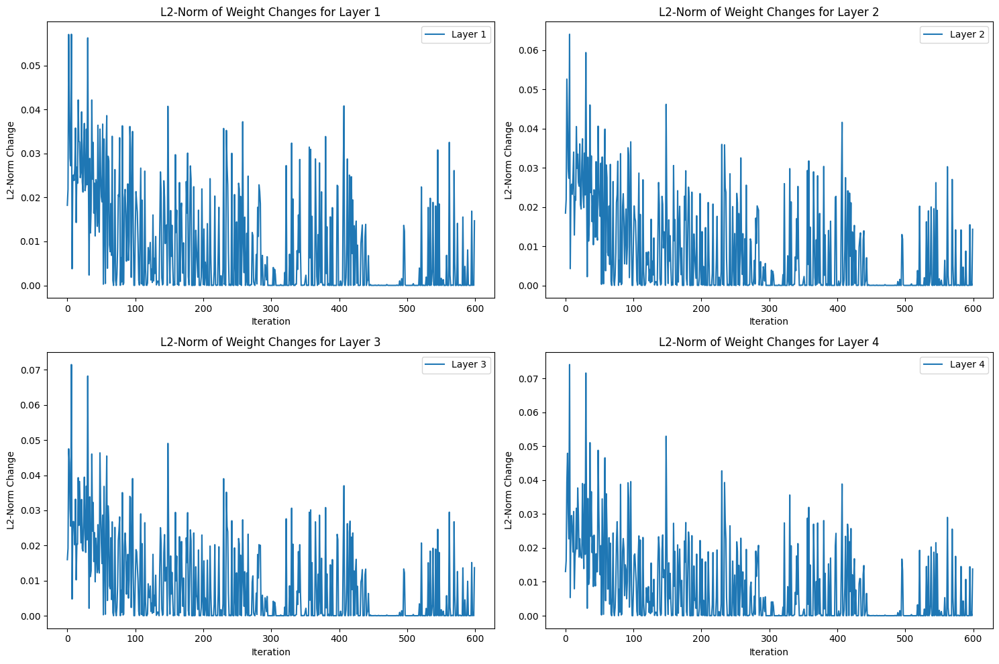

Accuracy of the model is 98.72%
Training with batch_size=1000, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.000739844418321347


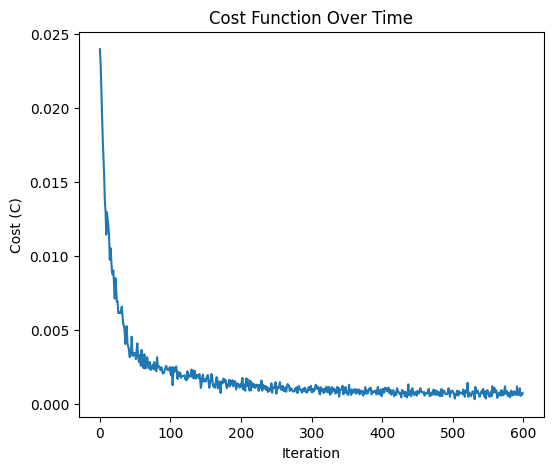

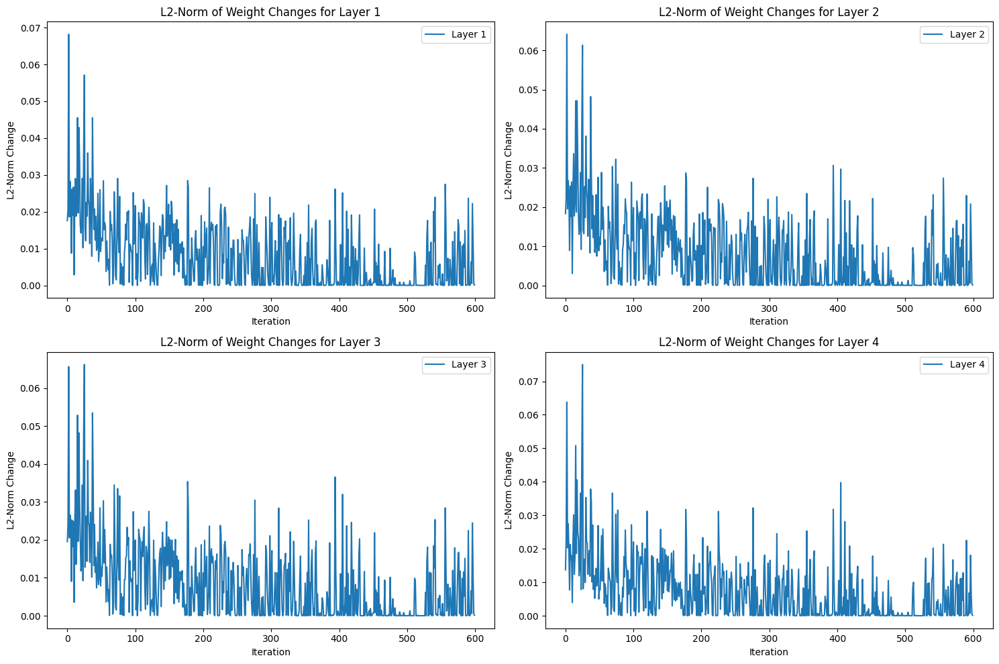

Accuracy of the model is 98.77%
{'accuracy': 0.9970399605328071, 'batch_size': 500, 'eta': 0.001, 'hidden_layers': [400, 200, 100]}


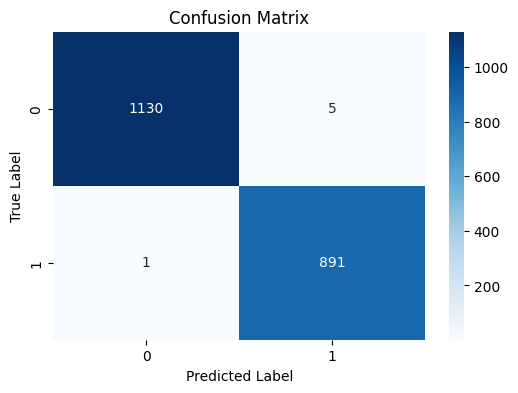

In [139]:
#CODE 1

def plot_confusion_matrix(Y_actual, Y_predicted):
    cm = confusion_matrix(Y_actual, Y_predicted)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Classifcation of digits 1 and 5
   
batch_sizes = [500, 800, 1000]
learning_rates = [0.01, 0.001, 0.0001]
hidden_layer_configs = [[400, 200, 100], [450, 250, 100], [500, 250, 50] ]

best_accuracy =0
best_hyperparameters = {}
best_Y_predicted = []

for batch_size in batch_sizes:
    for eta in learning_rates:
        for hidden_layers in hidden_layer_configs:
            print(f"Training with batch_size={batch_size}, eta={eta}, hidden_layers={hidden_layers}")

            trained_model = train_NNet(train_X_1_5, train_class_1_5, epochs = 50, batch_size=batch_size, eta = eta,hidden_layers = hidden_layers)

            # Evaluate the trained model on the test data
            test_X_1_5_extracted , test_y_1_5 = extract_digits(test_X, test_y, 1,5)
            accuracy, Y_predicted = test_model(test_X_1_5, test_y_1_5, trained_model, 1, 5)  
            print(f"Accuracy of the model is {accuracy * 100:.2f}%")

            # Track the best performing model
            if accuracy > best_accuracy:
                best_accuracy = accuracy
                best_hyperparameters = {
                'accuracy': accuracy,  # Convert to percentage
                'batch_size': batch_size,
                'eta': eta,
                'hidden_layers': hidden_layers
                }
                best_Y_predicted = Y_predicted

print(best_hyperparameters)
plot_confusion_matrix(test_y_1_5, best_Y_predicted)


Training with batch_size=500, eta=0.01, hidden_layers=[400, 200, 100]


Cost:  0.00034596755593142153


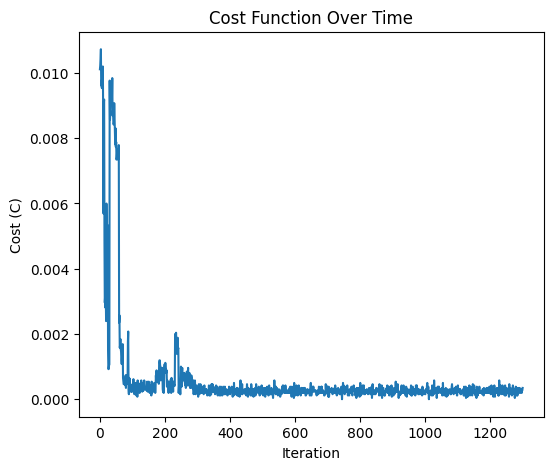

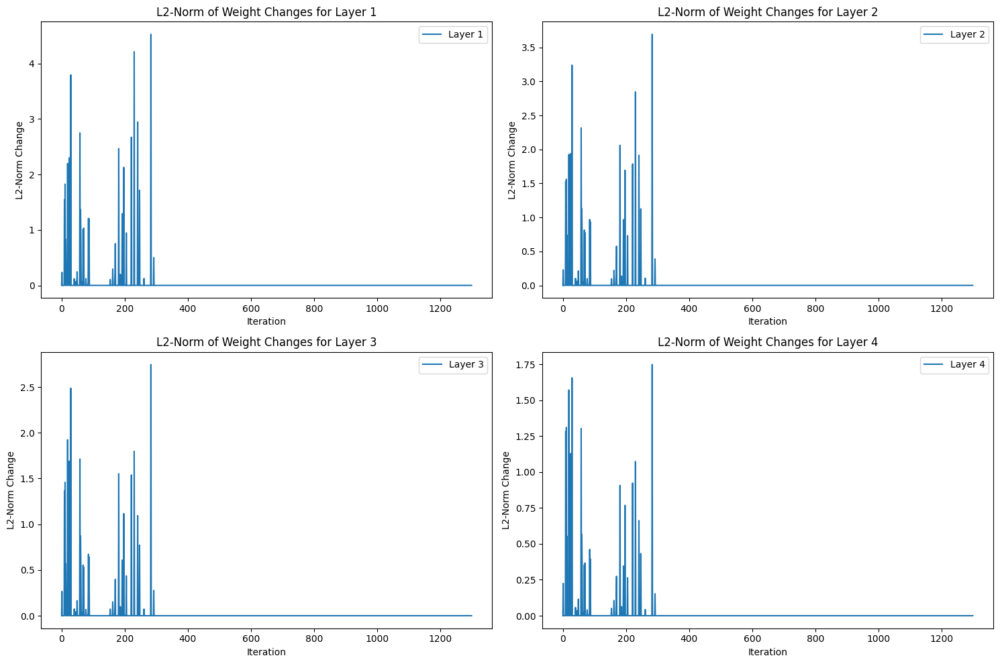

Accuracy of the model is 98.94%
Training with batch_size=500, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.009494887368340124


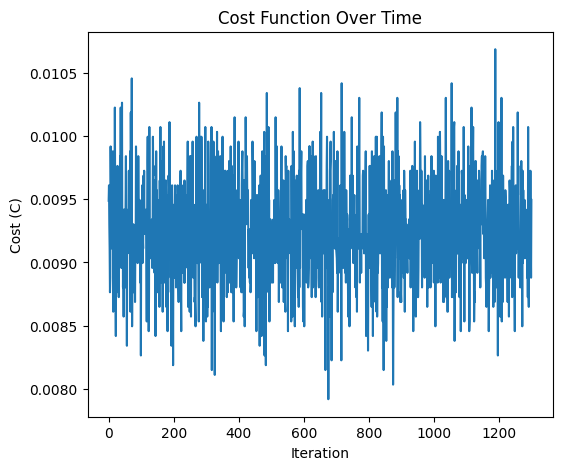

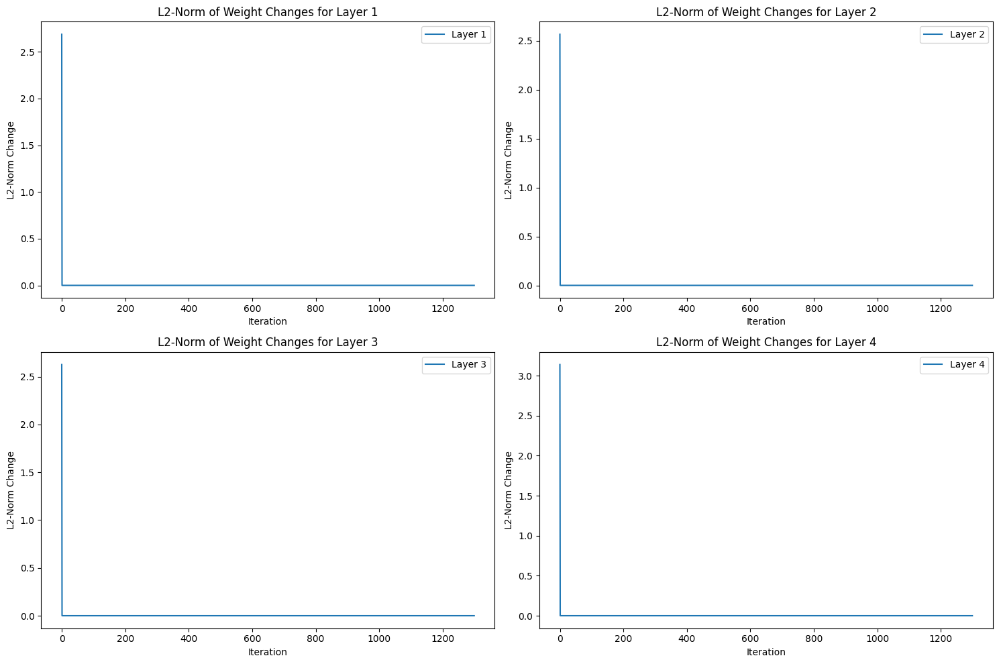

Accuracy of the model is 52.47%
Training with batch_size=500, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.0007688167909587145


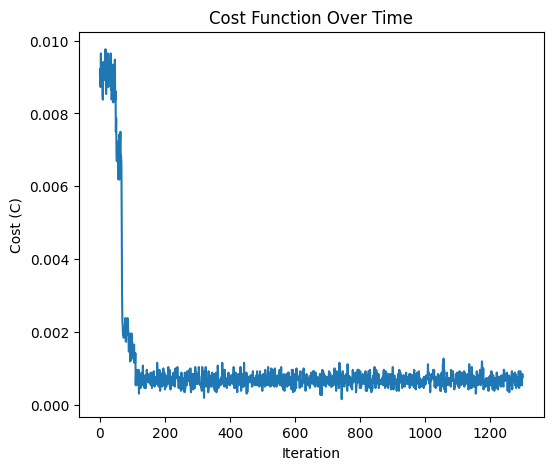

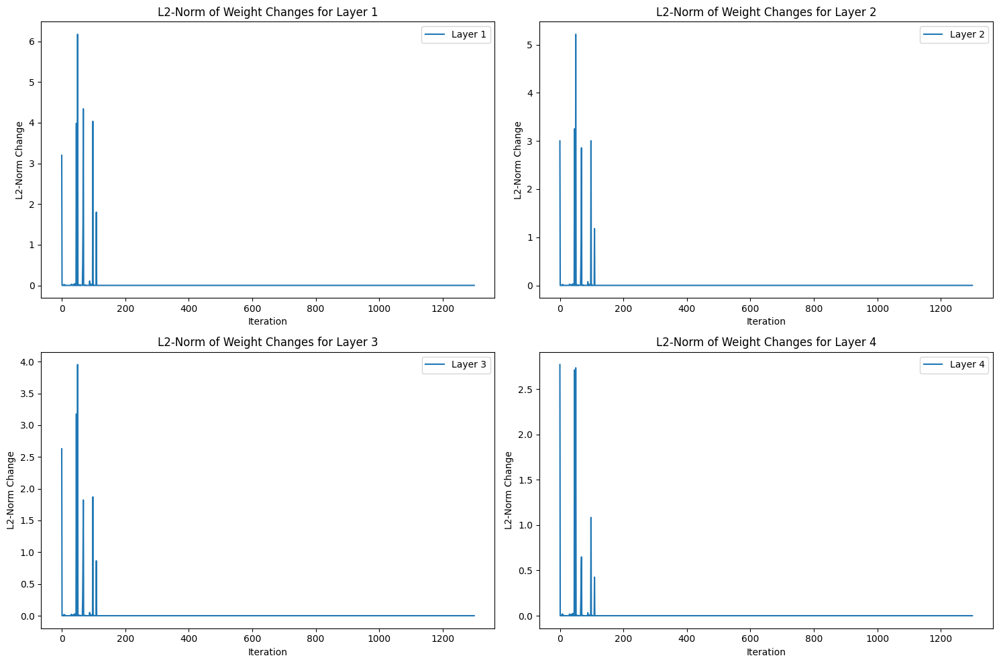

Accuracy of the model is 96.35%
Training with batch_size=500, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.00023064503728761437


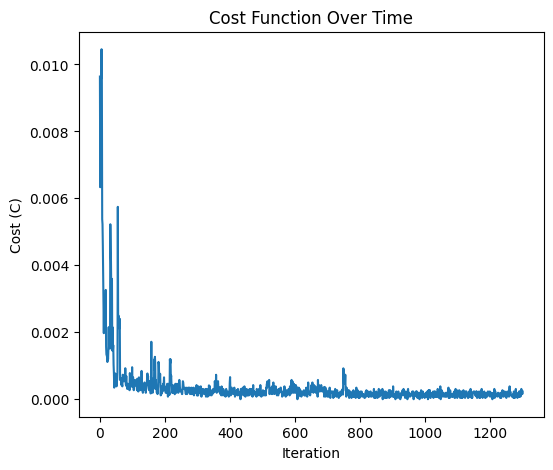

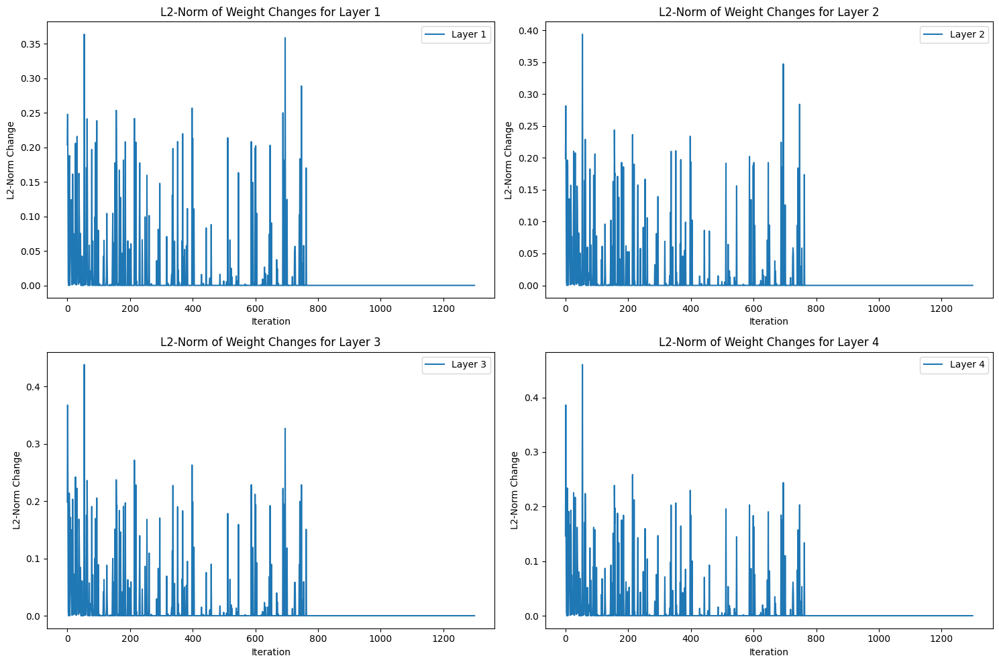

Accuracy of the model is 98.84%
Training with batch_size=500, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  7.688167909587145e-05


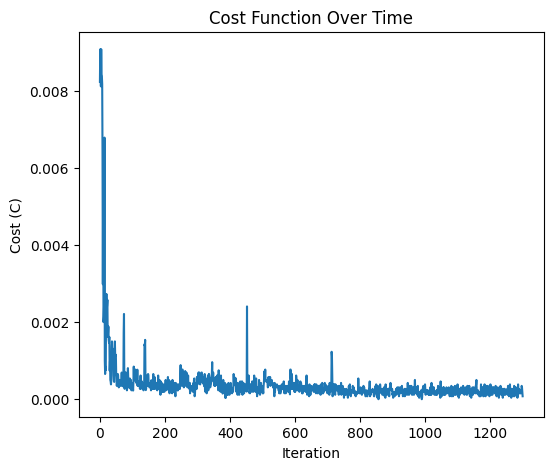

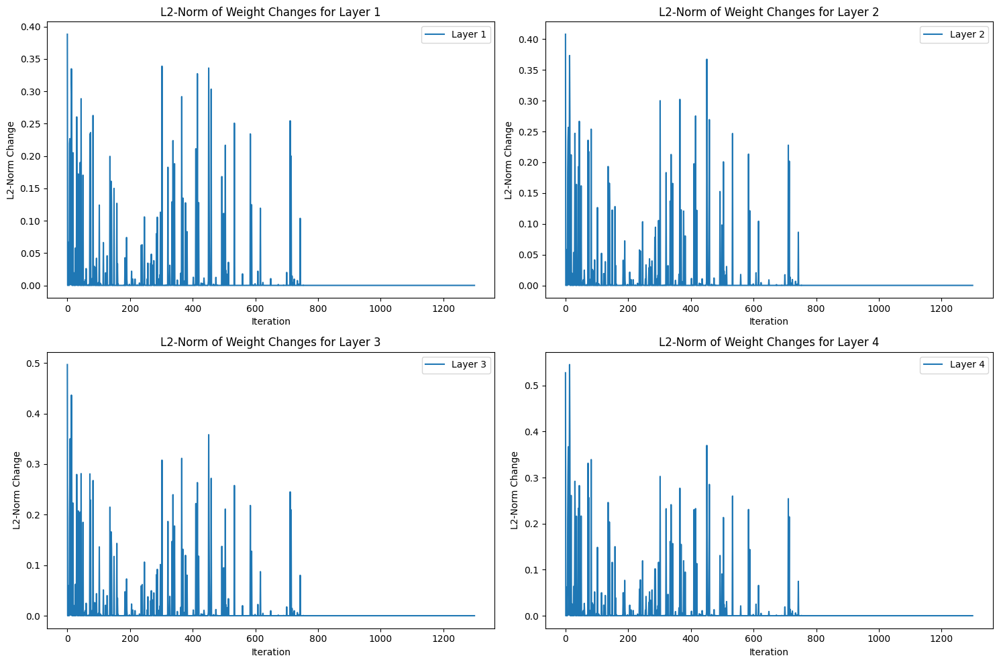

Accuracy of the model is 98.84%
Training with batch_size=500, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.0001537633581917429


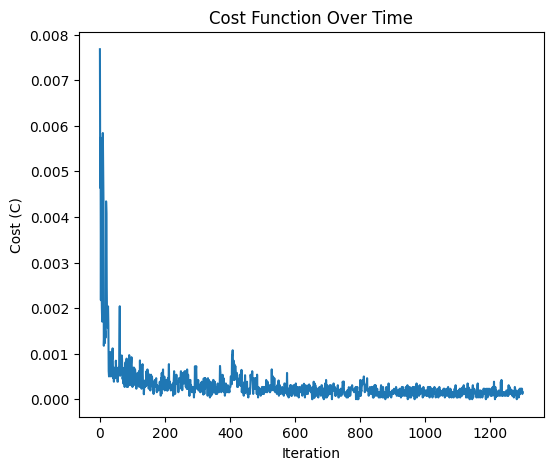

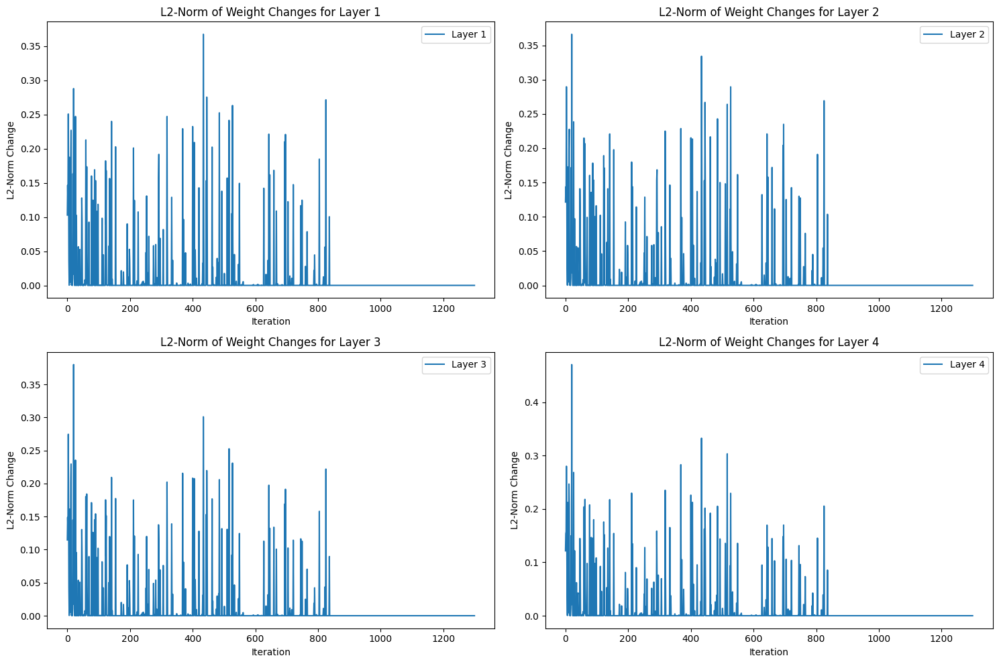

Accuracy of the model is 99.17%
Training with batch_size=500, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.009763973245175321


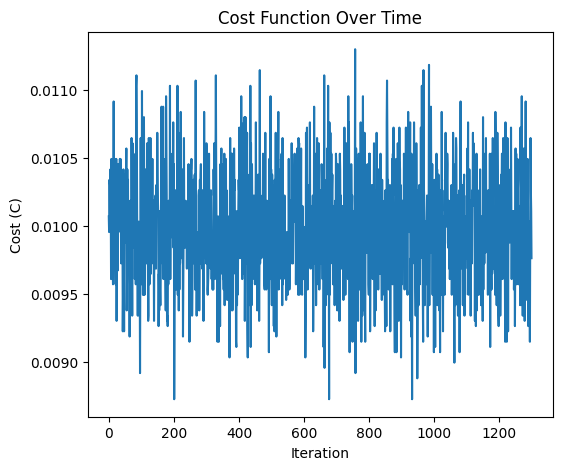

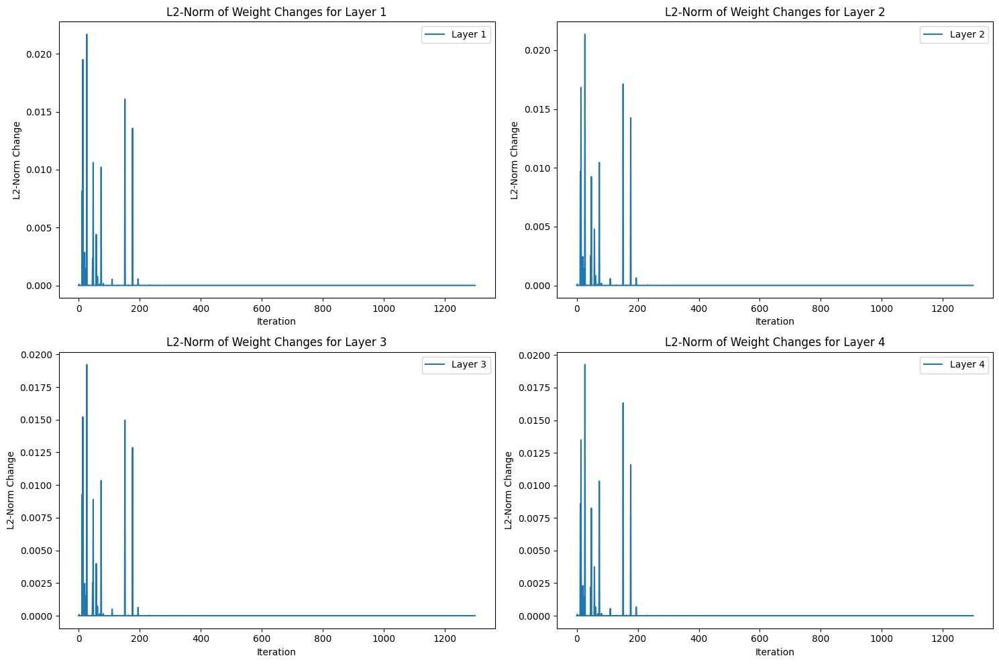

Accuracy of the model is 47.39%
Training with batch_size=500, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.00032046089131002926


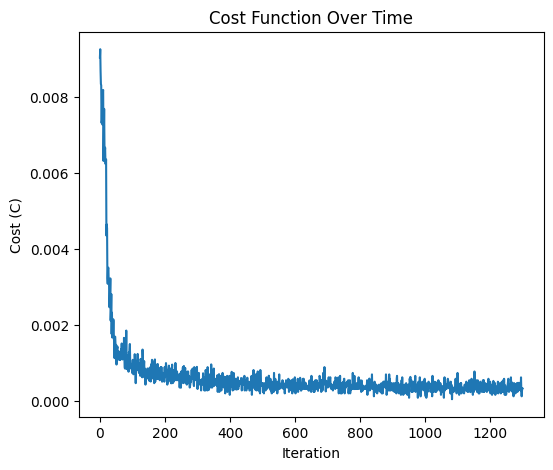

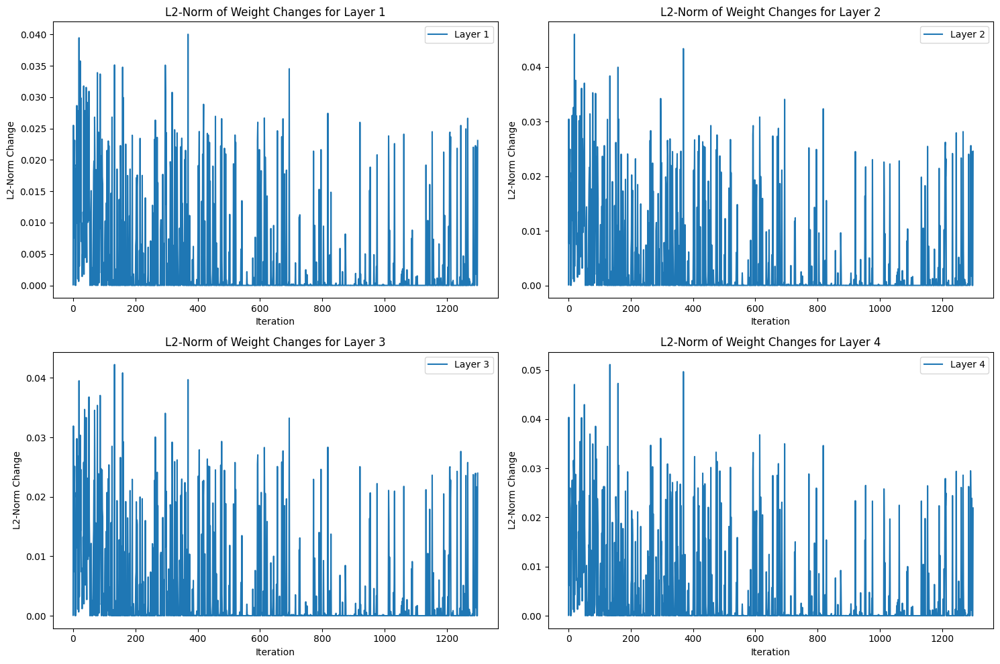

Accuracy of the model is 97.97%
Training with batch_size=500, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.00038440839563756306


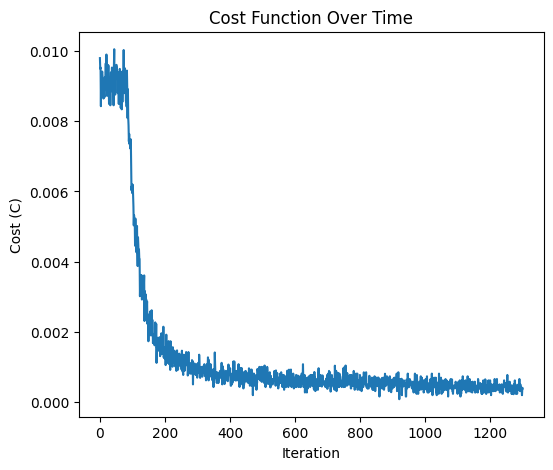

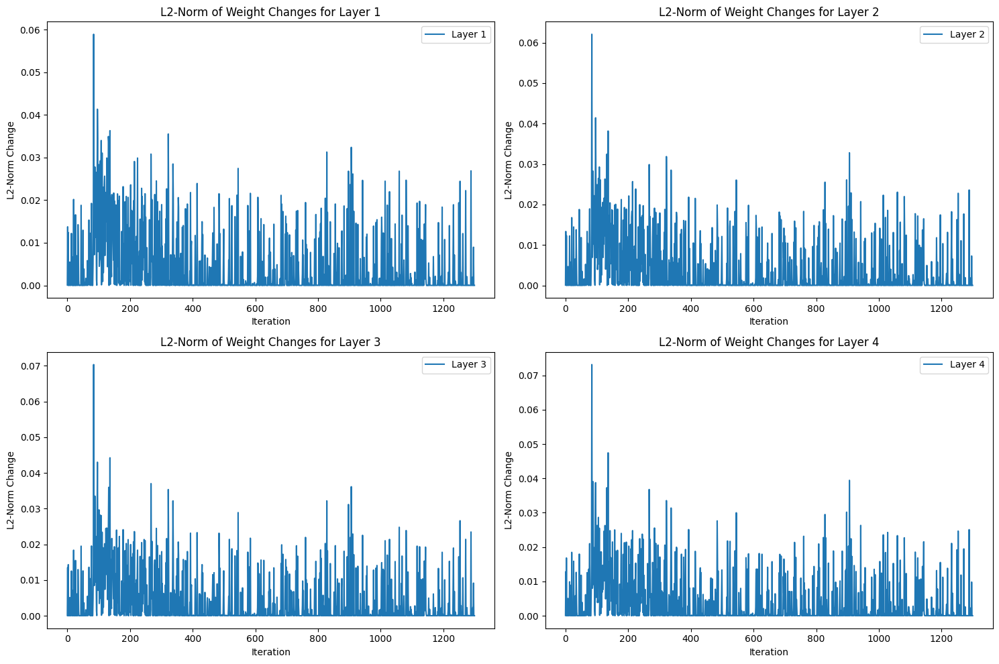

Accuracy of the model is 97.83%
Training with batch_size=800, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.014684400707311447


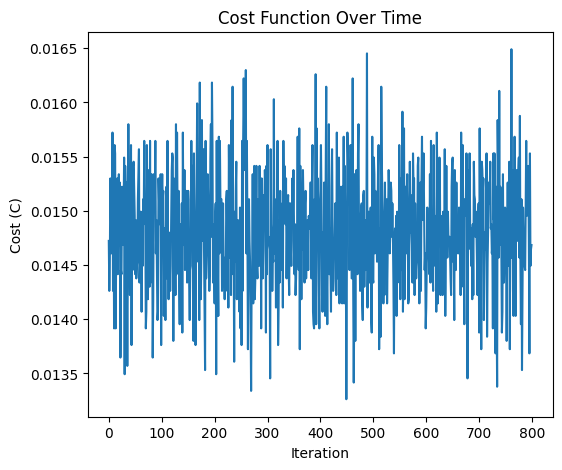

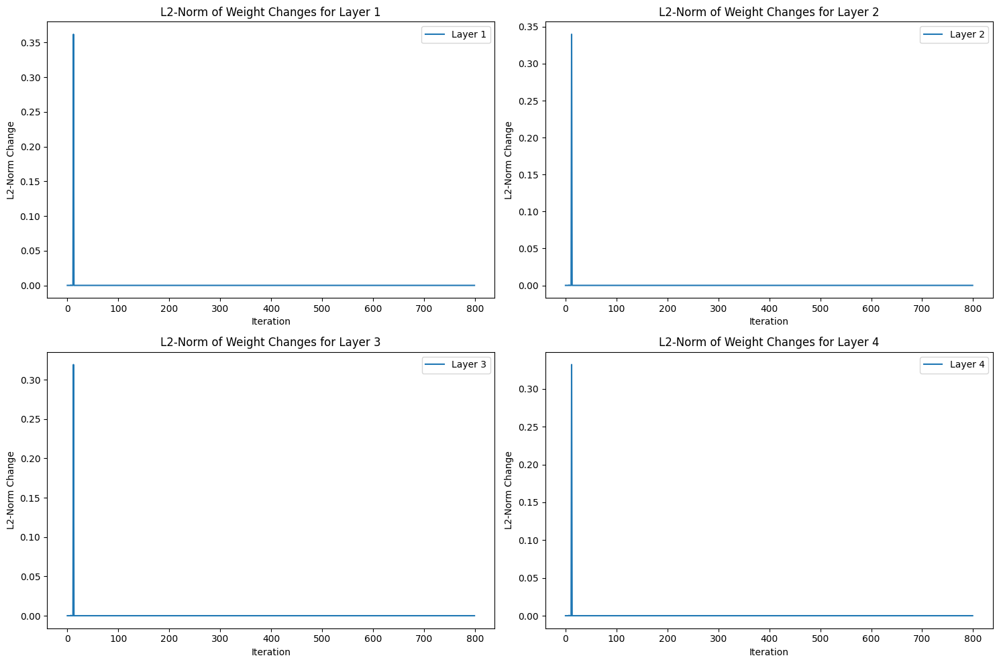

Accuracy of the model is 52.47%
Training with batch_size=800, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.01576074421465365


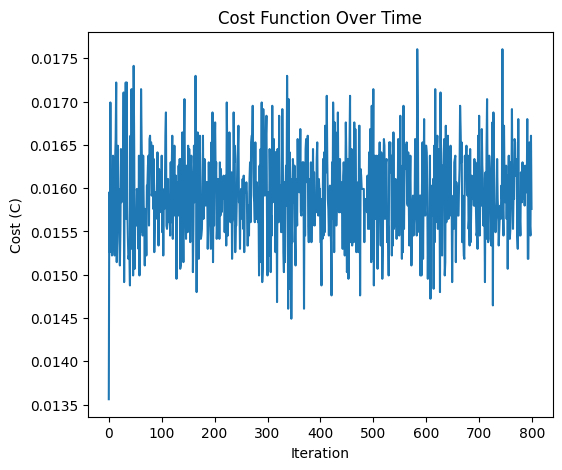

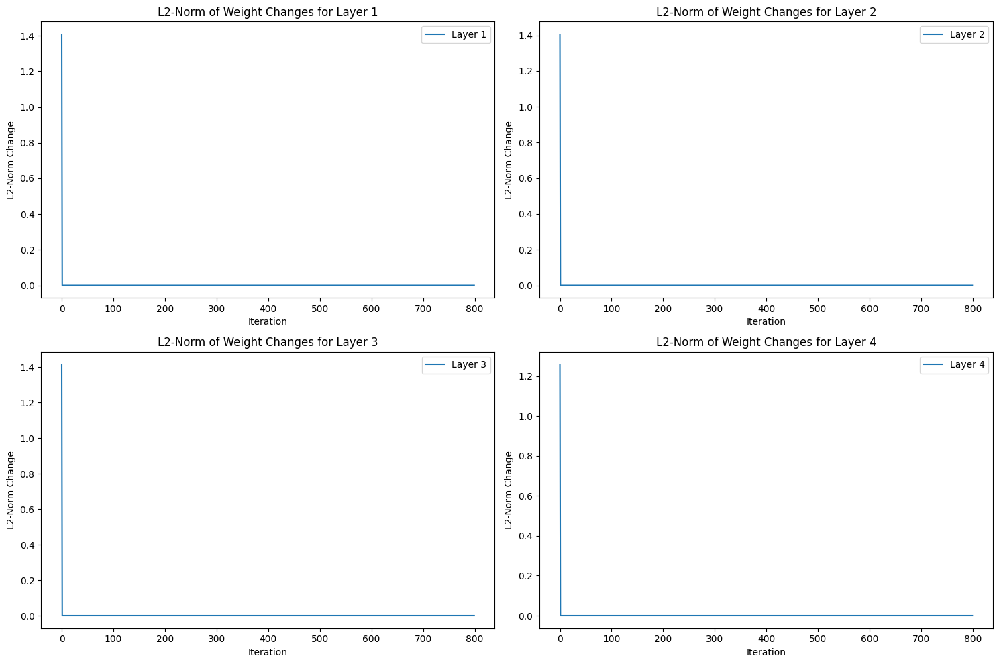

Accuracy of the model is 47.53%
Training with batch_size=800, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.015568540016913969


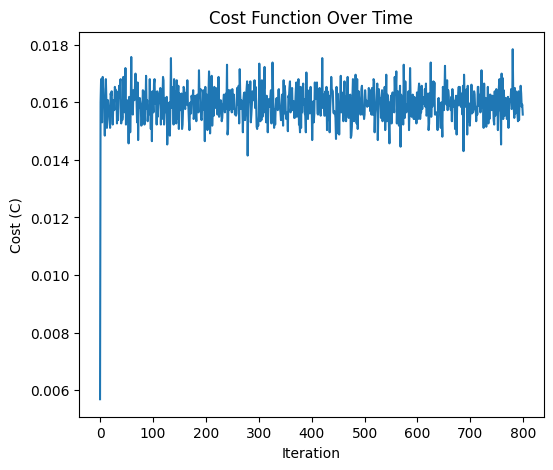

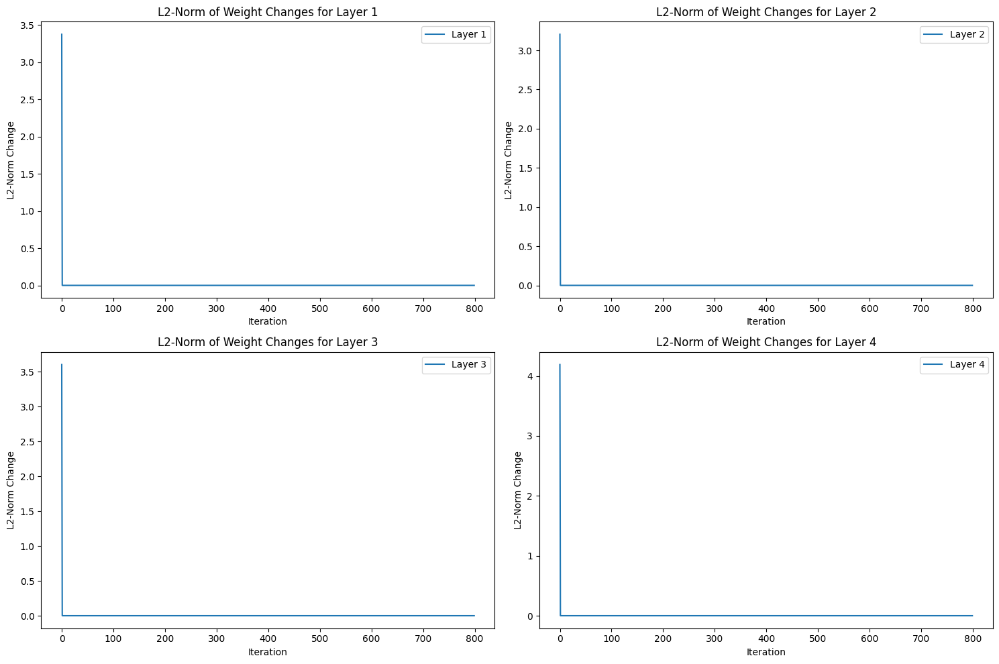

Accuracy of the model is 47.53%
Training with batch_size=800, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.00026908587683524847


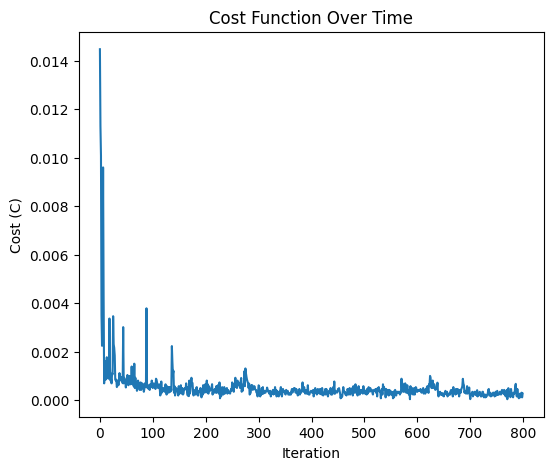

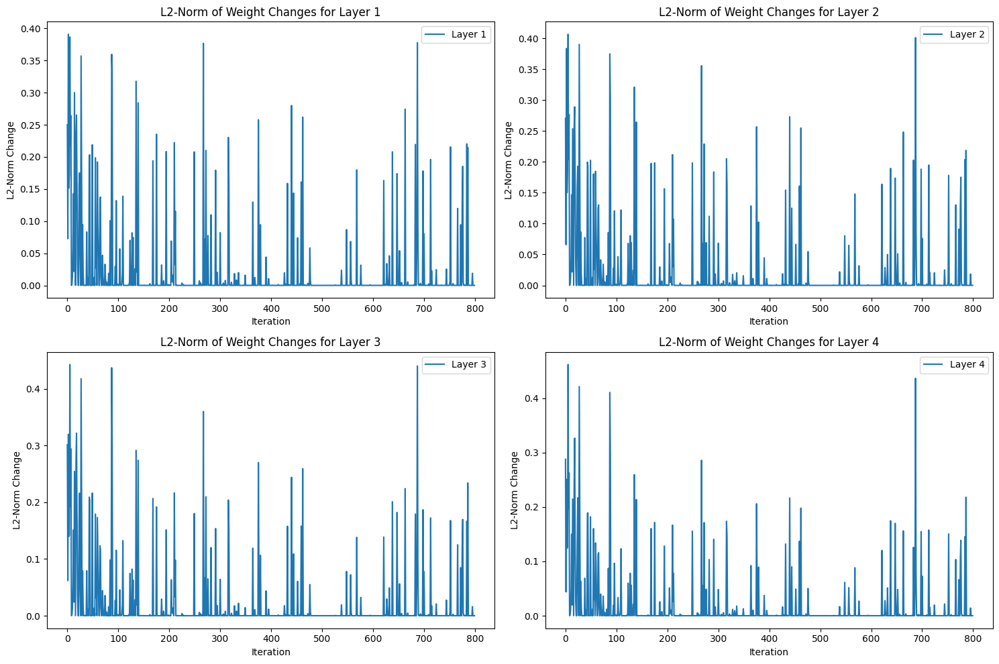

Accuracy of the model is 99.08%
Training with batch_size=800, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.00019220419836301126


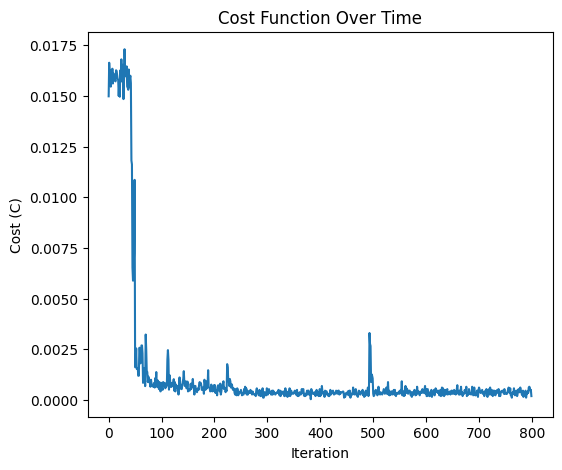

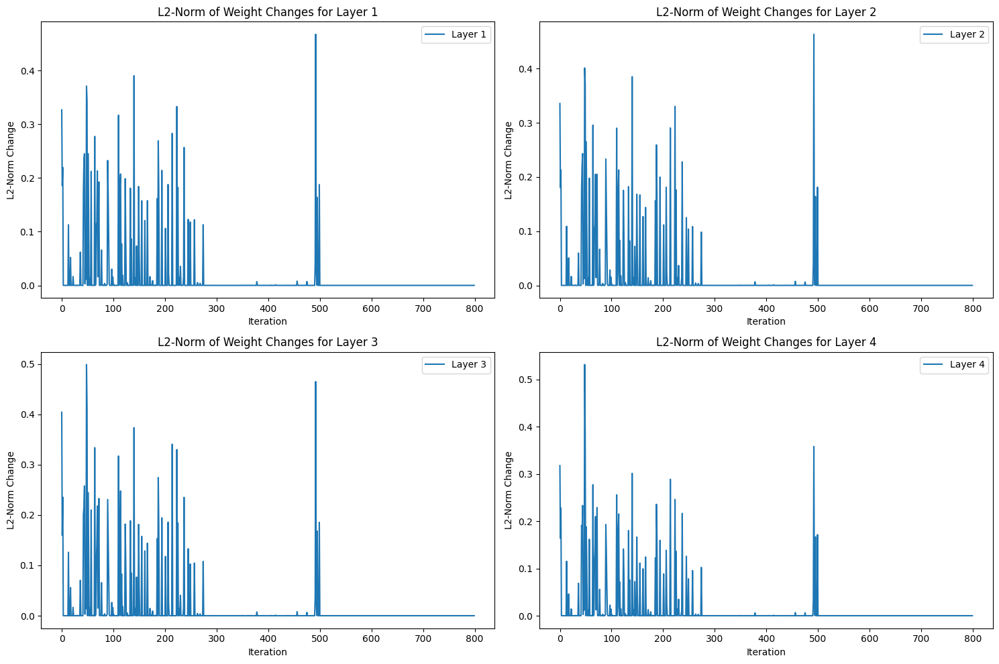

Accuracy of the model is 98.80%
Training with batch_size=800, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  3.844083954793573e-05


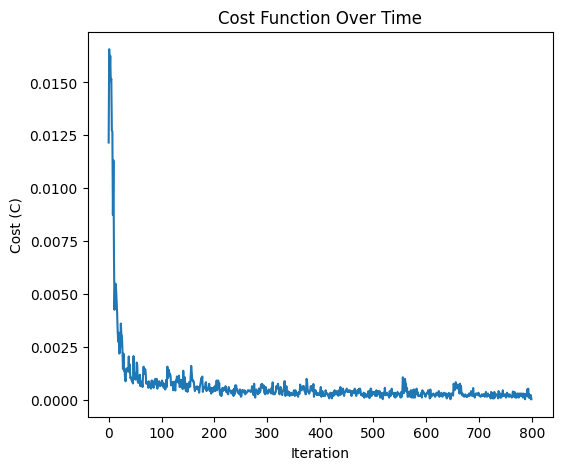

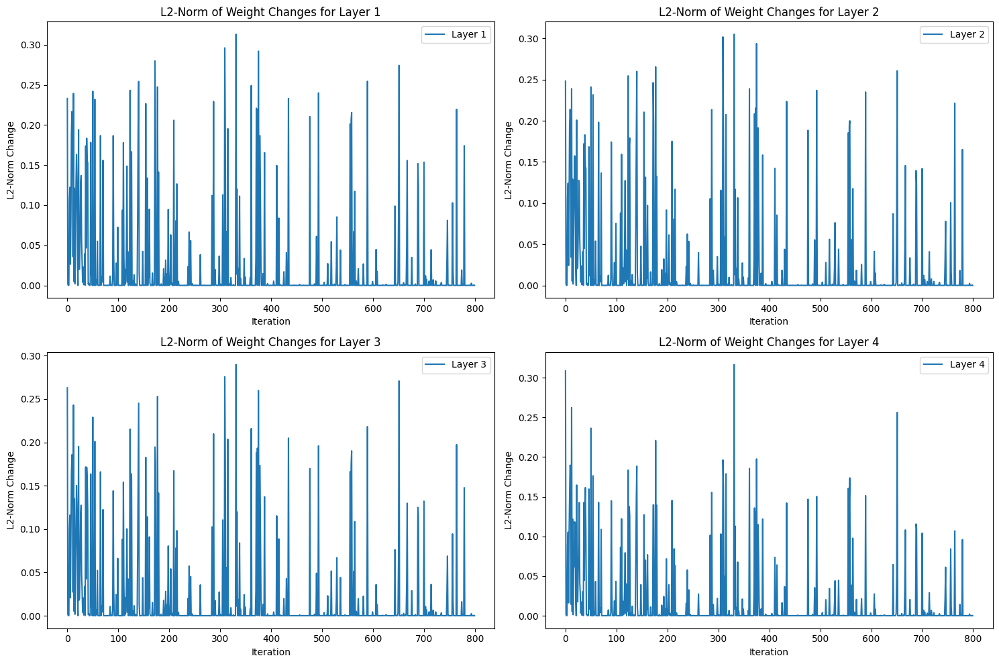

Accuracy of the model is 99.12%
Training with batch_size=800, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.000999461473707159


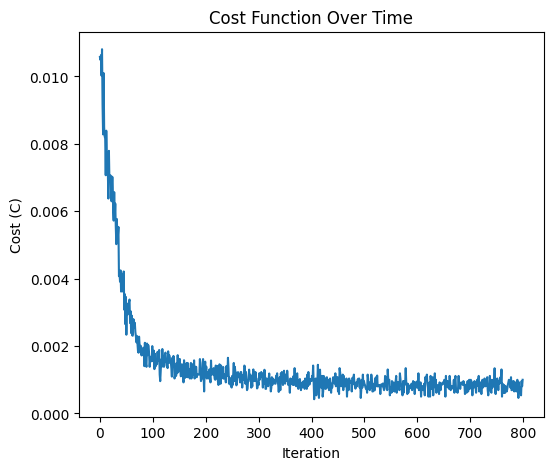

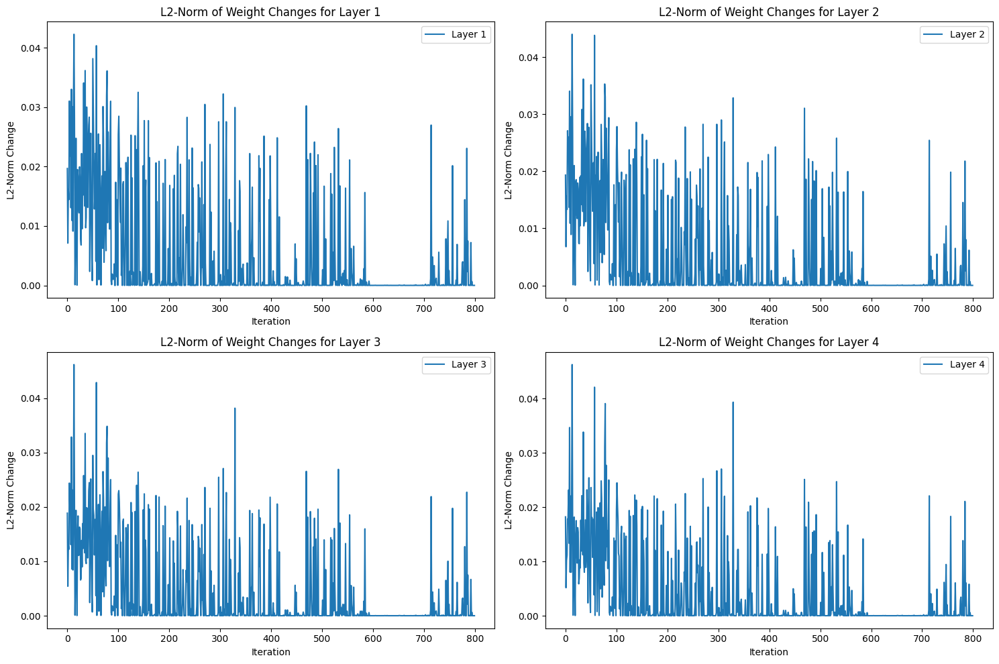

Accuracy of the model is 97.46%
Training with batch_size=800, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0006534942723149074


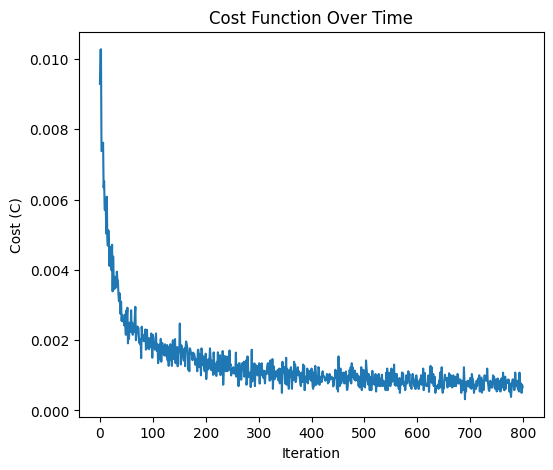

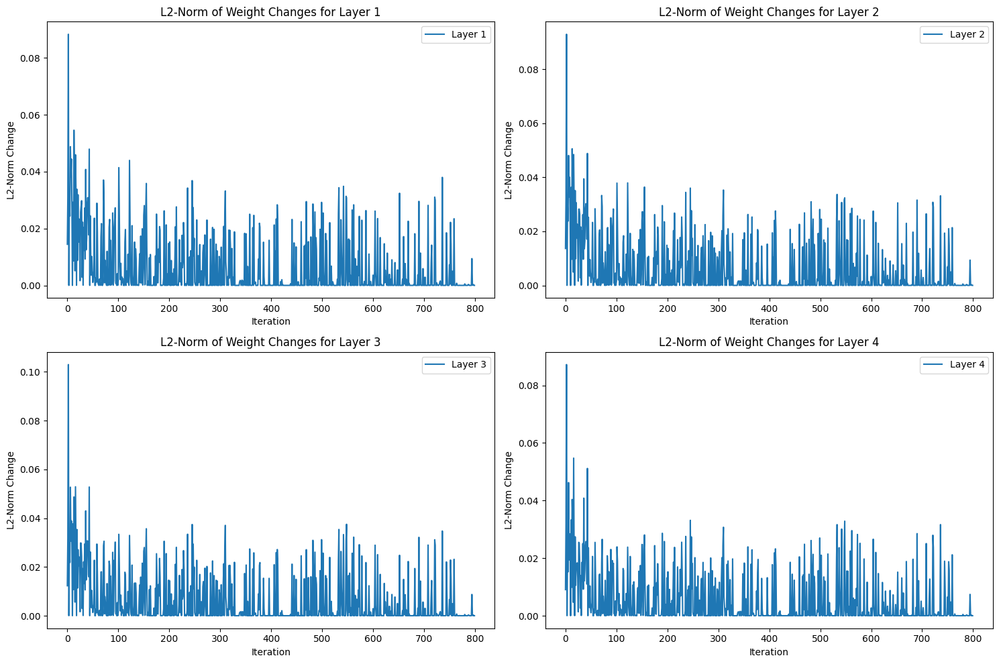

Accuracy of the model is 98.01%
Training with batch_size=800, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.0005513986673418191


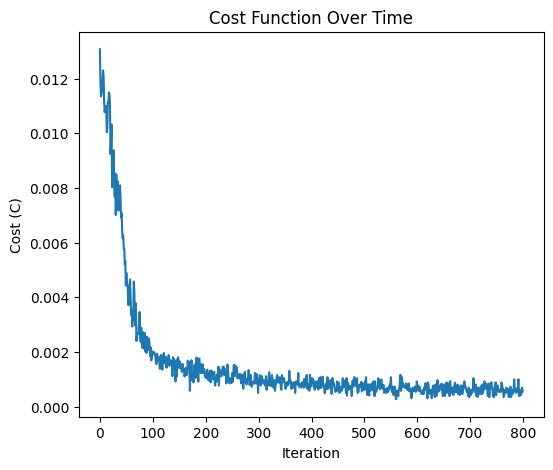

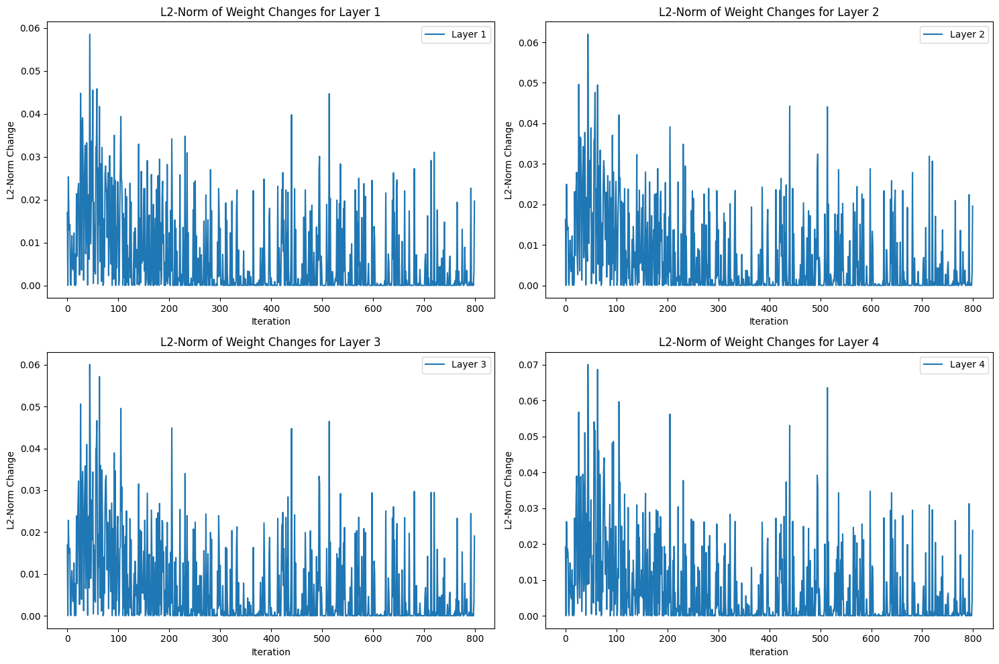

Accuracy of the model is 97.69%
Training with batch_size=1000, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.018028753747981855


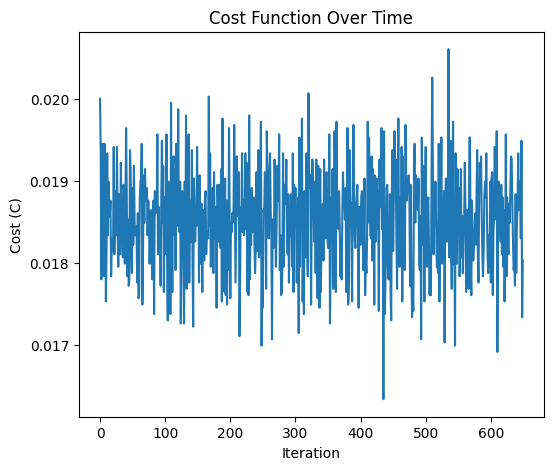

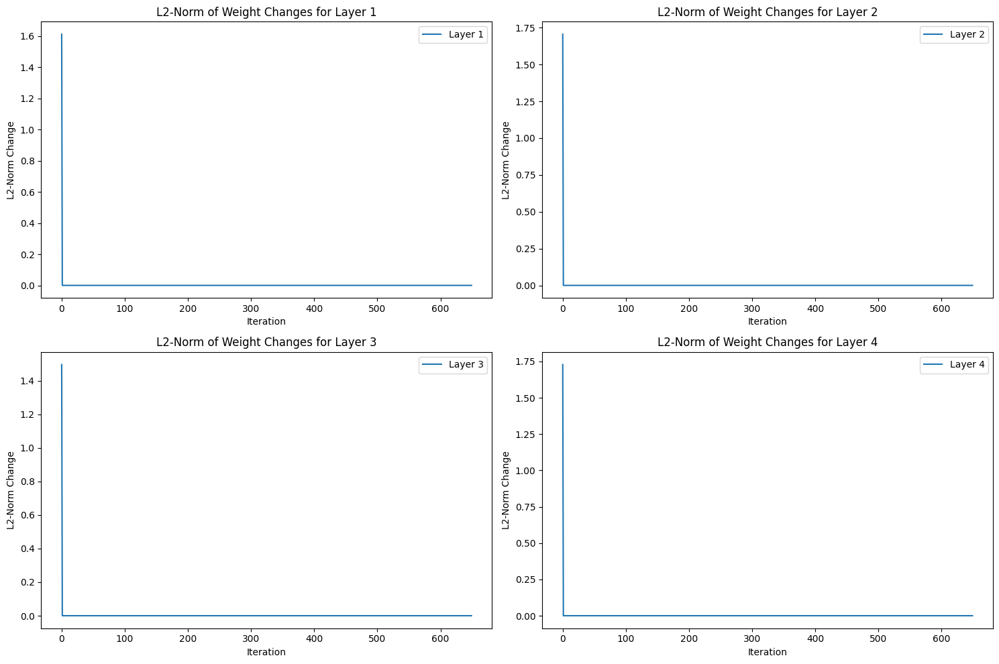

Accuracy of the model is 52.47%
Training with batch_size=1000, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.020104559083570384


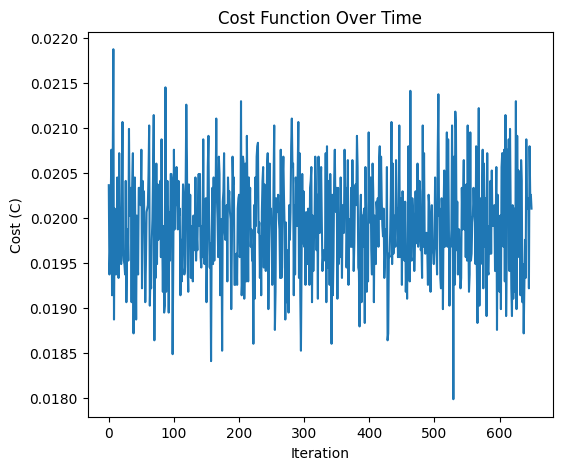

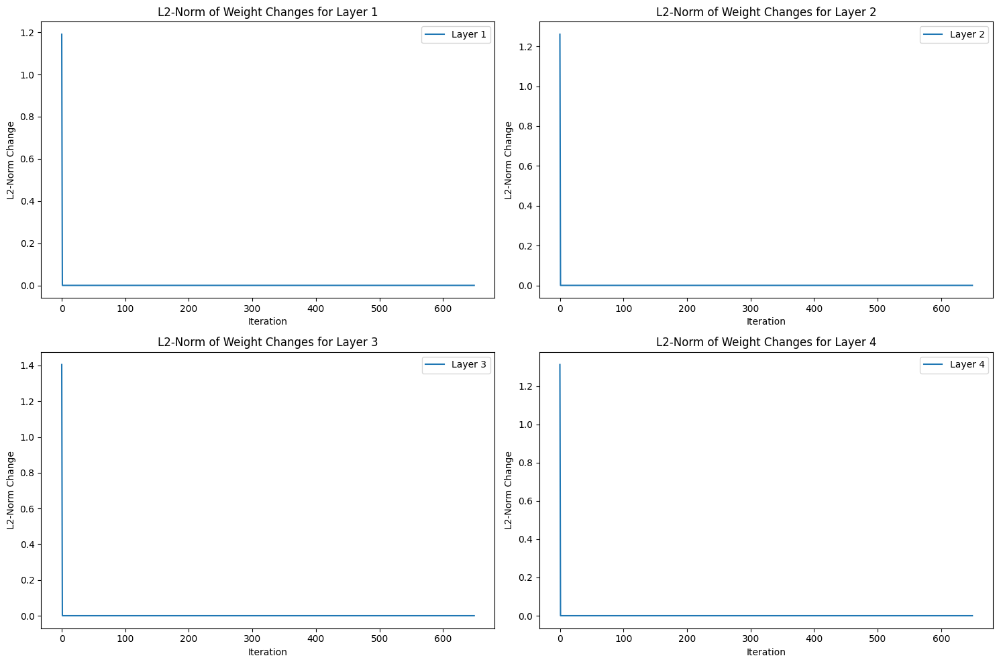

Accuracy of the model is 47.53%
Training with batch_size=1000, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.019220419773967864


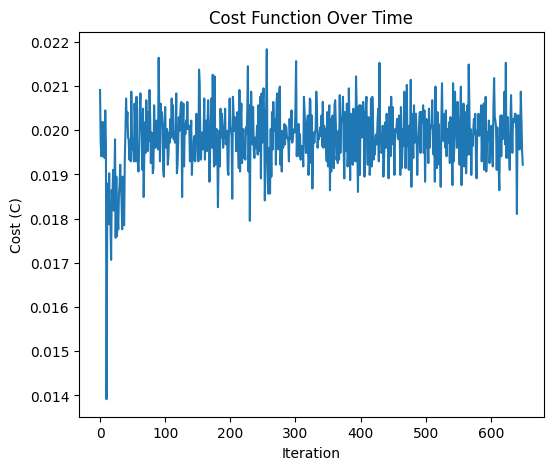

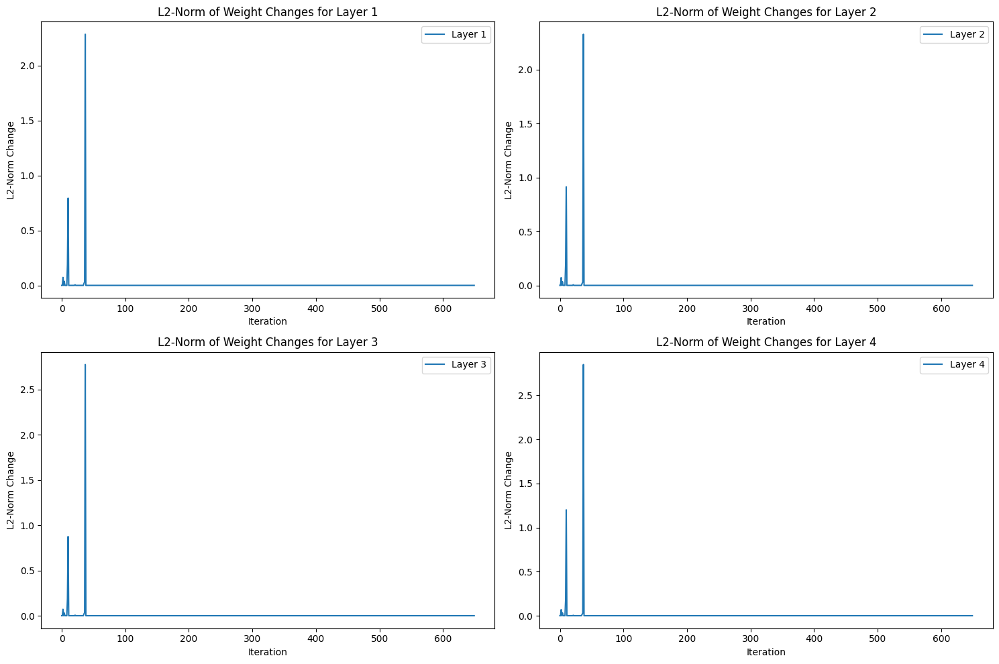

Accuracy of the model is 47.53%
Training with batch_size=1000, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.00023064503728761437


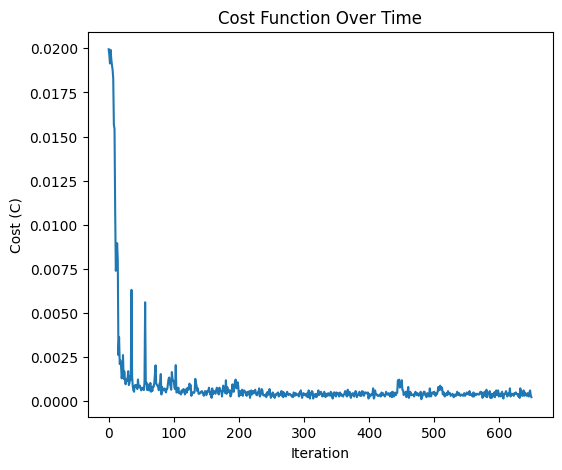

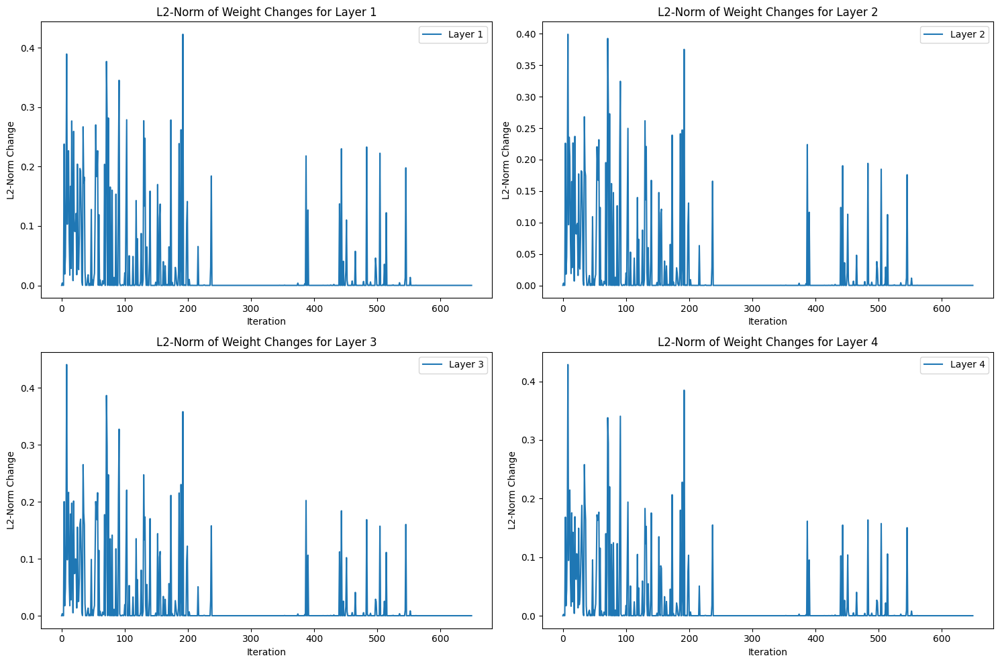

Accuracy of the model is 99.08%
Training with batch_size=1000, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.0006534939465387561


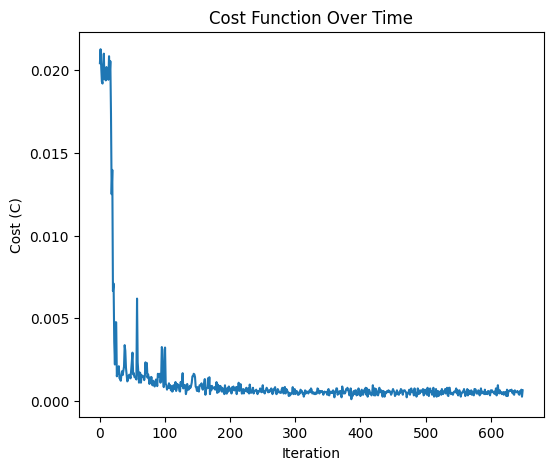

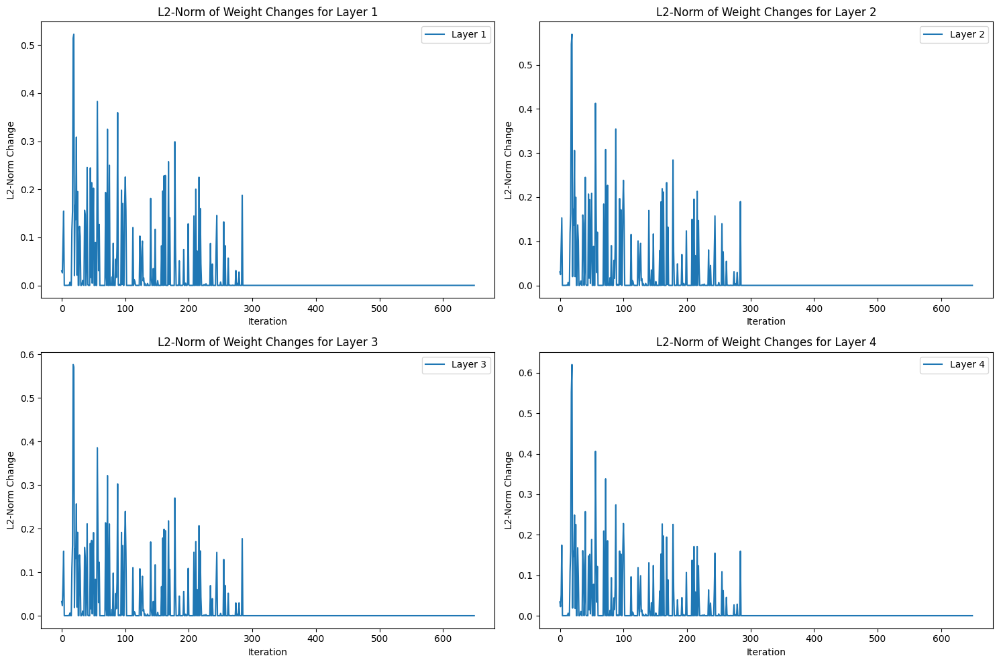

Accuracy of the model is 98.80%
Training with batch_size=1000, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.00046129007457522875


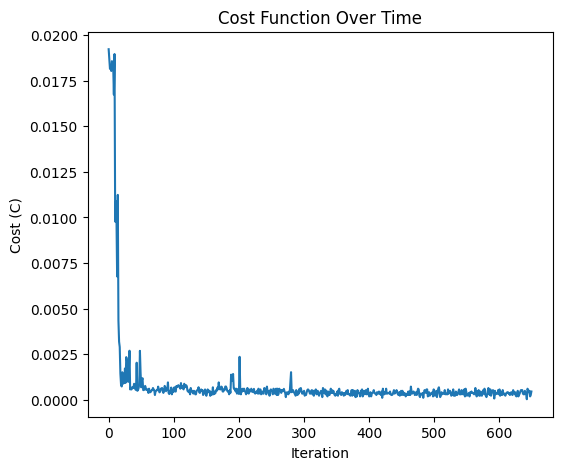

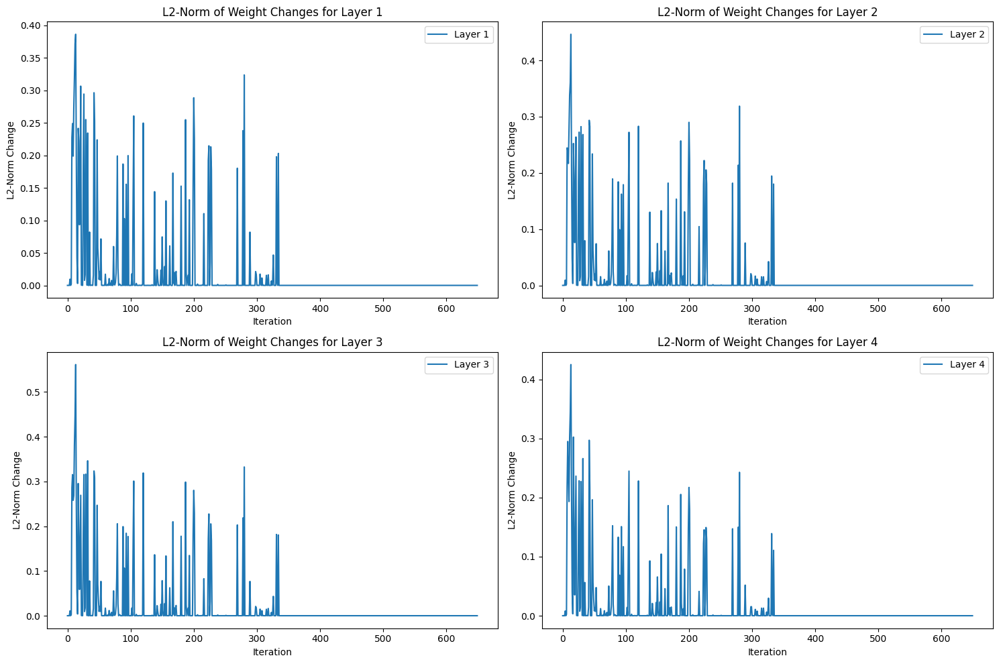

Accuracy of the model is 98.75%
Training with batch_size=1000, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.0009591216682498923


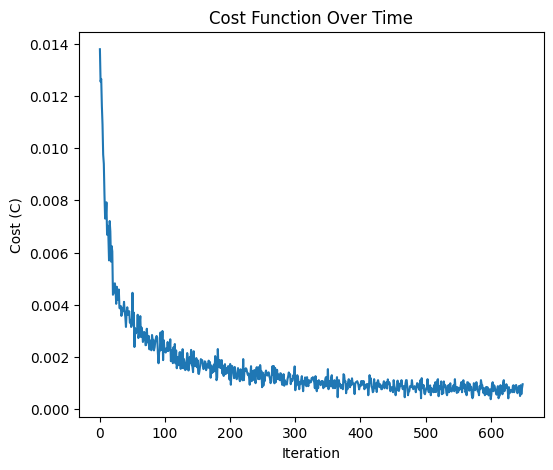

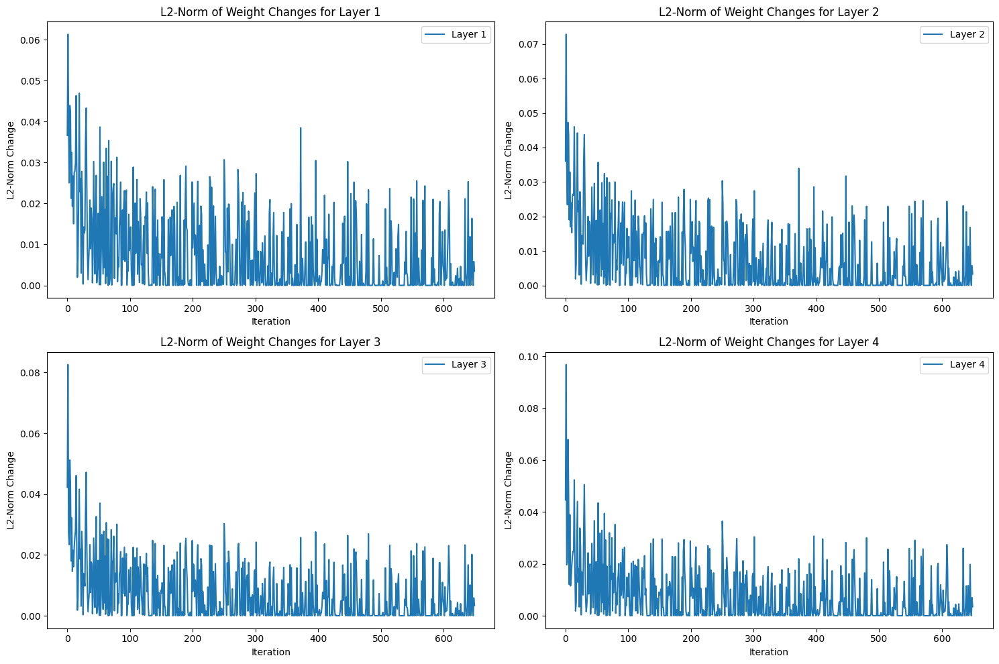

Accuracy of the model is 97.73%
Training with batch_size=1000, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.000691935111873571


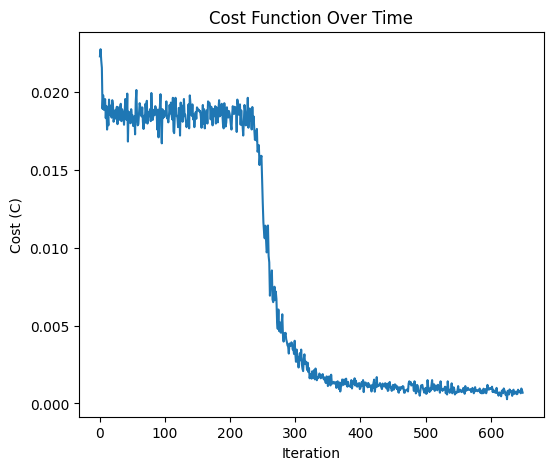

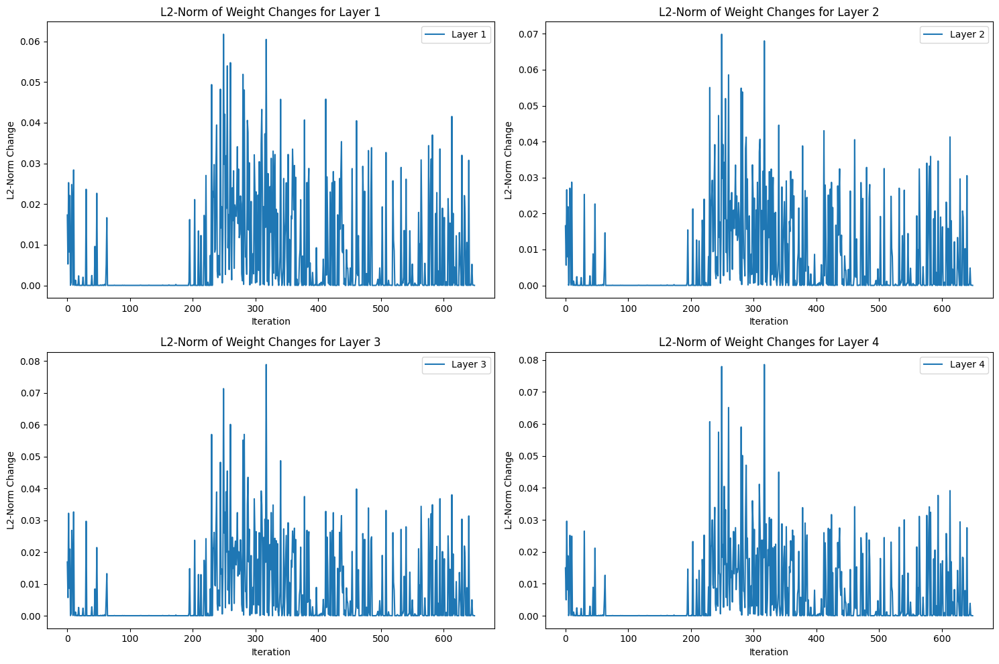

Accuracy of the model is 97.50%
Training with batch_size=1000, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.0003844572508701581


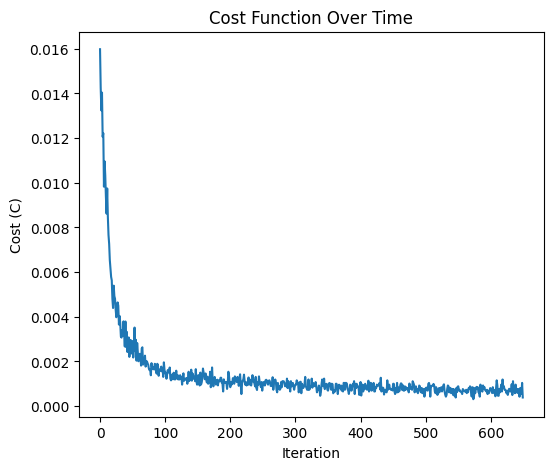

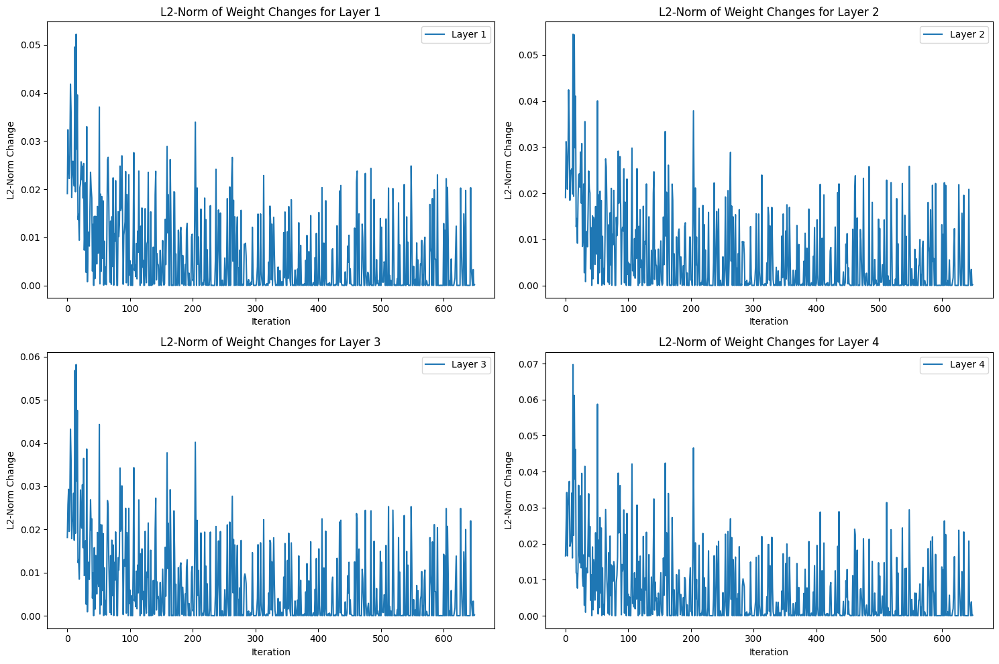

Accuracy of the model is 98.10%
{'accuracy': 0.9916782246879334, 'batch_size': 500, 'eta': 0.001, 'hidden_layers': [500, 250, 50]}


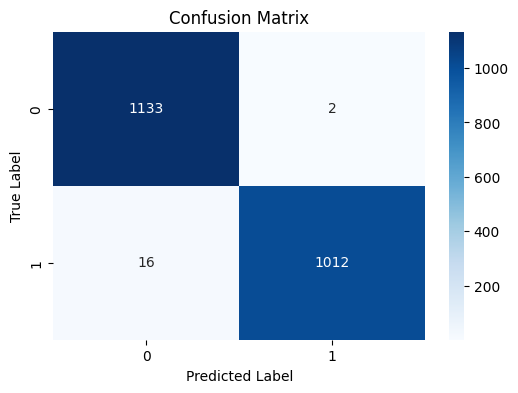

In [145]:
#CODE 2

# Classifcation of digits 1 and 7
    
batch_sizes = [500, 800, 1000]
learning_rates = [0.01, 0.001, 0.0001]
hidden_layer_configs = [[400, 200, 100], [450, 250, 100], [500, 250, 50] ]

best_accuracy =0
best_hyperparameters = {}
best_Y_predicted = []

for batch_size in batch_sizes:
    for eta in learning_rates:
        for hidden_layers in hidden_layer_configs:
            print(f"Training with batch_size={batch_size}, eta={eta}, hidden_layers={hidden_layers}")
            
            (train_X_1_7 ,train_class_1_7),(test_X_1_7,test_class_1_7) = transform_data_and_labels(train_X, train_y, test_X, test_y, 1, 7)

            trained_model = train_NNet(train_X_1_7, train_class_1_7, epochs = 50, batch_size=batch_size, eta = eta,hidden_layers = hidden_layers)

            # Evaluate the trained model on the test data
            test_X_1_7_extracted , test_y_1_7 = extract_digits(test_X, test_y, 1,7)
            accuracy, Y_predicted = test_model(test_X_1_7, test_y_1_7, trained_model, 1, 7)  
            print(f"Accuracy of the model is {accuracy * 100:.2f}%")

            # Track the best performing model
            if accuracy > best_accuracy:
                best_accuracy = accuracy
                best_hyperparameters = {
                'accuracy': accuracy,  # Convert to percentage
                'batch_size': batch_size,
                'eta': eta,
                'hidden_layers': hidden_layers
                }
                best_Y_predicted = Y_predicted

print(best_hyperparameters)
plot_confusion_matrix(test_y_1_7, best_Y_predicted)



Training with batch_size=500, eta=0.01, hidden_layers=[400, 200, 100]


Cost:  0.010833545755799133


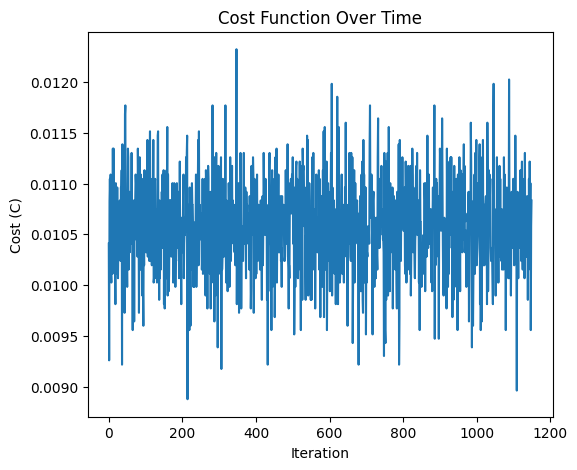

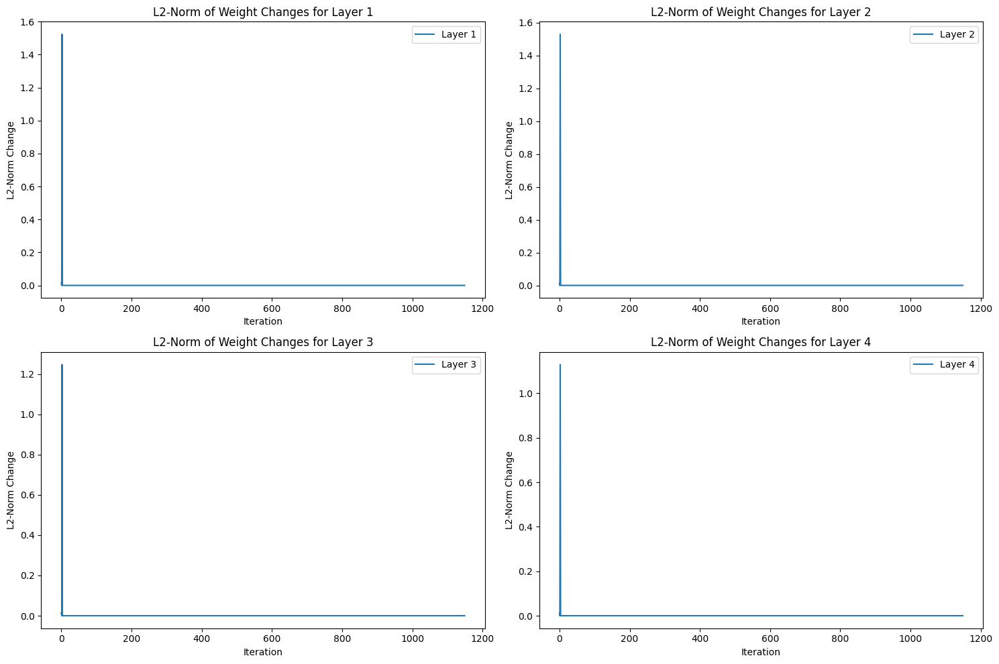

Accuracy of the model is 49.59%
Training with batch_size=500, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.011088452714759113


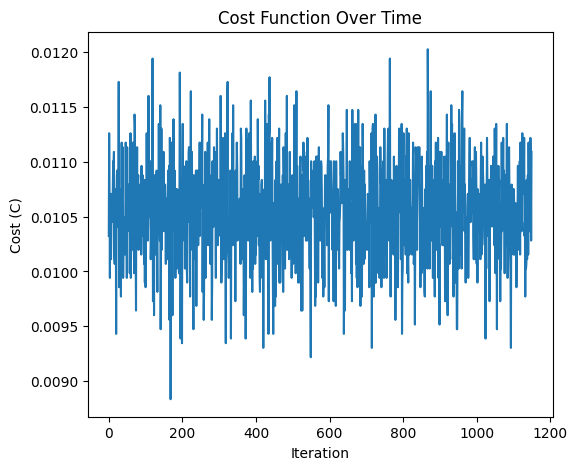

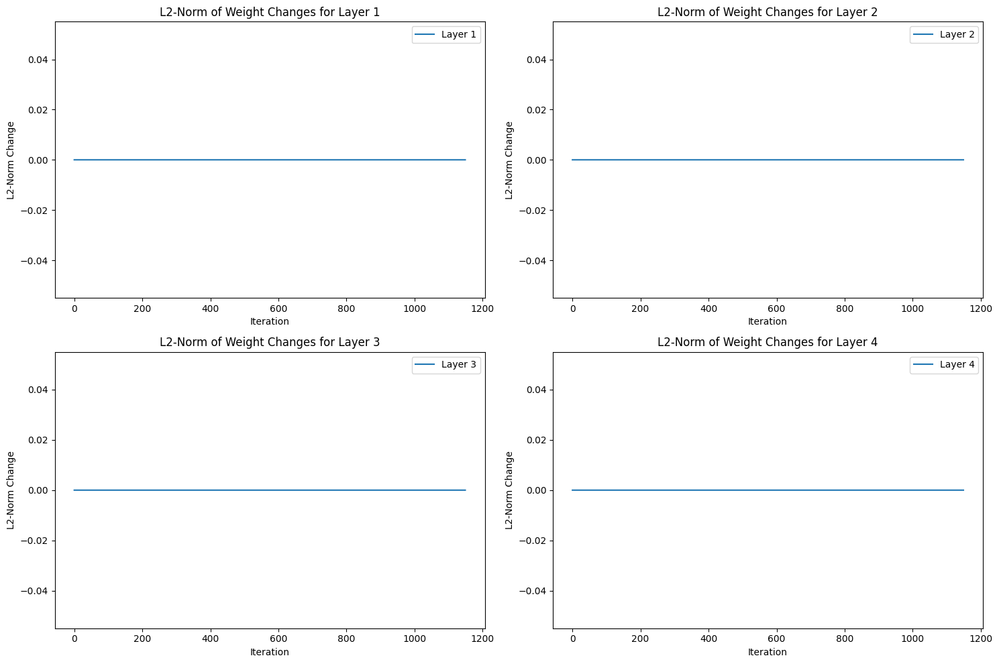

Accuracy of the model is 49.59%
Training with batch_size=500, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.010621123289999151


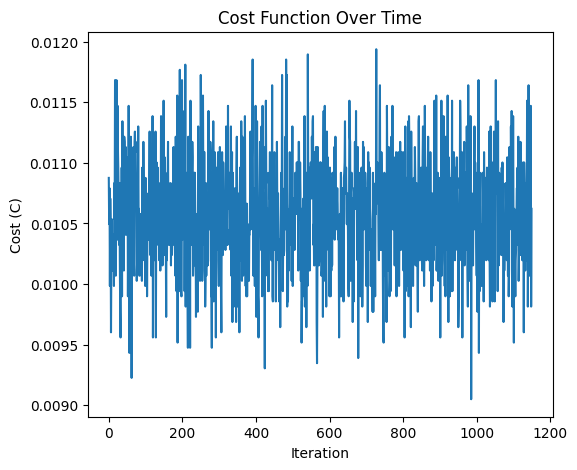

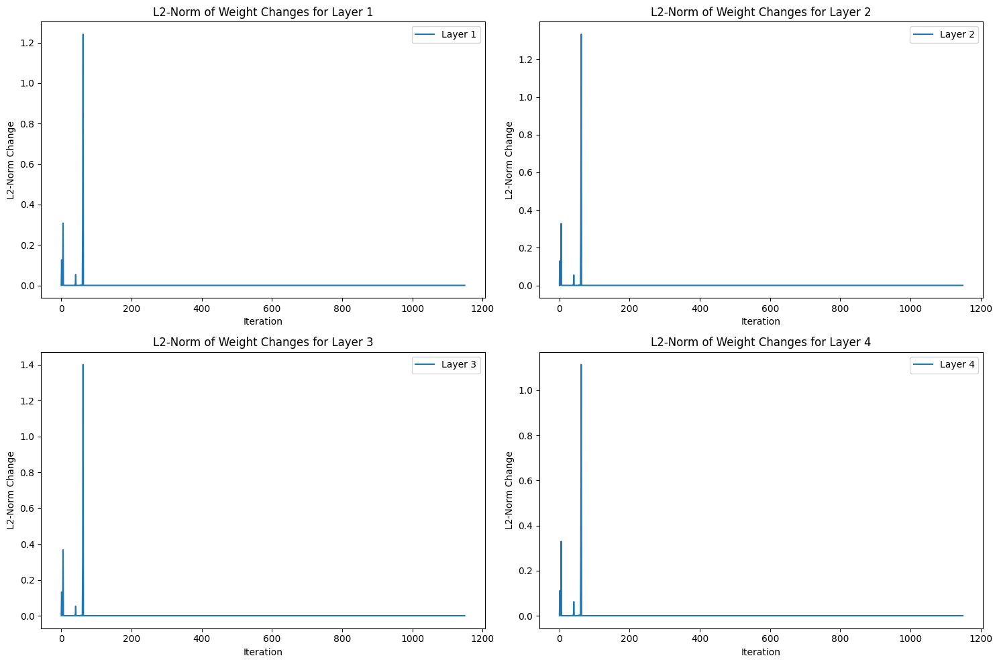

Accuracy of the model is 49.59%
Training with batch_size=500, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.00038236042244864724


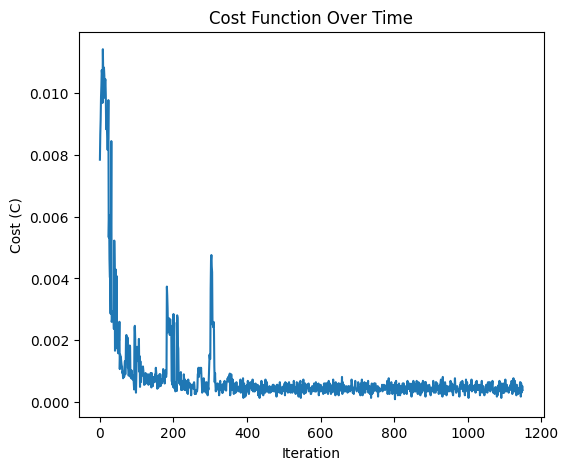

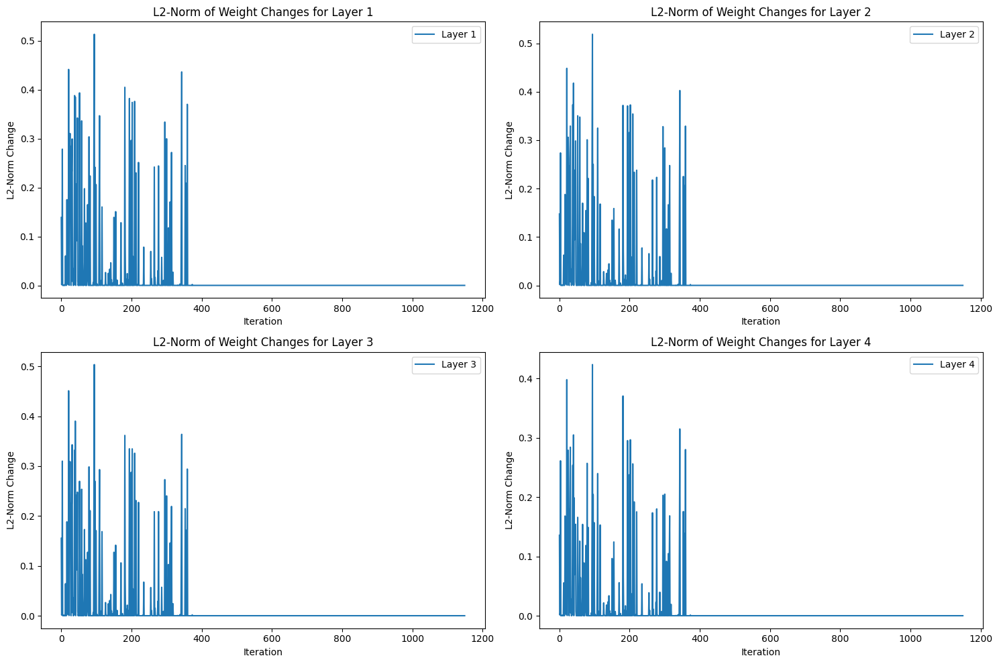

Accuracy of the model is 97.72%
Training with batch_size=500, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.00016993797269090102


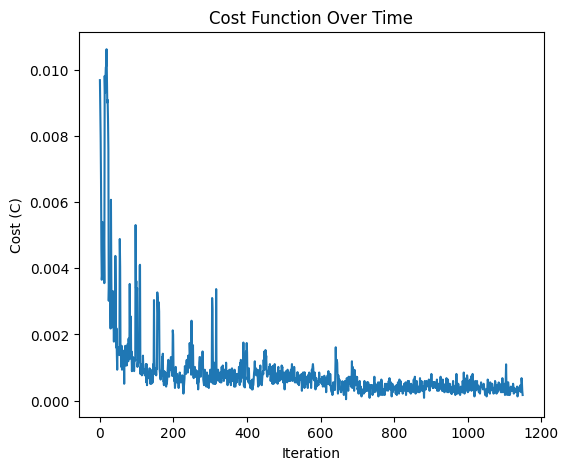

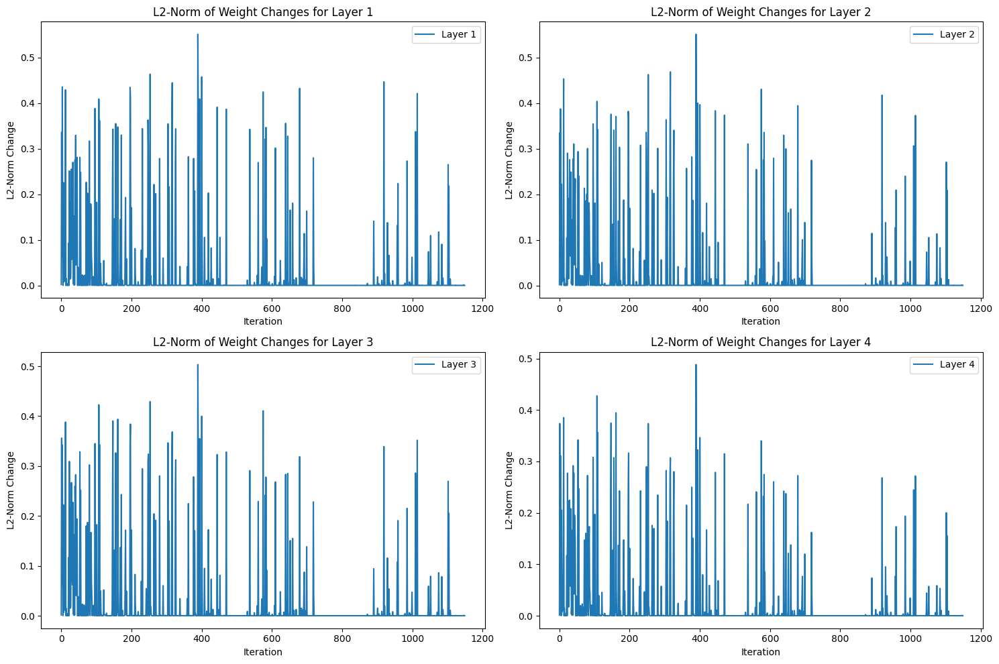

Accuracy of the model is 98.40%
Training with batch_size=500, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.011045968221414229


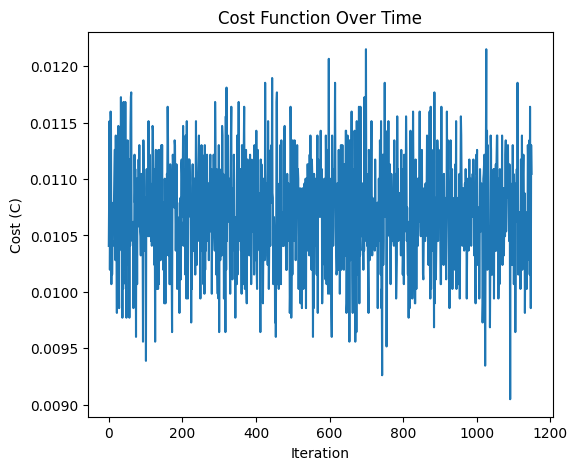

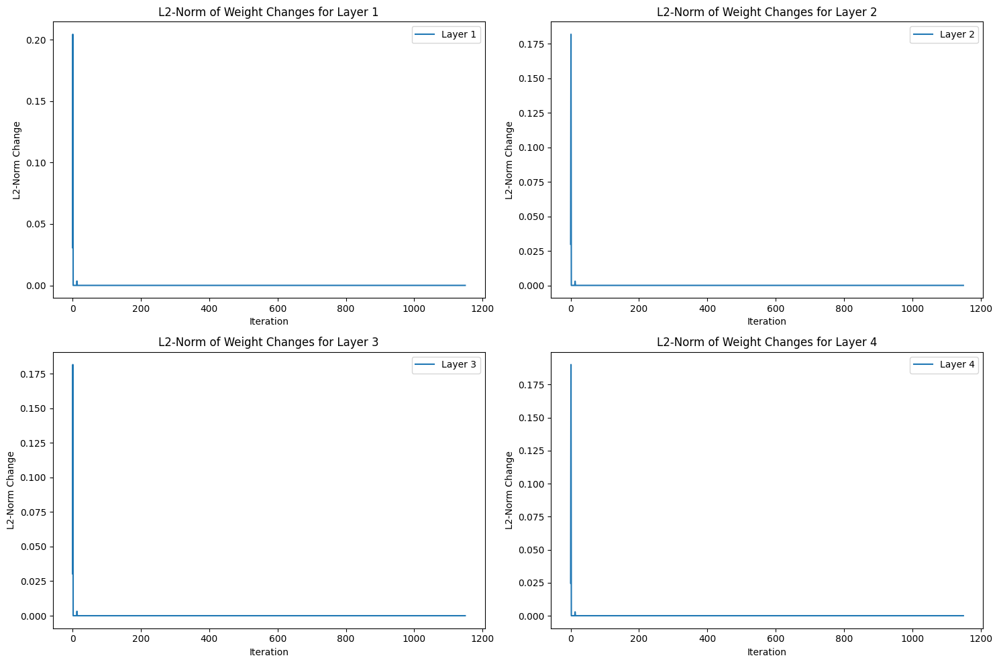

Accuracy of the model is 50.47%
Training with batch_size=500, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.0006797518905540114


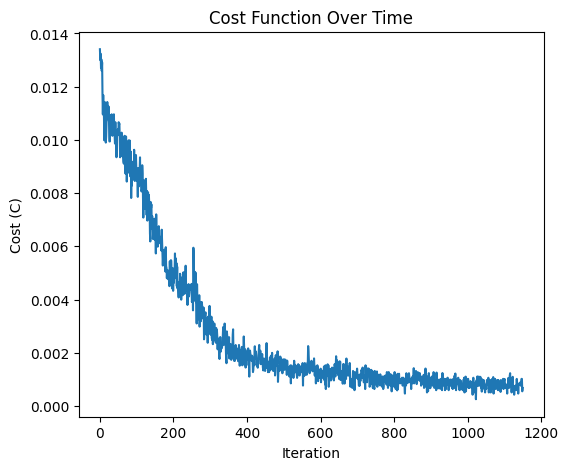

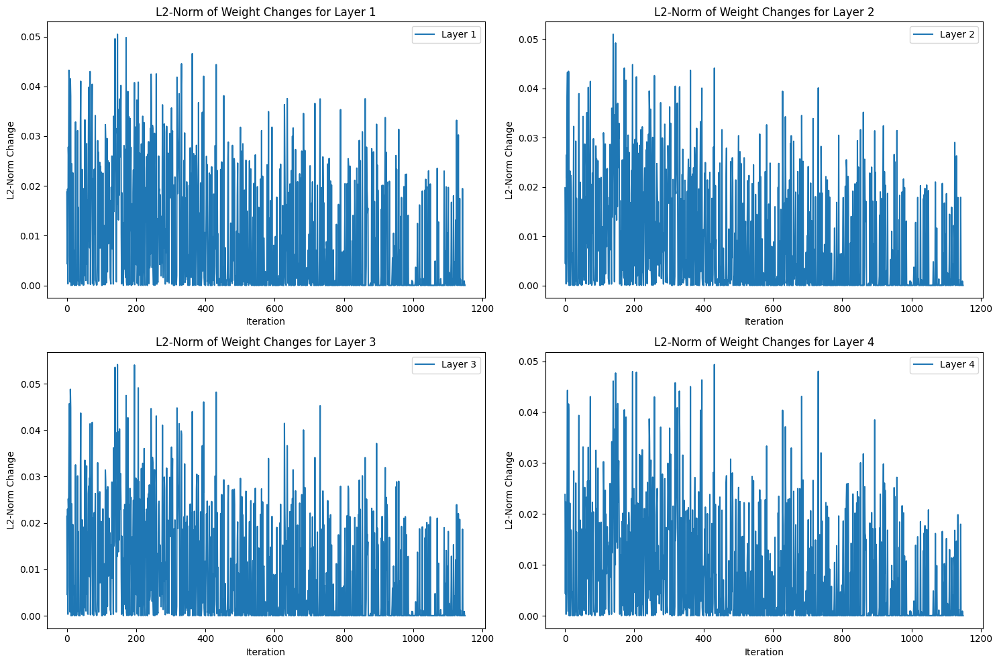

Accuracy of the model is 95.19%
Training with batch_size=500, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.00046732942369308365


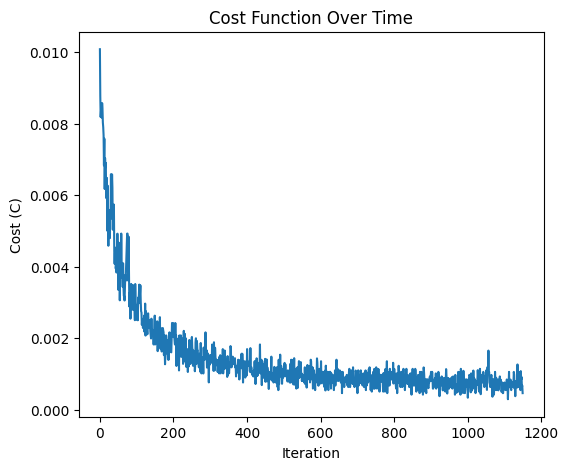

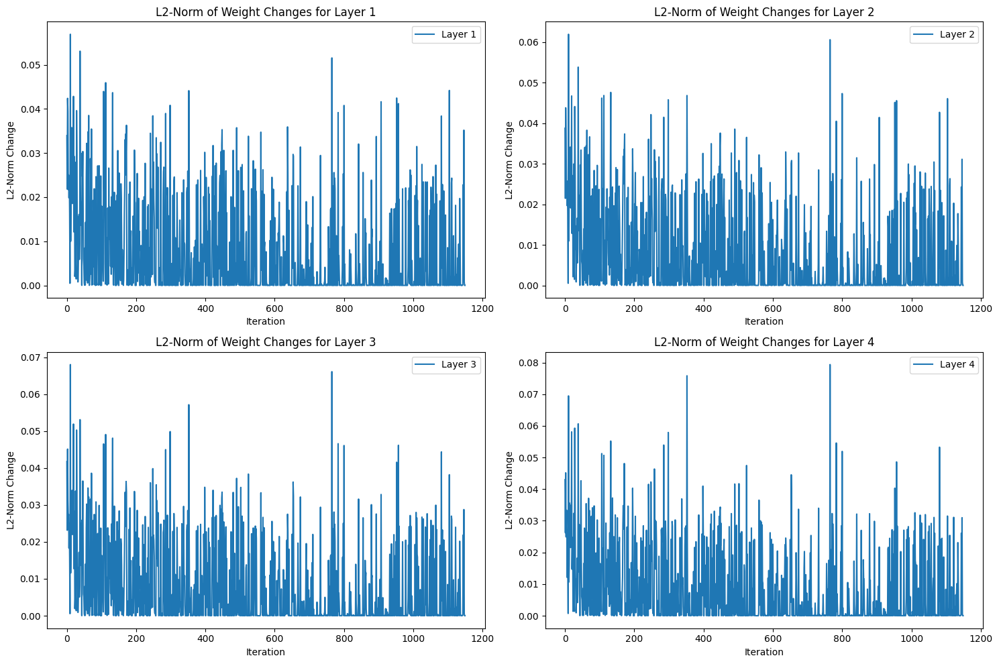

Accuracy of the model is 97.10%
Training with batch_size=500, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.010238762851559181


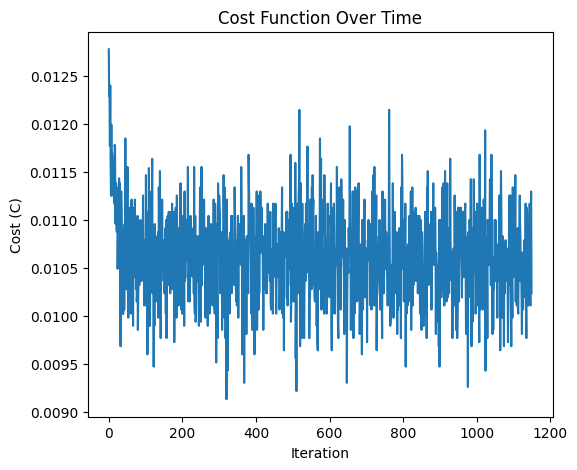

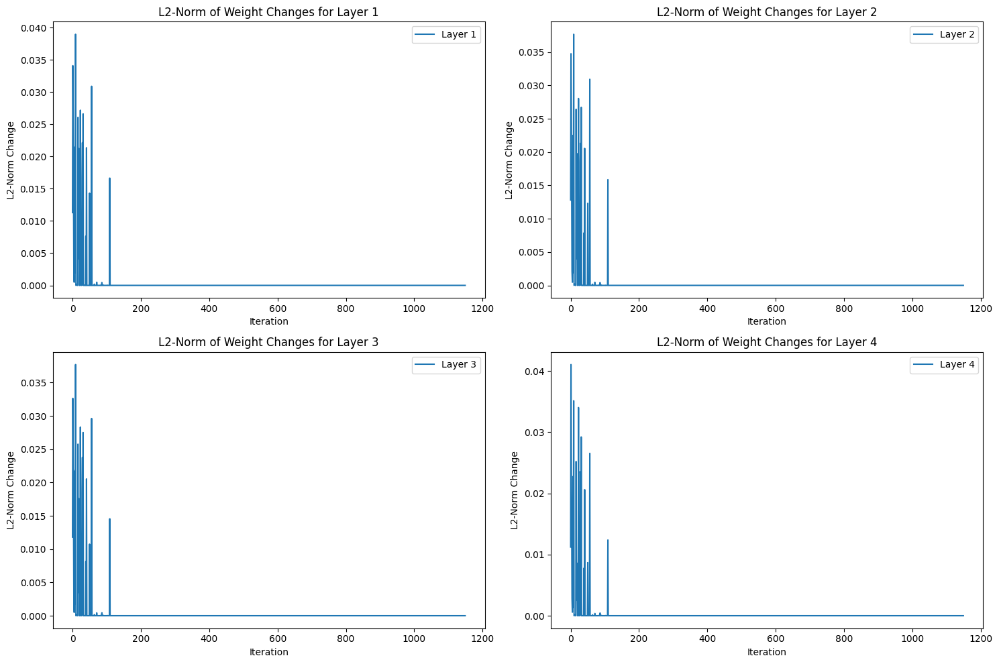

Accuracy of the model is 48.96%
Training with batch_size=800, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.016951312770838643


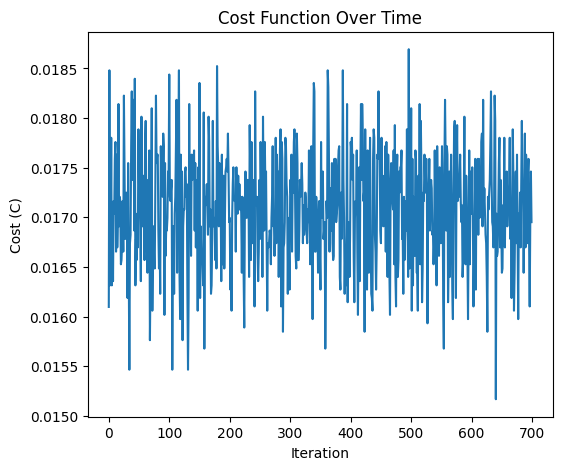

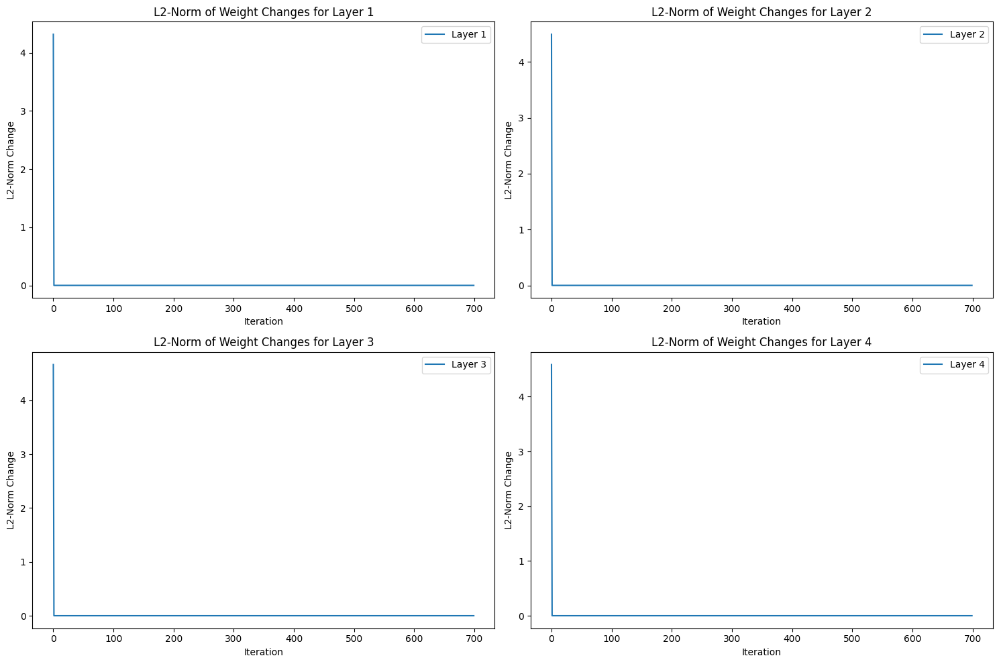

Accuracy of the model is 50.41%
Training with batch_size=800, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.0175036111819186


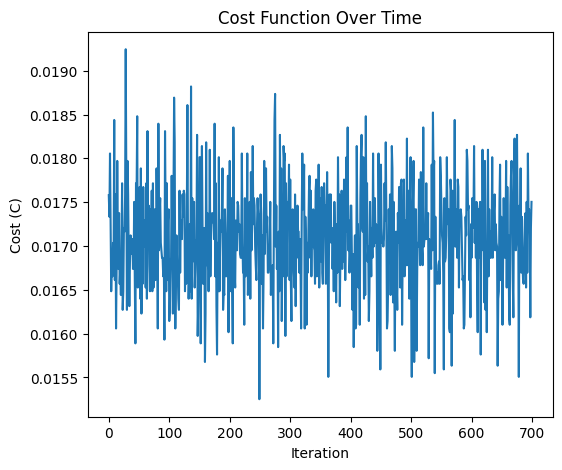

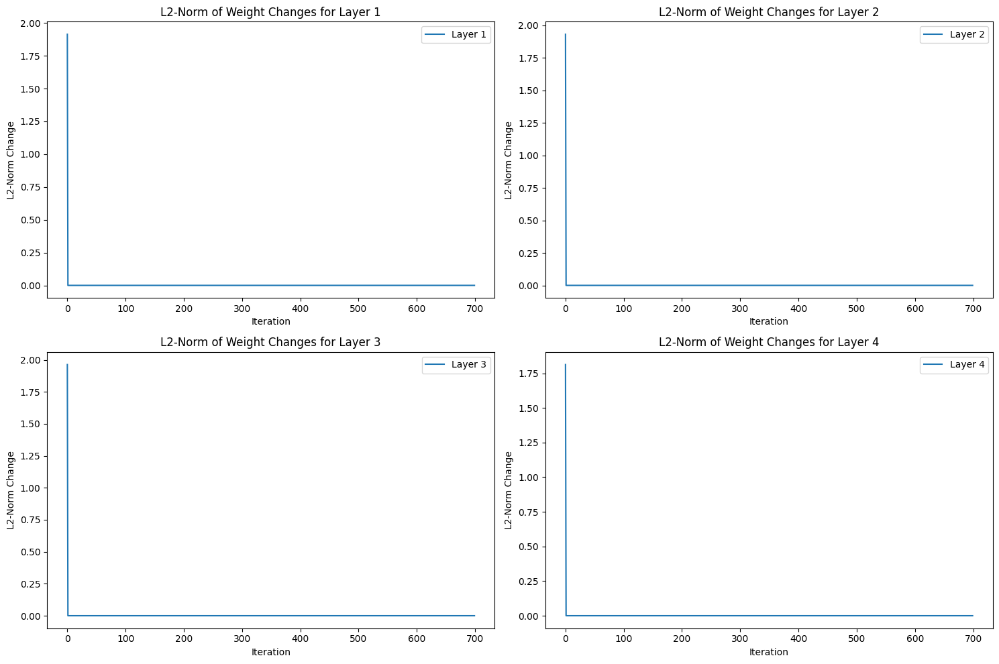

Accuracy of the model is 50.41%
Training with batch_size=800, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.01729118871611862


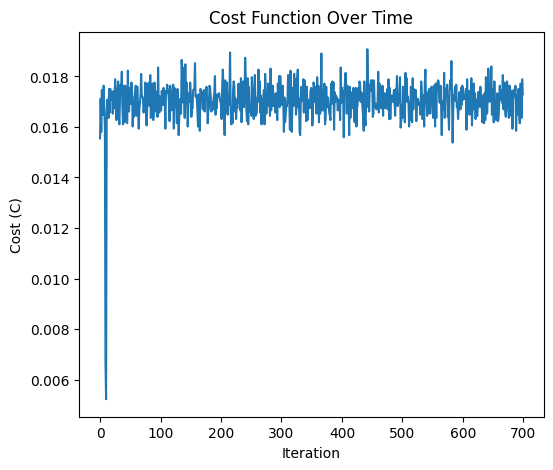

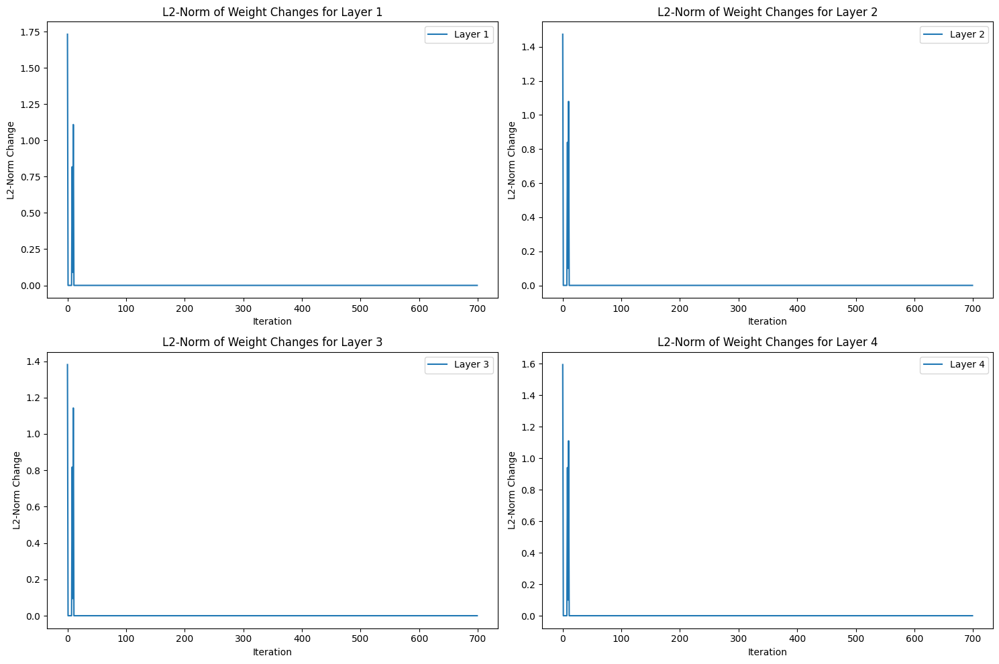

Accuracy of the model is 50.41%
Training with batch_size=800, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.0006797518908068453


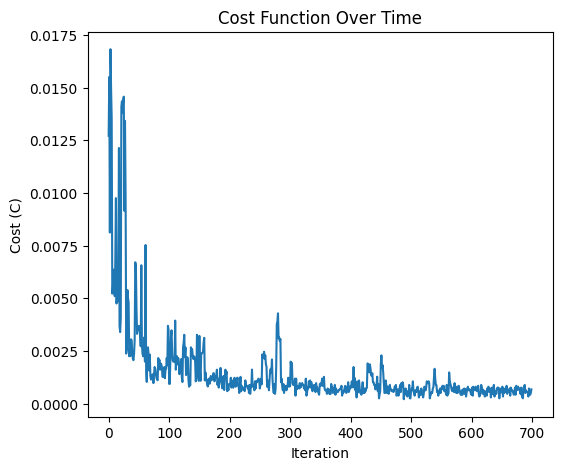

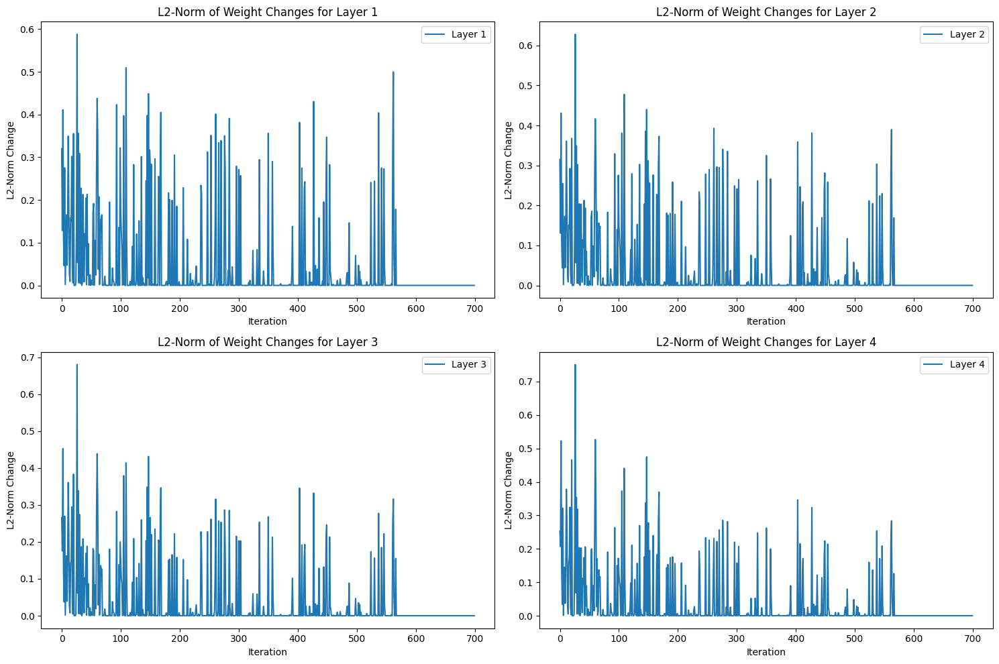

Accuracy of the model is 98.19%
Training with batch_size=800, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.0007647208768799389


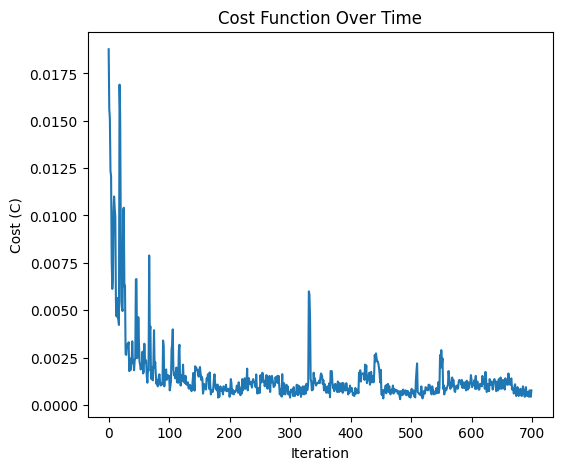

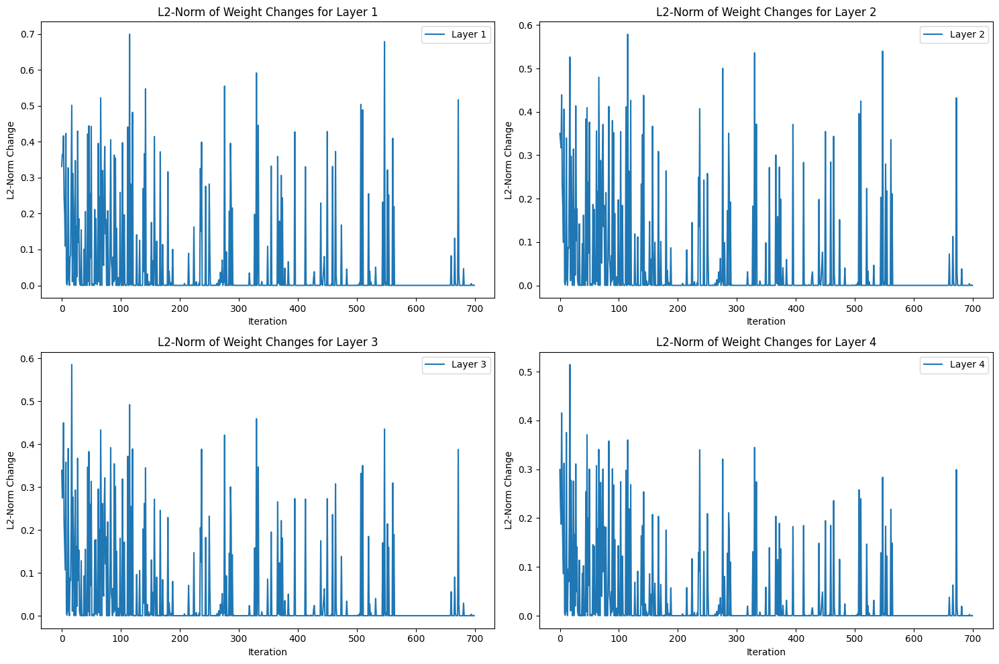

Accuracy of the model is 98.29%
Training with batch_size=800, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.018140878579318547


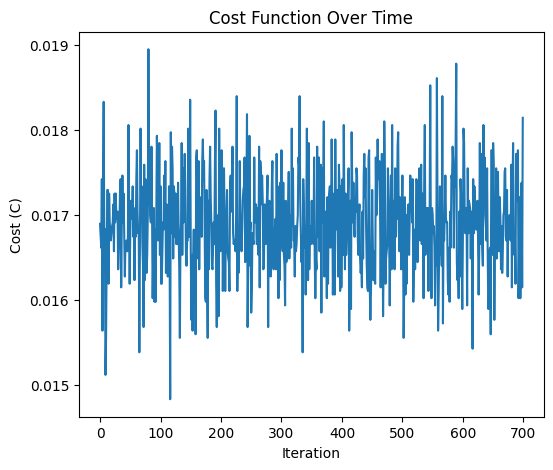

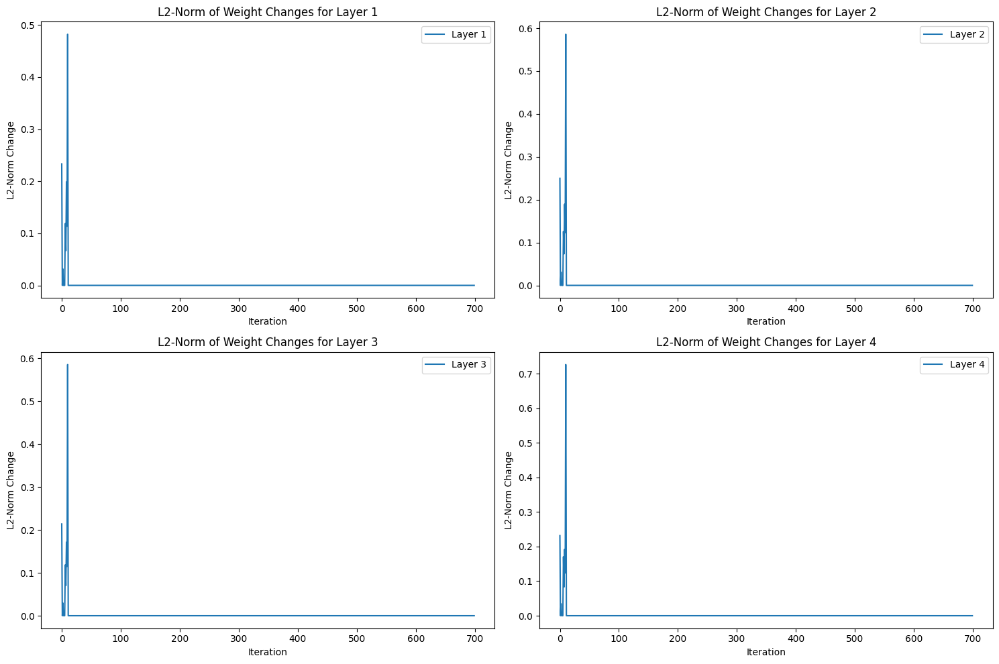

Accuracy of the model is 49.59%
Training with batch_size=800, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.016611436825558188


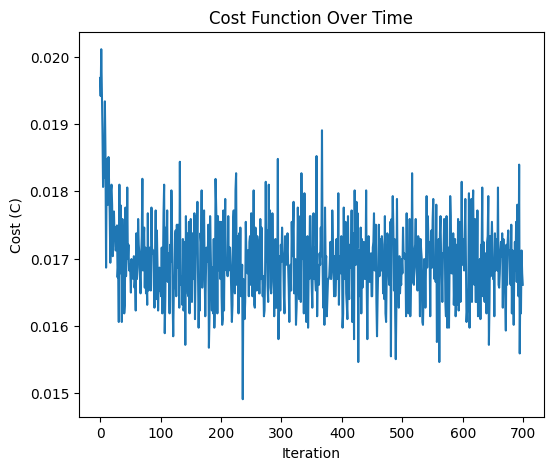

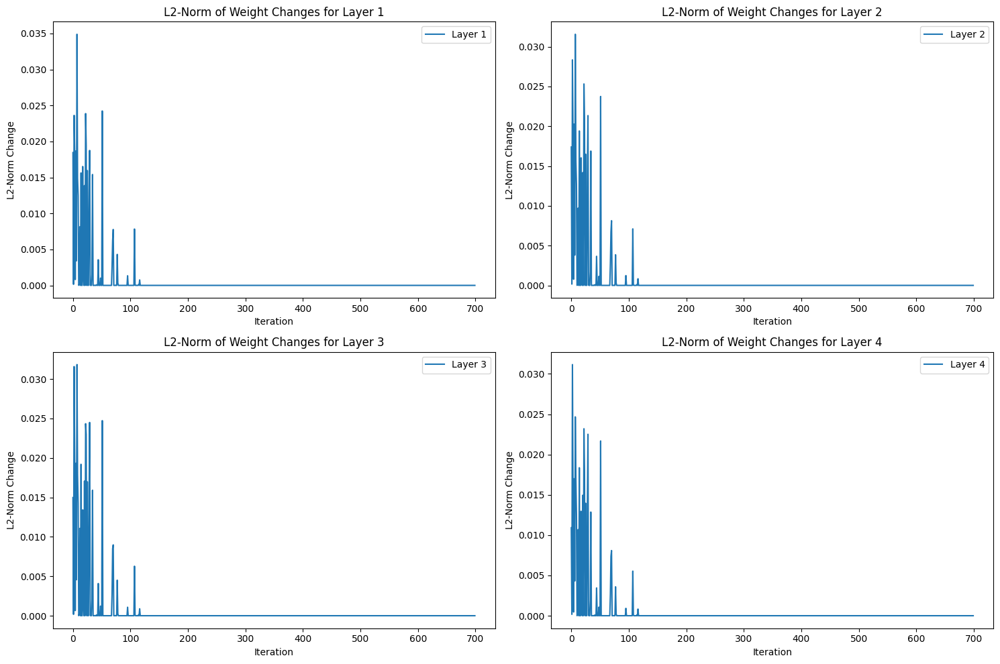

Accuracy of the model is 49.64%
Training with batch_size=800, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0014958972679590744


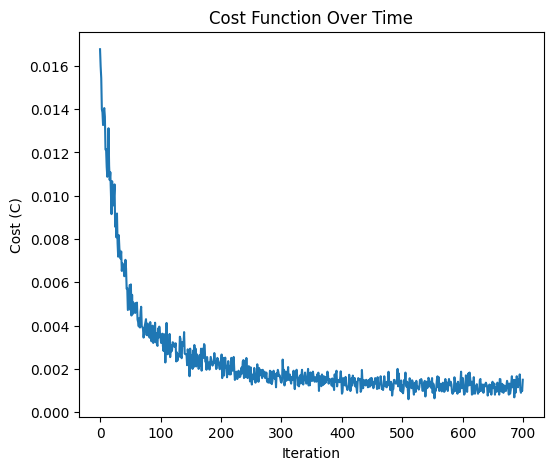

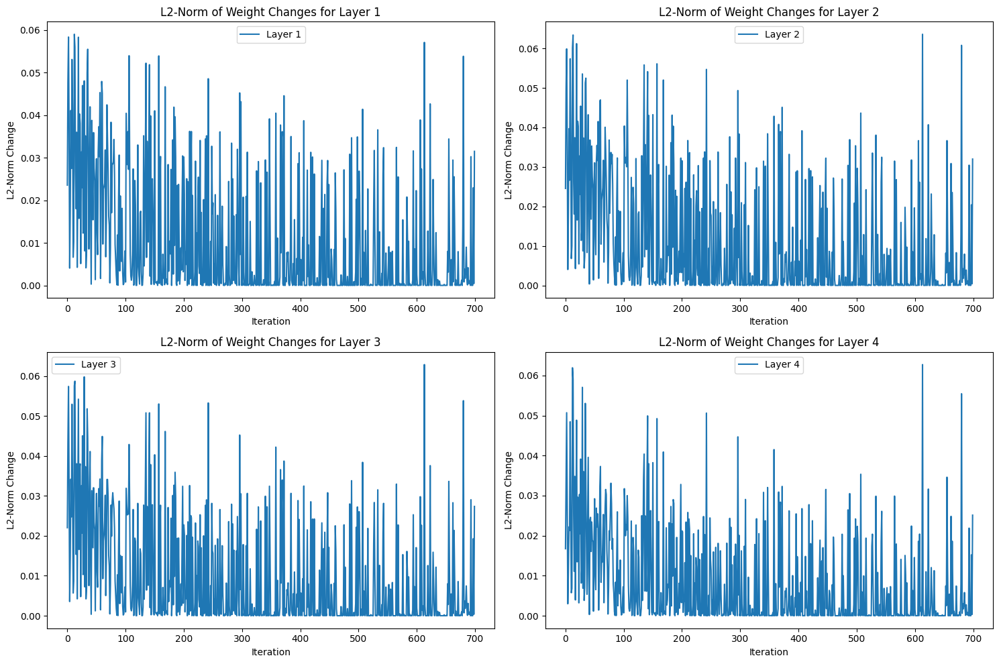

Accuracy of the model is 96.64%
Training with batch_size=800, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.017121249136611557


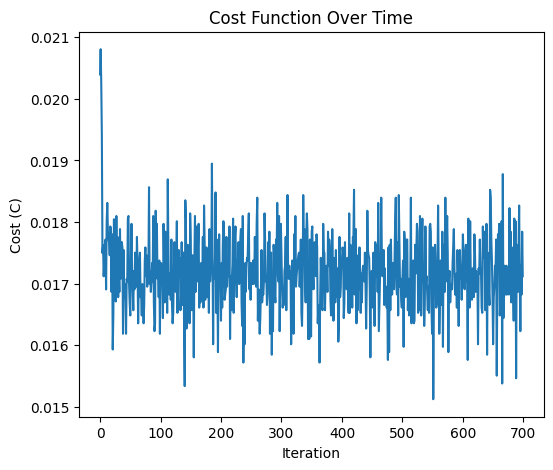

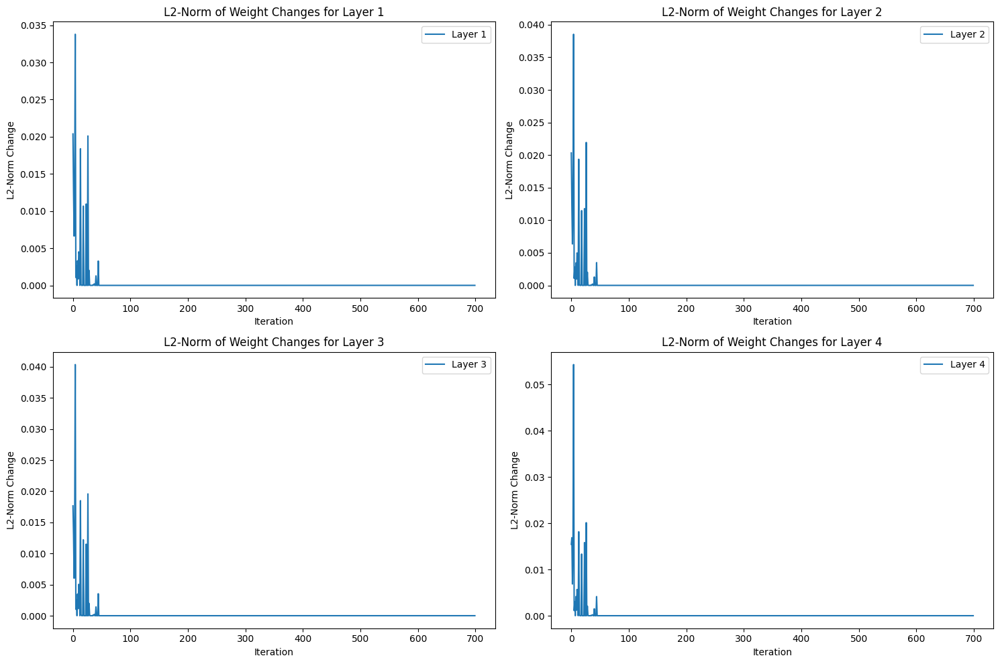

Accuracy of the model is 50.21%
Training with batch_size=1000, eta=0.01, hidden_layers=[400, 200, 100]
Cost:  0.021412184552638287


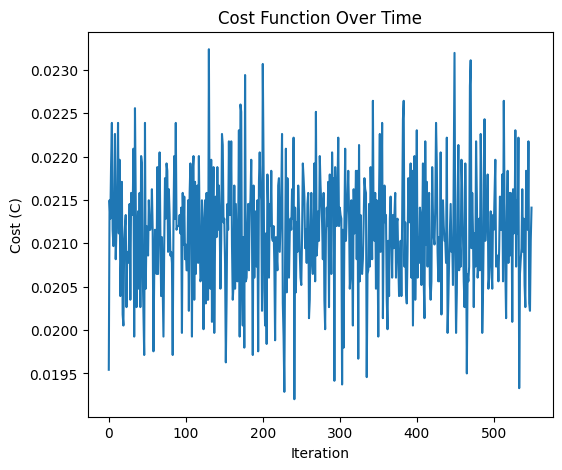

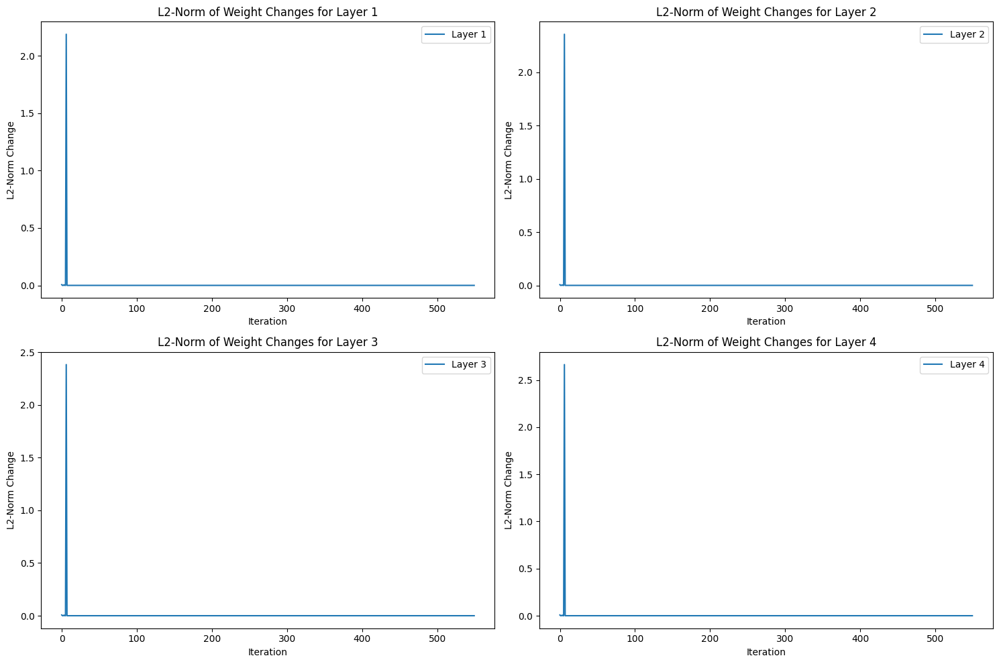

Accuracy of the model is 49.59%
Training with batch_size=1000, eta=0.01, hidden_layers=[450, 250, 100]
Cost:  0.020817401648398334


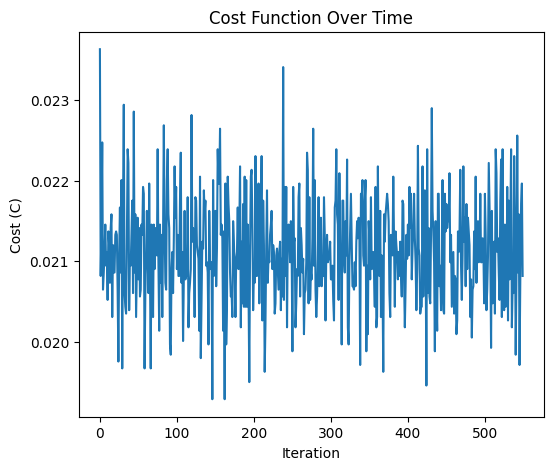

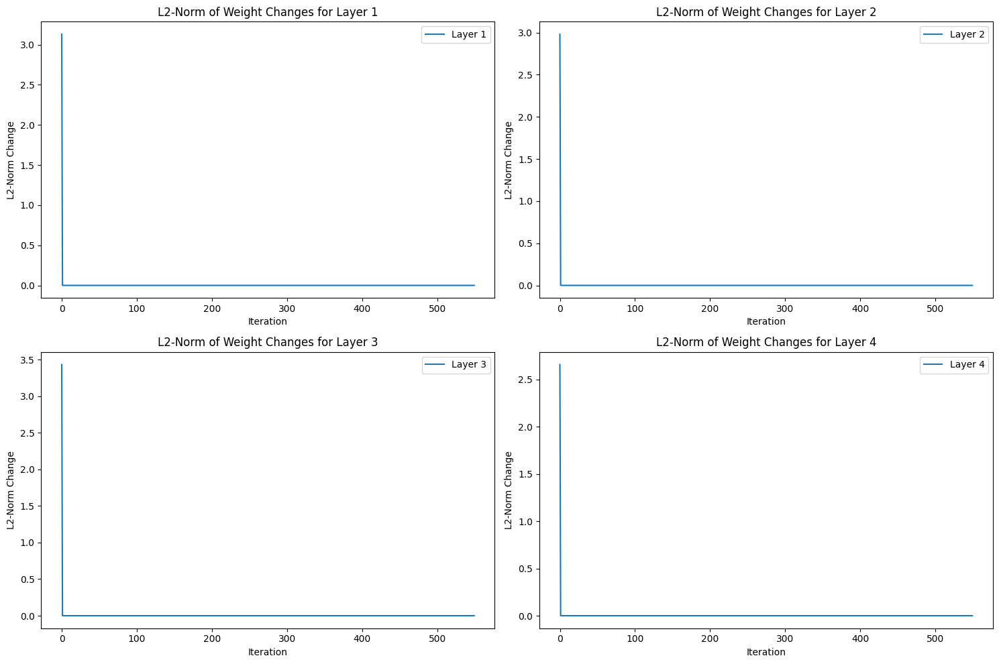

Accuracy of the model is 49.59%
Training with batch_size=1000, eta=0.01, hidden_layers=[500, 250, 50]
Cost:  0.021242246579998302


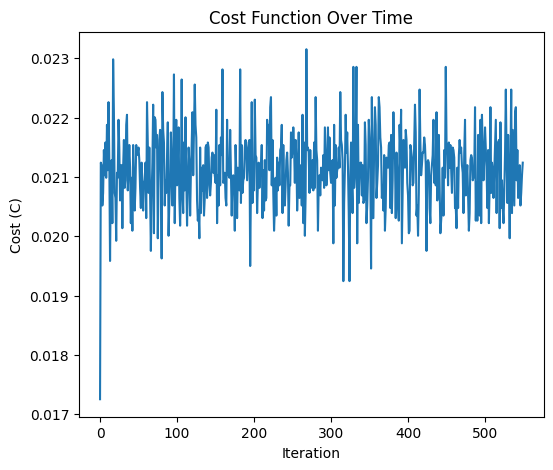

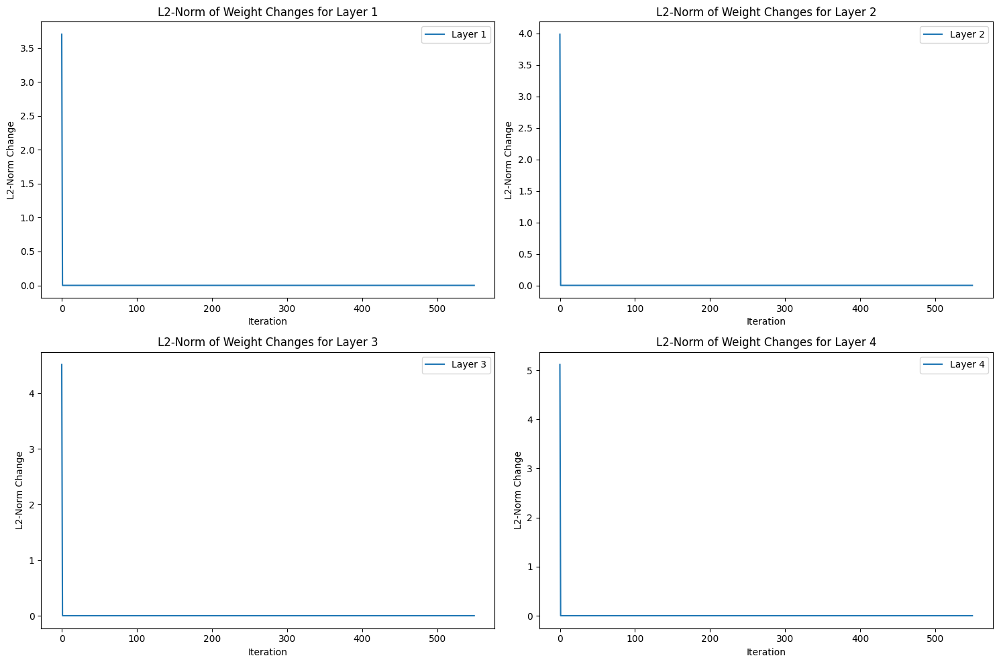

Accuracy of the model is 49.59%
Training with batch_size=1000, eta=0.001, hidden_layers=[400, 200, 100]
Cost:  0.0006372673973999491


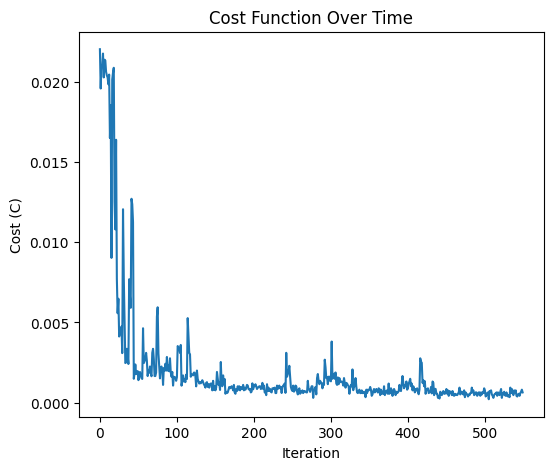

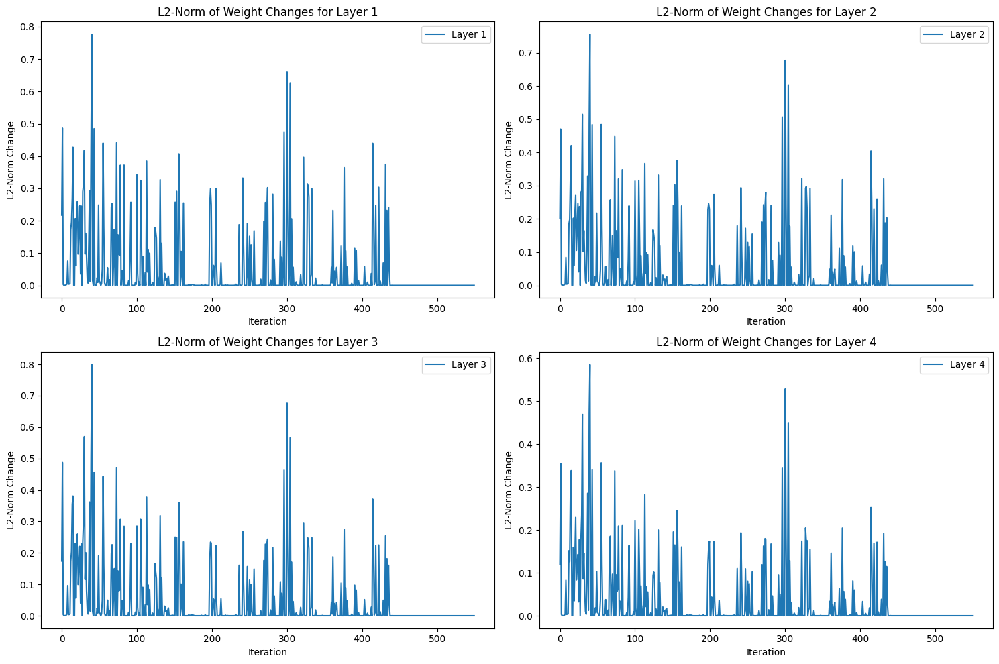

Accuracy of the model is 98.65%
Training with batch_size=1000, eta=0.001, hidden_layers=[450, 250, 100]
Cost:  0.020859886141558332


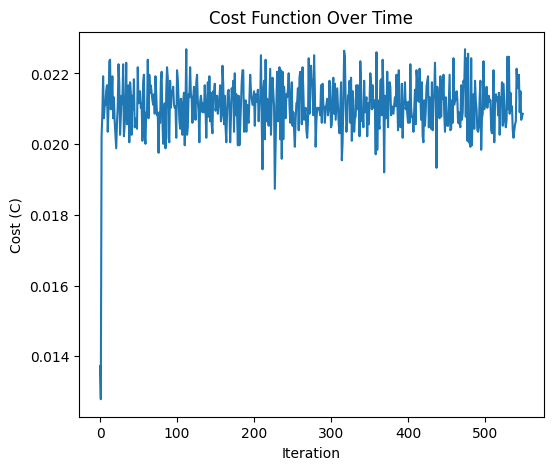

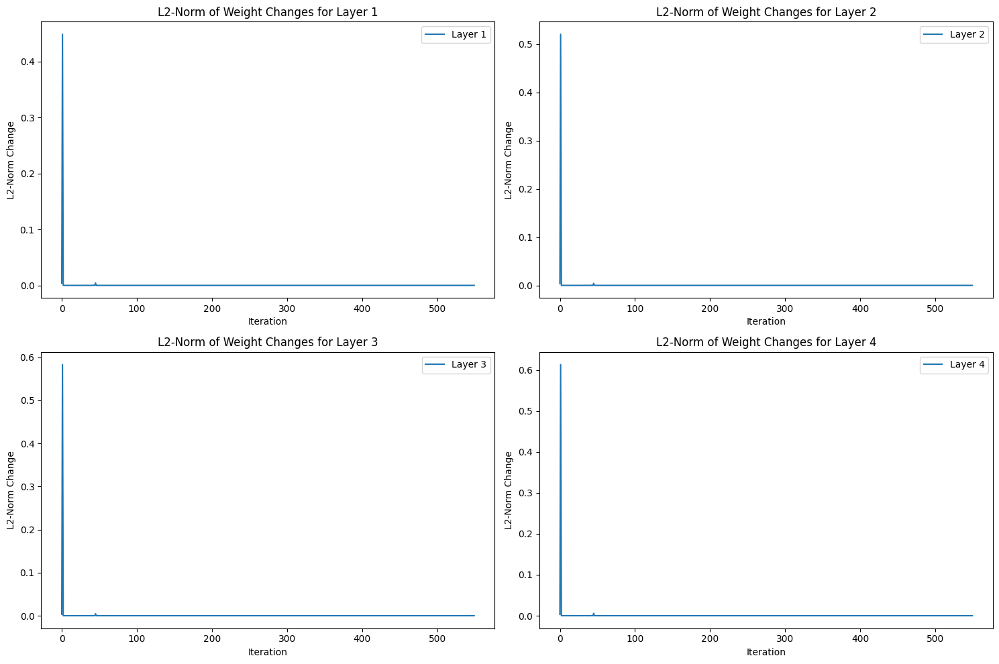

Accuracy of the model is 49.59%
Training with batch_size=1000, eta=0.001, hidden_layers=[500, 250, 50]
Cost:  0.0013169455882428812


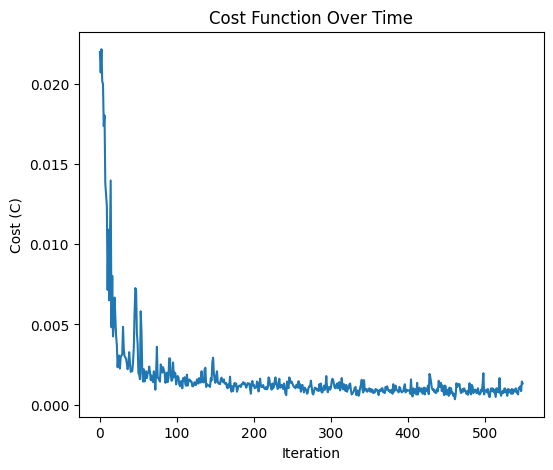

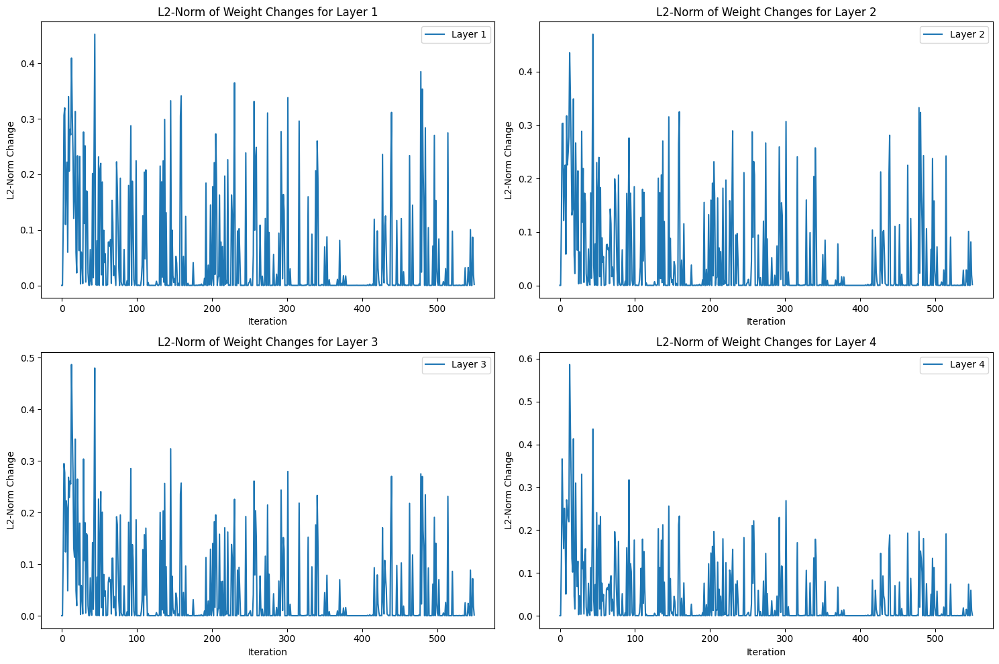

Accuracy of the model is 96.95%
Training with batch_size=1000, eta=0.0001, hidden_layers=[400, 200, 100]
Cost:  0.0012320481009593304


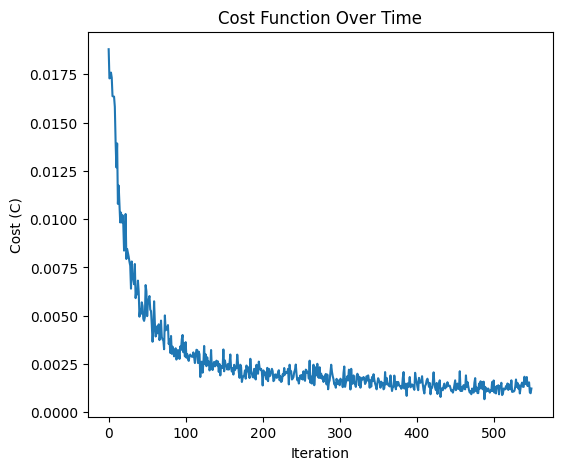

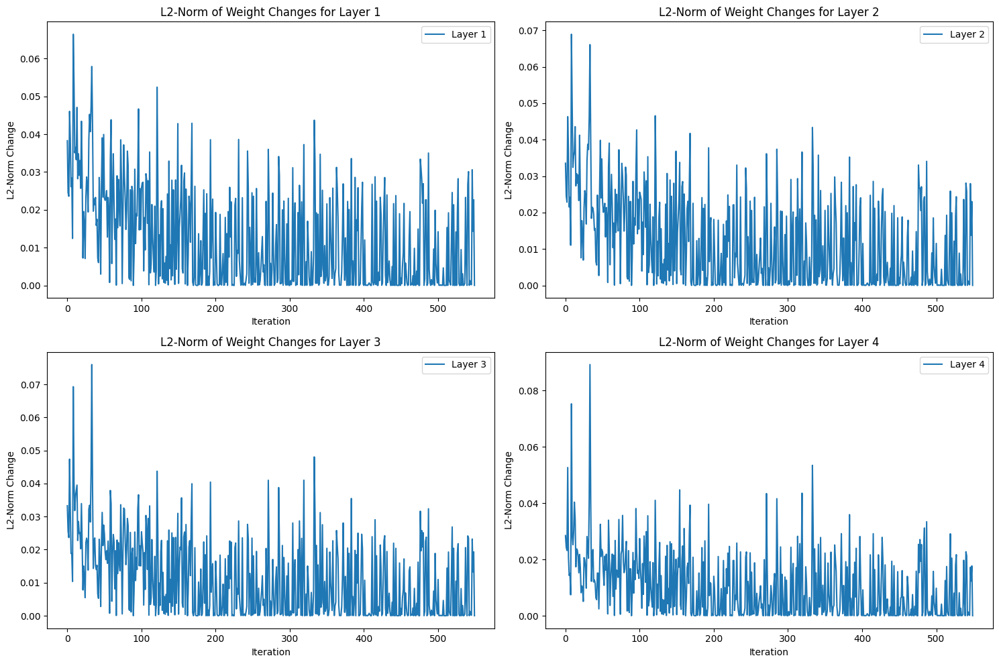

Accuracy of the model is 96.69%
Training with batch_size=1000, eta=0.0001, hidden_layers=[450, 250, 100]
Cost:  0.0011470580589508673


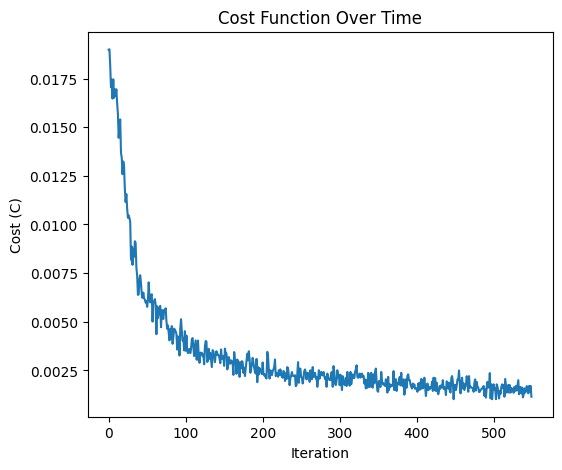

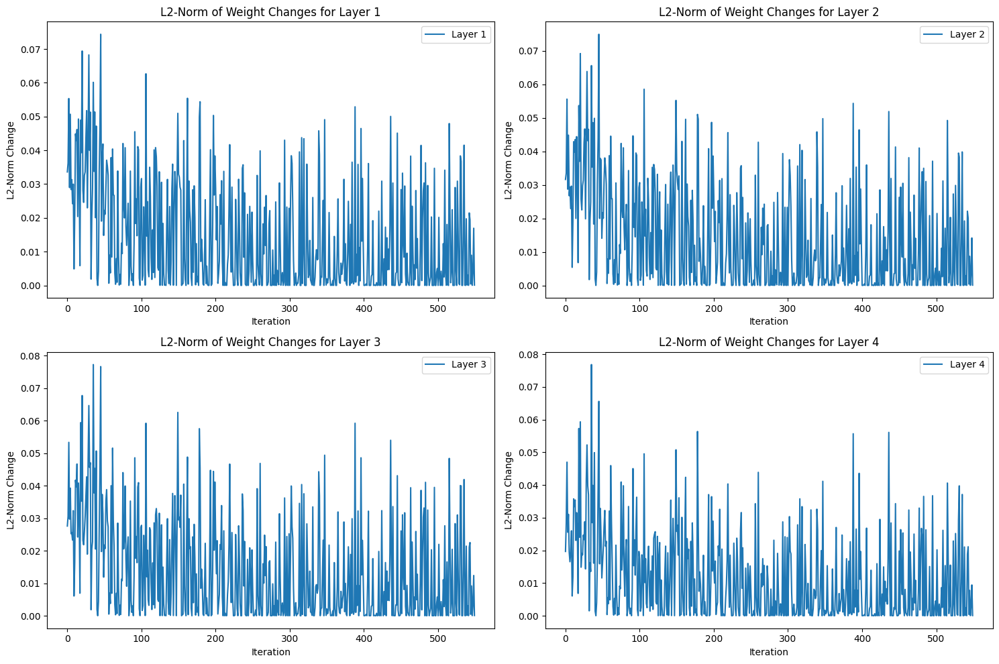

Accuracy of the model is 96.38%
Training with batch_size=1000, eta=0.0001, hidden_layers=[500, 250, 50]
Cost:  0.021921998470558247


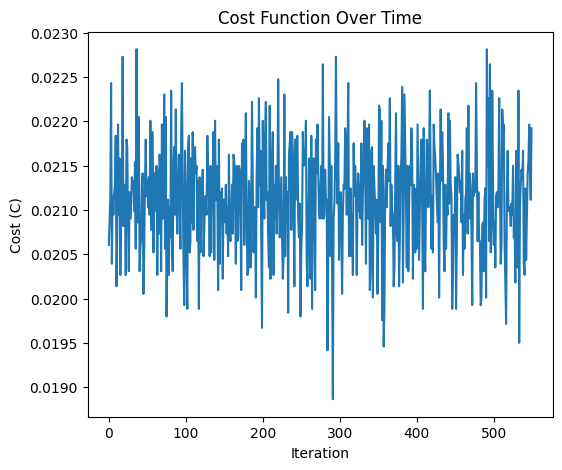

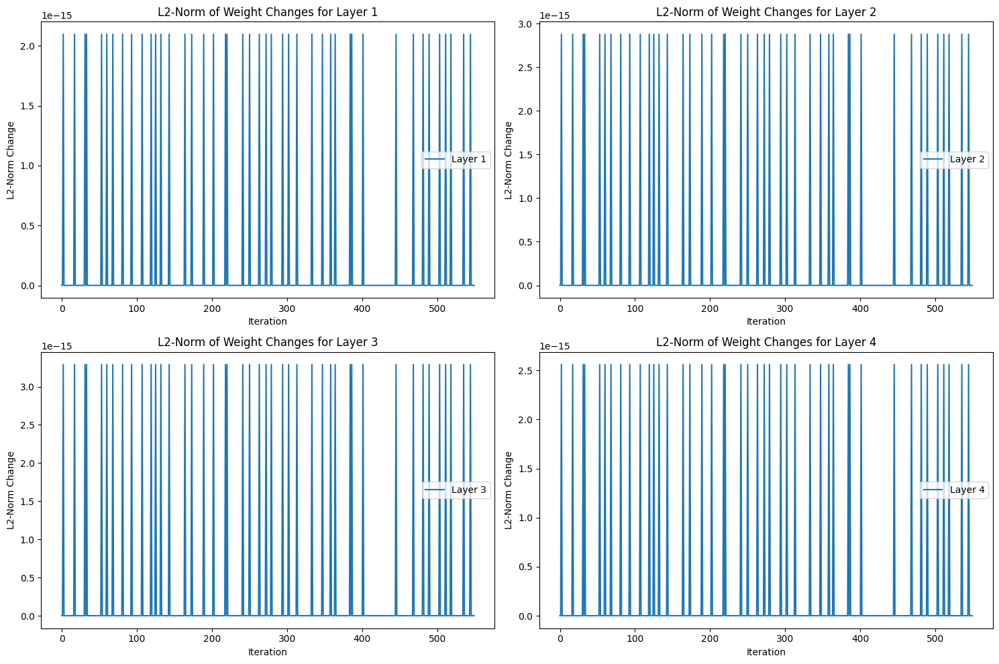

Accuracy of the model is 49.64%
{'accuracy': 0.9865424430641822, 'batch_size': 1000, 'eta': 0.001, 'hidden_layers': [400, 200, 100]}


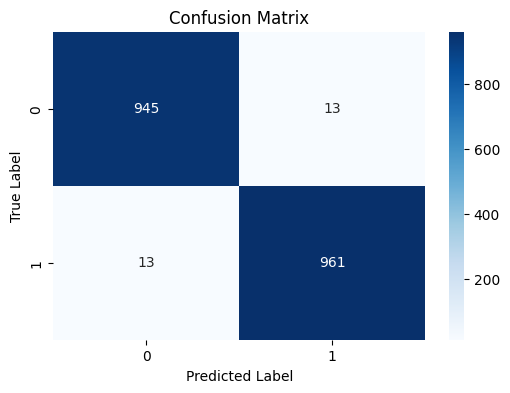

In [146]:
#CODE 3

#classify 6 and 8
batch_sizes = [500, 800, 1000]
learning_rates = [0.01, 0.001, 0.0001]
hidden_layer_configs = [[400, 200, 100], [450, 250, 100], [500, 250, 50] ]

best_accuracy =0
best_hyperparameters = {}
best_Y_predicted = []

for batch_size in batch_sizes:
    for eta in learning_rates:
        for hidden_layers in hidden_layer_configs:
            print(f"Training with batch_size={batch_size}, eta={eta}, hidden_layers={hidden_layers}")
            
            (train_X_6_8 ,train_class_6_8),(test_X_6_8,test_class_6_8) = transform_data_and_labels(train_X, train_y, test_X, test_y, 6, 8)

            trained_model = train_NNet(train_X_6_8, train_class_6_8, epochs = 50, batch_size=batch_size, eta = eta,hidden_layers = hidden_layers)

            # Evaluate the trained model on the test data
            test_X_6_8_extracted , test_y_6_8 = extract_digits(test_X, test_y, 6, 8)
            accuracy, Y_predicted = test_model(test_X_6_8, test_y_6_8, trained_model, 6, 8)  
            print(f"Accuracy of the model is {accuracy * 100:.2f}%")

            # Track the best performing model
            if accuracy > best_accuracy:
                best_accuracy = accuracy
                best_hyperparameters = {
                'accuracy': accuracy,  # Convert to percentage
                'batch_size': batch_size,
                'eta': eta,
                'hidden_layers': hidden_layers
                }
                best_Y_predicted = Y_predicted

print(best_hyperparameters)
plot_confusion_matrix(test_y_6_8, best_Y_predicted)
